# Transformation and Decomposition. Taks1

    author: Oleg Naidovich

In [1]:
from tsdata.raw import available_data, load_data

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
plt.rcParams["figure.figsize"] = (18, 8)
pd.set_option('display.max_columns', 500)

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf
from statsmodels.distributions.empirical_distribution import ECDF
import scipy.stats as st

from sklearn.metrics import mean_absolute_error

import warnings
warnings.filterwarnings('ignore')

C:\Users\Oleg_Naidovich\Anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
def plot_series(data, legend='', title=''):
    plt.figure(figsize=(20, 5))
    plt.plot(data, '-d', color='navy', markersize=3)
    plt.legend([legend], loc='upper right')
    plt.grid(linestyle=':', color='k')
    plt.title(title)


def plot_decomposition(decomposition):
    plt.subplots(3, 1, figsize=(20, 21))

    plt.subplot(3, 1, 1)
    plt.plot(decomposition.trend, color='navy', markersize=3, label='trend')
    plt.legend(loc='upper right')
    plt.grid(linestyle=':', color='k')
    plt.title("Trend")


    plt.subplot(3, 1, 2)
    plt.plot(decomposition.seasonal, 
             '-gd', markersize=3, label='seasonal')
    plt.plot([decomposition.seasonal.index[0], decomposition.seasonal.index[-1]], 
             decomposition.seasonal.mean()*np.array([1, 1]), '--k', 
             label=f"mean = {decomposition.seasonal.mean():.3g}")
    plt.legend(loc='upper right')
    plt.grid(linestyle=':', color='k')
    plt.title(f"Seasonal : range={(decomposition.seasonal.max() - decomposition.seasonal.min()):.3g}")


    plt.subplot(3, 1, 3)
    plt.plot(decomposition.resid, '-o', color='maroon', markersize=3,  label='residuals')
    plt.plot([decomposition.resid.index[0], decomposition.resid.index[-1]], 
             decomposition.resid.mean()*np.array([1, 1]), '--k', 
             label=f"mean = {decomposition.resid.mean():.3g}")
    plt.legend(loc='upper right')
    plt.grid(linestyle=':', color='k')
    plt.title("Residuals")

    plt.show()
    

def plot_ACF(data, decomposition, lags=50):
#     if lags == None:
#         lags = len(data) - 1

    fig, axes = plt.subplots(4, 1, figsize=(15, 4*6))
    
!    plot_acf(data, ax=axes[0], 
             lags=lags, 
             vlines_kwargs={'color' : 'b'},
             markerfacecolor='b', markeredgecolor='b', 
             title='Autocorrelation of target');

    trend = decomposition.trend
    plot_acf(trend.dropna(), 
             lags=lags, 
             vlines_kwargs={'color' : 'navy'}, 
             markerfacecolor='navy', markeredgecolor='navy', 
             title='Autocorrelation of trend');

    seasonal = decomposition.seasonal
    plot_acf(seasonal, 
             lags=lags, 
             vlines_kwargs={'color' : 'g'}, 
             markerfacecolor='g', markeredgecolor='g', 
             title='Autocorrelation of seasonal');

    resid = decomposition.resid
    plot_acf(resid.dropna(), 
             lags=lags,   
             vlines_kwargs={'color' : 'maroon'}, 
             markerfacecolor='maroon', markeredgecolor='maroon', 
             title='Autocorrelation of residuals');


    plt.show()
    
    
def plot_PACF(data, decomposition, lags=36):
    plot_pacf(data, 
             lags=lags, 
             vlines_kwargs={'color' : 'b'},
             markerfacecolor='b', markeredgecolor='b', 
             title='Partial autocorrelation of target');

    trend = decomposition.trend
    plot_pacf(trend.dropna(), 
             lags=lags, 
             vlines_kwargs={'color' : 'navy'}, 
             markerfacecolor='navy', markeredgecolor='navy', 
             title='Partial autocorrelation of trend');

    seasonal = decomposition.seasonal
    try:
        plot_pacf(seasonal, 
                 lags=lags, 
                 vlines_kwargs={'color' : 'g'}, 
                 markerfacecolor='g', markeredgecolor='g', 
                 title='Partial autocorrelation of seasonal')
    except Exception as exc:
        print(exc)
        

    resid = decomposition.resid
    try:
        plot_pacf(resid.dropna(), 
                 lags=lags,   
                 vlines_kwargs={'color' : 'maroon'}, 
                 markerfacecolor='maroon', markeredgecolor='maroon', 
                 title='Partial autocorrelation of residuals')
    except Exception as exc:
        print(exc)

    plt.show()
    
def resid_analytics(resid):
    resid = resid.dropna()
    color = 'maroon'

    plt.subplots(1, 2, figsize=(24, 8))

    plt.subplot(1, 2, 1)
    plt.plot(resid, '-', color=color)
    plt.grid(linestyle=':', color='k')
    plt.title("Residuals")

    x_fit = np.linspace(resid.min(), resid.max(), 201)
    loc_laplace, scale_laplace = st.laplace.fit(resid.dropna())
    loc_norm, scale_norm = st.norm.fit(resid.dropna())
    # print(f"Fitting of residuals by Laplace distribution: fitted mean = {loc:.3f}, fitted std = {scale:.3f}")
    y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
    y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)

    plt.subplot(1, 2, 2)
    sns.distplot(resid, color=color, bins=100, vertical=True, label="distribution of residuals")
    plt.plot(y_fit_laplace, x_fit, '-b', 
             label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.4g}, fitted std = {scale_laplace:.4g}")
    plt.plot(y_fit_norm, x_fit, '-g', 
             label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.4g}, fitted std = {scale_norm:.4g}")
    plt.legend()
    # plt.ylim(resid-0.02*y_range, y_max+0.02*y_range)
    plt.title("Distribution of residuals")
    plt.grid(linestyle=':', color='k')

    plt.show()
    
    
    ecdf_resid_instance = ECDF(resid.dropna())
    resid_arr = resid.dropna().sort_values().values
    ecdf_resid = ecdf_resid_instance(resid_arr)


    cdf_norm = st.norm.cdf(resid_arr, loc=loc_norm, scale=scale_norm)
    cdf_laplace = st.laplace.cdf(resid_arr, loc=loc_laplace, scale=scale_laplace)


    mae_norm = mean_absolute_error(ecdf_resid, cdf_norm)
    mae_laplace = mean_absolute_error(ecdf_resid, cdf_laplace)


    plt.subplots(1, 1, figsize=(20, 8))
    plt.plot(resid_arr, ecdf_resid, '-', color='maroon')
    plt.plot(resid_arr, cdf_norm, '-g', 
             label=f"Normal approx : MAE = {mae_norm:.3g}")
    plt.plot(resid_arr, cdf_laplace, '-b', 
             label=f"Laplace approx: MAE = {mae_laplace:.3g}")
    plt.legend()
    plt.title("CDF of decomposition residuals")
    plt.show()
    
    get_stationary(resid)
    

class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

    
def get_stationary(data):
    alpha = 0.05
    print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====")
    result = adfuller(data.values, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] < alpha:
        print("The process is" + color.BOLD + color.GREEN + " stationary " + color.END + "by ADF.\n")
    else:
        print("The process is" + color.BOLD + color.RED + " non-stationary " + color.END + "by ADF.\n")
        
    # kpss test
    print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====')
    kpsstest = kpss(data.values, regression='c')
    print("KPSS Statistic = " + str(kpsstest[0]))
    print( "p-value = " + str(kpsstest[1]))
    if kpsstest[1] < alpha:
        print("The process is" + color.BOLD + color.RED + " non-stationary " + color.END + "by KPSS.\n")
    else:
        print("The process is" + color.BOLD + color.GREEN + " stationary " + color.END + "by KPSS.\n")



In [4]:
print(available_data())

['LakeHuron', 'PBS', 'ansett', 'aus_accommodation', 'aus_airpassengers', 'aus_arrivals', 'aus_livestock', 'aus_production', 'aus_retail', 'bank_calls', 'boston_marathon', 'canadian_gas', 'gafa_stock', 'global_economy', 'guinea_rice', 'hh_budget', 'insurance', 'nyc_bikes', 'olympic_running', 'pedestrian', 'pelt', 'prices', 'prison', 'souvenirs', 'tourism', 'tute1', 'us_change', 'us_employment', 'us_gas_total', 'us_gasoline', 'vic_elec']


# Task 1

Consider the GDP information in global_economy. Plot the GDP per capita for each country over time. Which country has the highest GDP per capita? How has this changed over time?



In [5]:
global_economy = load_data('global_economy')
global_economy.head(10)

,Country,Code,Year,GDP,Growth,CPI,Imports,Exports,Population
0,Afghanistan,AFG,1960,5.377778e+08,NaN,NaN,7.024793,4.132233,8996351.0
1,Afghanistan,AFG,1961,5.488889e+08,NaN,NaN,8.097166,4.453443,9166764.0
2,Afghanistan,AFG,1962,5.466667e+08,NaN,NaN,9.349593,4.878051,9345868.0
3,Afghanistan,AFG,1963,7.511112e+08,NaN,NaN,16.863910,9.171601,9533954.0
4,Afghanistan,AFG,1964,8.000000e+08,NaN,NaN,18.055555,8.888893,9731361.0
5,Afghanistan,AFG,1965,1.006667e+09,NaN,NaN,21.412803,11.258279,9938414.0
6,Afghanistan,AFG,1966,1.400000e+09,NaN,NaN,18.571429,8.571429,10152331.0
7,Afghanistan,AFG,1967,1.673333e+09,NaN,NaN,14.209827,6.772908,10372630.0
8,Afghanistan,AFG,1968,1.373333e+09,NaN,NaN,15.210356,8.899677,10604346.0
9,Afghanistan,AFG,1969,1.408889e+09,NaN,NaN,14.984227,10.094637,10854428.0


In [6]:
print(f"Number of unique Code:    {len(global_economy['Code'].unique())}")
print(f"Number of unique Country: {len(global_economy['Country'].unique())}")

Number of unique Code:    263
Number of unique Country: 263


In [7]:
global_economy.isna().sum(axis=0)

Country          0
Code             0
Year             0
GDP           3322
Growth        3756
CPI           7480
Imports       4554
Exports       4563
Population       3
dtype: int64

In [8]:
global_economy['Year'].value_counts()

2004    263
2007    263
1999    263
2000    263
2001    263
2002    263
2003    263
2005    263
2006    263
2008    263
2009    263
2010    263
2011    263
1998    263
1997    262
1996    262
1995    262
1994    262
1993    262
1992    262
1991    262
2017    262
2012    262
2013    262
2014    262
2015    262
2016    262
1990    262
1961    260
1960    260
1988    260
1987    260
1962    260
1963    260
1964    260
1965    260
1966    260
1967    260
1968    260
1969    260
1970    260
1971    260
1972    260
1973    260
1974    260
1975    260
1976    260
1977    260
1978    260
1979    260
1980    260
1981    260
1982    260
1983    260
1984    260
1985    260
1986    260
1989    260
Name: Year, dtype: int64

In [9]:
global_economy_pivot = global_economy.pivot_table(values='GDP', index='Country', columns='Year', dropna=False).reset_index()
global_economy_pivot.head(10)

Year,Country,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Afghanistan,5.377778e+08,5.488889e+08,5.466667e+08,7.511112e+08,8.000000e+08,1.006667e+09,1.400000e+09,1.673333e+09,1.373333e+09,1.408889e+09,1.748887e+09,1.831109e+09,1.595555e+09,1.733333e+09,2.155555e+09,2.366667e+09,2.555556e+09,2.953333e+09,3.300000e+09,3.697940e+09,3.641723e+09,3.478788e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.055180e+09,4.515559e+09,5.226779e+09,6.209138e+09,6.971286e+09,9.747880e+09,1.010923e+10,1.243909e+10,1.585657e+10,1.780429e+10,1.990732e+10,2.056107e+10,2.048489e+10,1.990711e+10,1.904636e+10,1.954398e+10
1,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.857338e+09,1.897050e+09,2.097326e+09,2.080796e+09,2.051236e+09,2.253090e+09,2.028554e+09,1.099559e+09,6.521750e+08,1.185315e+09,1.880952e+09,2.392765e+09,3.199641e+09,2.258514e+09,2.545965e+09,3.212122e+09,3.480355e+09,3.922101e+09,4.348068e+09,5.611496e+09,7.184686e+09,8.052074e+09,8.896073e+09,1.067732e+10,1.288135e+10,1.204421e+10,1.192696e+10,1.289087e+10,1.231978e+10,1.277628e+10,1.322825e+10,1.138693e+10,1.188368e+10,1.303854e+10
2,Algeria,2.723649e+09,2.434777e+09,2.001469e+09,2.703015e+09,2.909352e+09,3.136259e+09,3.039835e+09,3.370843e+09,3.852116e+09,4.257219e+09,4.863487e+09,5.077222e+09,6.761786e+09,8.715106e+09,1.320971e+10,1.555793e+10,1.772835e+10,2.097190e+10,2.636449e+10,3.324342e+10,4.234528e+10,4.434867e+10,4.520709e+10,4.880137e+10,5.369828e+10,5.793787e+10,6.369630e+10,6.674227e+10,5.908907e+10,5.563149e+10,6.204510e+10,4.571537e+10,4.800330e+10,4.994646e+10,4.254257e+10,4.176405e+10,4.694150e+10,4.817786e+10,4.818775e+10,4.864057e+10,5.479025e+10,5.474471e+10,5.676029e+10,6.786383e+10,8.532500e+10,1.031982e+11,1.170273e+11,1.349771e+11,1.710007e+11,1.372110e+11,1.612073e+11,2.000191e+11,2.090590e+11,2.097550e+11,2.138100e+11,1.659793e+11,1.601299e+11,1.675553e+11
3,American Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.140000e+08,5.270000e+08,5.120000e+08,5.030000e+08,4.960000e+08,5.200000e+08,5.630000e+08,6.780000e+08,5.760000e+08,5.740000e+08,6.440000e+08,6.410000e+08,6.430000e+08,6.610000e+08,6.530000e+08,6.340000e+08
4,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.861921e+07,8.940982e+07,1.134082e+08,1.508201e+08,1.865587e+08,2.201272e+08,2.272810e+08,2.540202e+08,3.080089e+08,4.115783e+08,4.464161e+08,3.889587e+08,3.758960e+08,3.278618e+08,3.300707e+08,3.467380e+08,4.820006e+08,6.113164e+08,7.214259e+08,7.954493e+08,1.029048e+09,1.106929e+09,1.210014e+09,1.007026e+09,1.017549e+09,1.178739e+09,1.223945e+09,1.180597e+09,1.211932e+09,1.239876e+09,1.434430e+09,1.496913e+09,1.733117e+09,2.398646e+09,2.935659e+09,3.255789e+09,3.543257e+09,4.016972e+09,4.007353e+09,3.660531e+09,3.355695e+09,3.442063e+09,3.164615e+09,3.281585e+09,3.350736e+09,2.811489e+09,2.877312e+09,3.012914e+09
5,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.930503e+09,5.550483e+09,5.550483e+09,5.784342e+09,6.131475e+09,7.553560e+09,7.072063e+09,8.083872e+09,8.769251e+09,1.020110e+10,1.122876e+10,1.060378e+10,8.307811e+09,5.768720e+09,4.438321e+09,5.538749e+09,7.526447e+09,7.648377e+09,6.506230e+09,6.152923e+09,9.129595e+09,8.936064e+09,1.528559e+10,1.781271e+10,2.355205e+10,3.697092e+10,5.238101e+10,6.526645e+10,8.853861e+10,7.030716e+10,8.379950e+10,1.117897e+11,1.280529e+11,1.367099e+11,1.457122e+11,1.161936e+11,1.011239e+11,1.221238e+11
6,Antigua and Barbuda,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.749675e+07,8.787934e+07,1.090800e+08,1.314310e+08,1.478

In [10]:
global_economy_pivot.isna().sum(axis=0)

Year
Country      0
1960       129
1961       129
1962       127
1963       127
1964       127
1965       117
1966       116
1967       113
1968       109
1969       109
1970       100
1971        99
1972        99
1973        99
1974        98
1975        94
1976        93
1977        89
1978        90
1979        89
1980        77
1981        73
1982        72
1983        71
1984        70
1985        68
1986        66
1987        62
1988        60
1989        57
1990        41
1991        42
1992        41
1993        37
1994        36
1995        28
1996        28
1997        28
1998        26
1999        25
2000        18
2001        19
2002        14
2003        14
2004        13
2005        12
2006        12
2007        12
2008        14
2009        14
2010        14
2011        13
2012        14
2013        13
2014        14
2015        15
2016        17
2017        23
dtype: int64

In [11]:
len(global_economy_pivot.columns)

59

In [12]:
global_economy_pivot[(global_economy_pivot.isna().sum(axis=1).isin(list(range(50, 60))))]


# ok, i realized that we dont need to drop these values

Year,Country,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
28,British Virgin Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38,Cayman Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.315973e+09,3.207148e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,Curacao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,Gibraltar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,"Korea, Dem. People's Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210,Sint Maarten (Dutch part),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
215,Somalia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.481000e+09,6.562001e+09,6.659001e+09,6.761999e+09,7.052000e+09
219,South Sudan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.727334e+10,1.126678e+10,1.494034e+10,1.509966e+10,1.090687e+10,2.904115e+09,NaN
224,St. Martin (French part),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
244,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
global_economy_clear =  pd.melt(global_economy_pivot, id_vars='Country', value_vars=global_economy_pivot.columns[1:])
global_economy_clear

,Country,Year,value
0,Afghanistan,1960,5.377778e+08
1,Albania,1960,NaN
2,Algeria,1960,2.723649e+09
3,American Samoa,1960,NaN
4,Andorra,1960,NaN
...,...,...,...
15249,West Bank and Gaza,2017,1.449810e+10
15250,World,2017,8.073758e+13
15251,"Yemen, Rep.",2017,3.126768e+10
15252,Zambia,2017,2.586814e+10


In [14]:
global_economy_clear.shape

(15254, 3)

In [15]:
global_economy.shape

(15150, 9)

In [16]:
(2017 - 1960 + 1) * (len(global_economy_clear.Country.unique()))

15254

In [17]:
px.line(data_frame=global_economy_clear, x='Year', y='value', color='Country')

<div style="background-color: rgb(255, 255, 224);">
<span style="color: rgb(186, 22, 12)">

**ALERT:** 

The question in the task is about GDP **per capita** not about GDP *itself*

</span>
</div>

In [18]:
df = global_economy_clear.groupby(['Country']).agg({'value': 'max'}).reset_index()
df.columns = ['Country', 'Max']

df['Country'] = df['Country'].astype('string')
global_economy_clear['Country'] = global_economy_clear['Country'].astype('string')

global_economy_clear = global_economy_clear.merge(df, how='left', on='Country')

In [19]:
global_economy_clear['normalized'] = global_economy_clear['value'] / global_economy_clear['Max']

In [20]:
px.line(data_frame=global_economy_clear, x='Year', y='normalized', color='Country')

It looks too bad...

However, in general we can mention that most countries have the largest values at the end of the observed period.

At least we found many gaps in the data. :)

# Task 2

For each of the following series, make a graph of the data. If transforming seems appropriate, do so and describe the effect.


* United States GDP from global_economy.
* Slaughter of Victorian “Bulls, bullocks and steers” in aus_livestock.
* Victorian Electricity Demand from vic_elec.
* Gas production from aus_production.


## United States GDP from global_economy.

In [21]:
global_economy = load_data('global_economy')
global_economy = global_economy[global_economy['Country'] == 'United States']

_index = pd.date_range('1960-01-01', '2018-01-01', freq ='Y')
global_economy.index = _index
global_economy = global_economy.asfreq(freq = 'Y')
global_economy = global_economy['GDP']
global_economy.head(10)

1960-12-31    5.433000e+11
1961-12-31    5.633000e+11
1962-12-31    6.051000e+11
1963-12-31    6.386000e+11
1964-12-31    6.858000e+11
1965-12-31    7.437000e+11
1966-12-31    8.150000e+11
1967-12-31    8.617000e+11
1968-12-31    9.425000e+11
1969-12-31    1.019900e+12
Freq: A-DEC, Name: GDP, dtype: float64

Text(0.5, 1.0, 'GDP: Unated States')

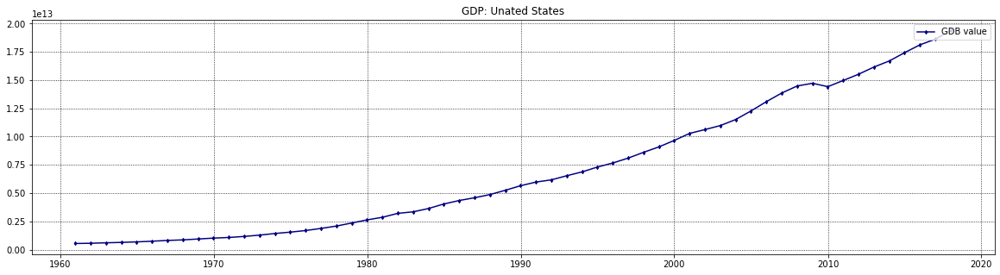

In [22]:
plt.figure(figsize=(20, 5))
plt.plot(global_economy, '-d', color='navy', markersize=3)
plt.legend(['GDB value'], loc='upper right')
plt.grid(linestyle=':', color='k')
plt.title(f'GDP: Unated States')


In [23]:
decomposition = seasonal_decompose(global_economy, period=1)

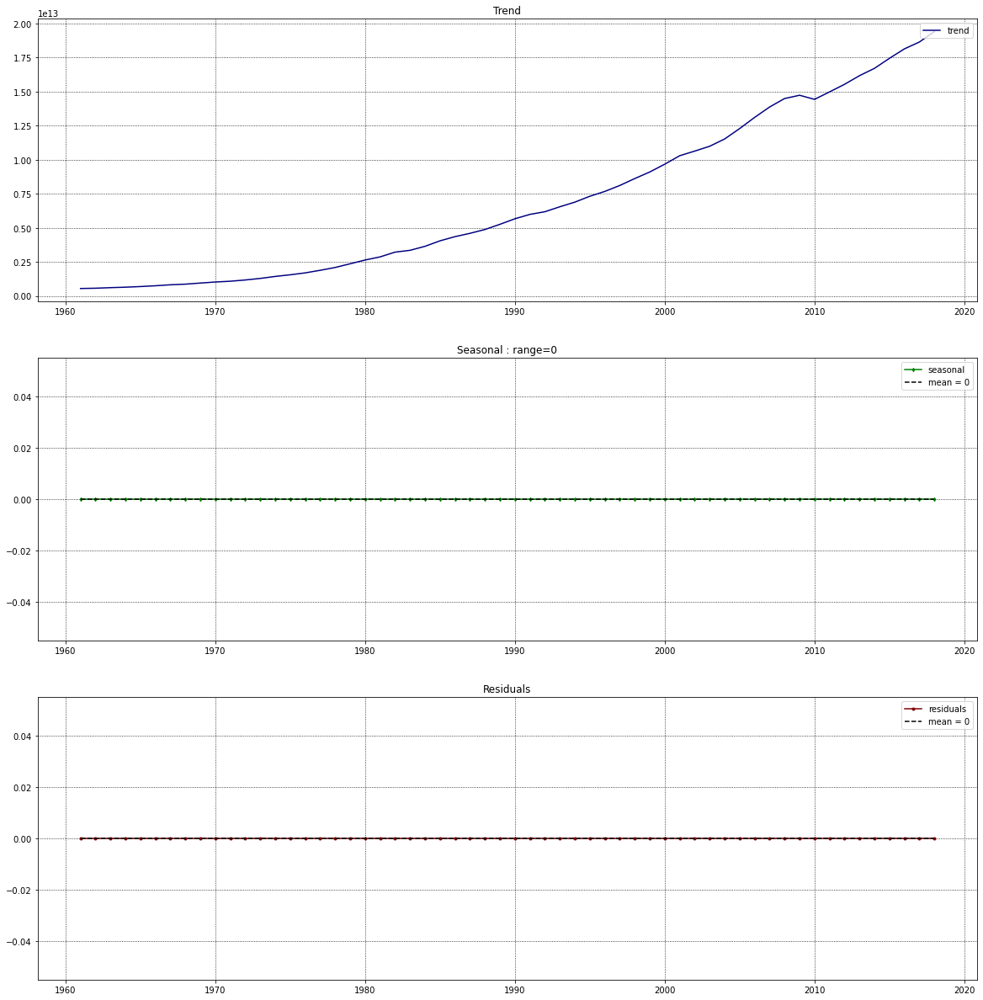

In [24]:
plot_decomposition(decomposition)

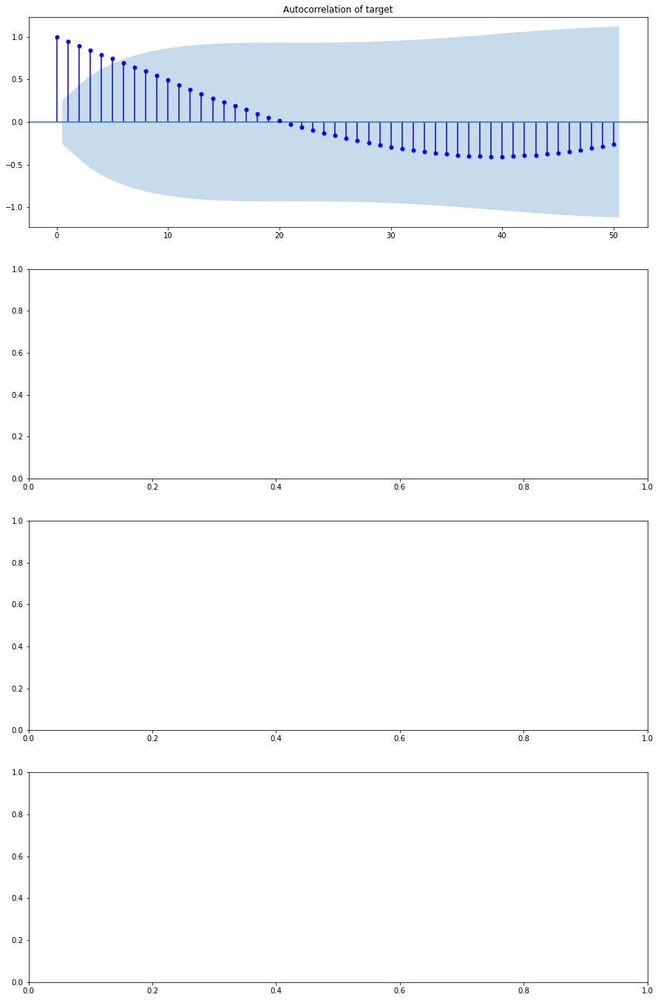

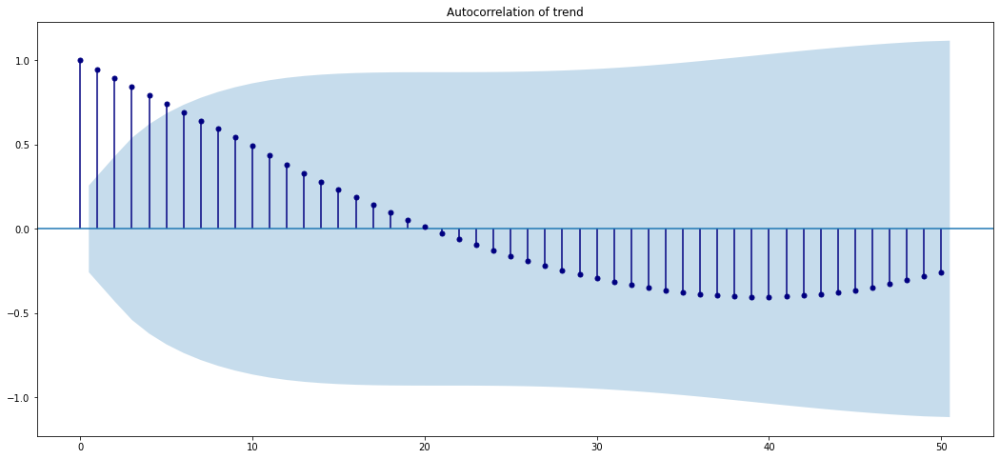

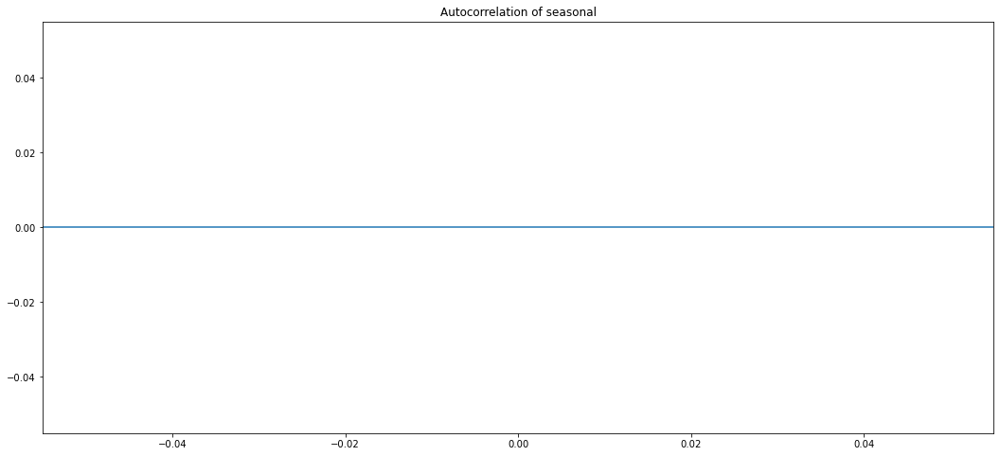

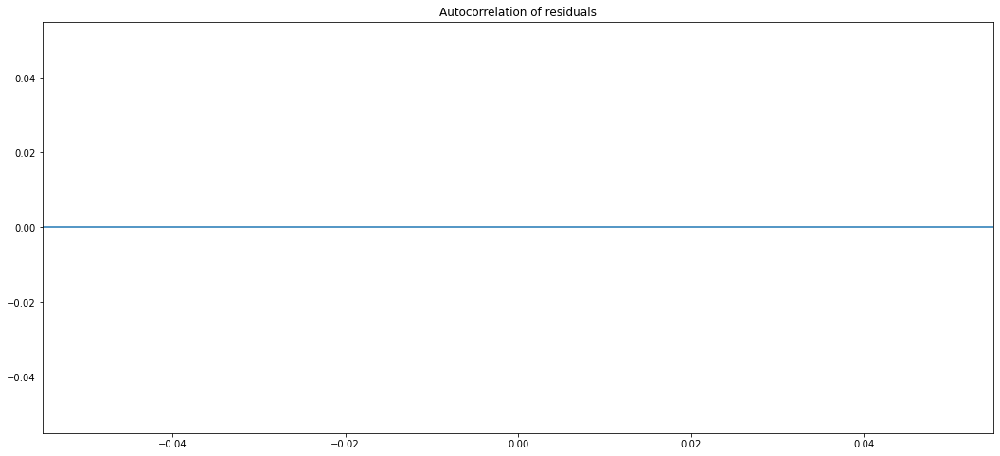

In [25]:
plot_ACF(global_economy, decomposition)

Singular matrix
Singular matrix


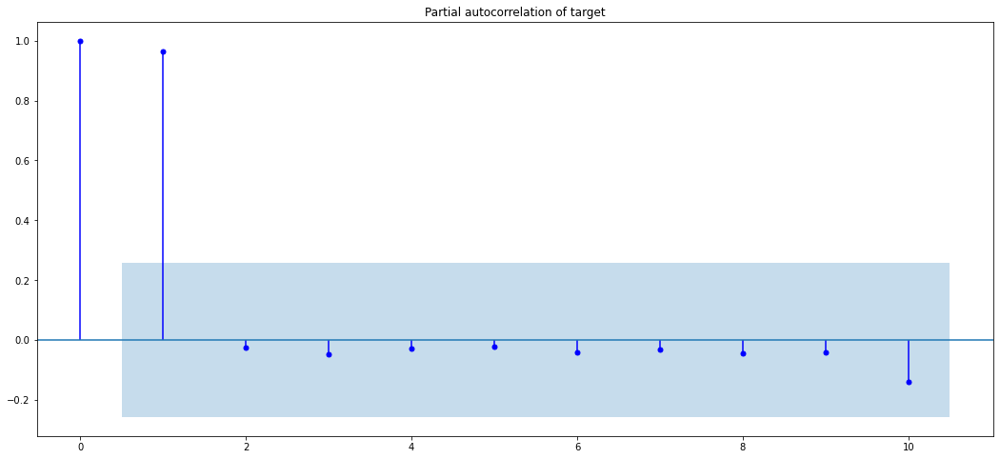

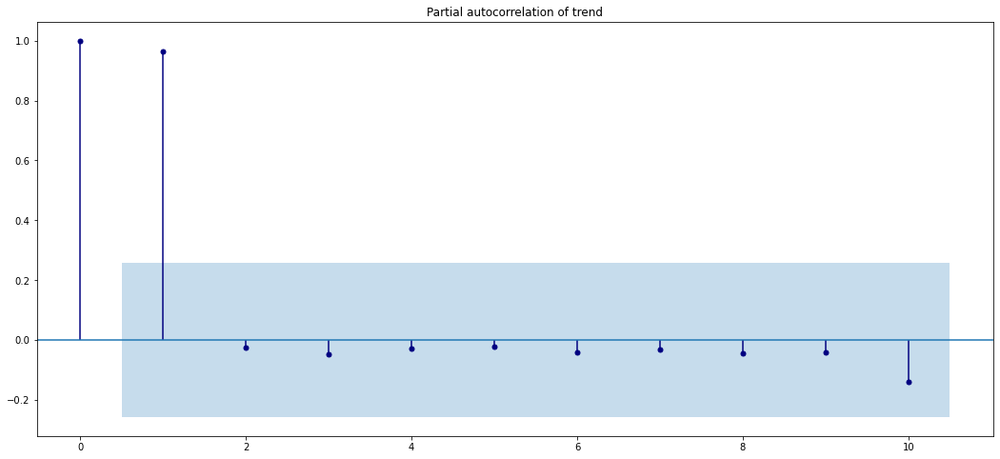

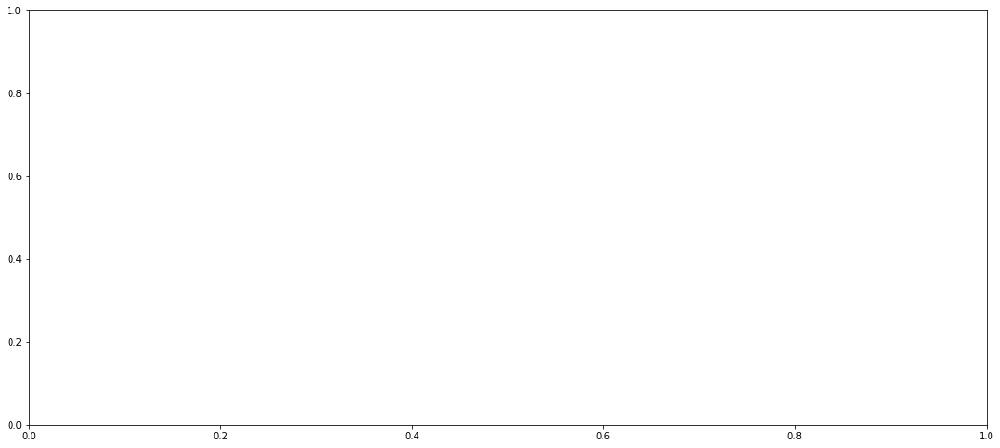

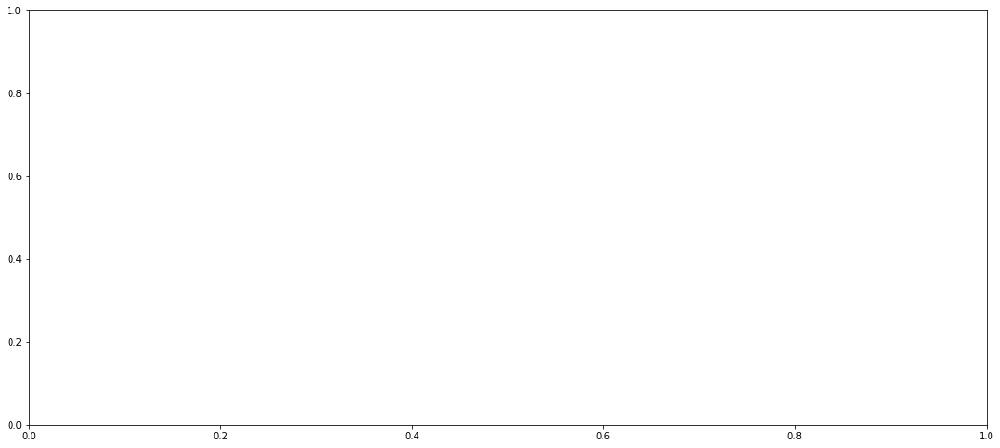

In [26]:
plot_PACF(global_economy, decomposition, lags=10)

# error since out resid and seasonal == 0

In [27]:
get_stationary(global_economy)

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: 3.273562537298505
p-value: 1.0
The process is non-stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.5815899903401673
p-value = 0.024310000878166604
The process is non-stationary by KPSS.



По графикам выше можно сделать несколько выводов:
1. Очевидно, что ряд нестационарный, потому что у него не постоянная средняя
2. так как периодичность = 1, то такие компонеты как сезонность и остатки будут отсутствовать (мы просто не можем выявить сезонную компоненту)
3. видно, что в графике присутствует трент, поэтому автокорреляция тренда будет убывать с ростом значения лага. НО не понятен один момент, почему после 20 значения лагов меняются на отрицательные. Тренд же не меняет направление...
4. в PACF видно, что единственный значимый лаг = 1, остальные незначимы. Это логично, потому что считая PACF мы вычитаем линейную составляющую предыдущих компонент.     


Для дальнейшего исследования графика можно продифференцировать

### >>> Fourier analysis BEGIN

In [28]:
from scipy import fftpack

### TODO: REWRITE: follow https://colab.research.google.com/github/FabrizioMusacchio/Python_Neuro_Practical/blob/master/05%20Using%20Fourier%20transform%20for%20time%20series%20deconstruction%20.ipynb
### https://medium.com/@khairulomar/deconstructing-time-series-using-fourier-transform-e52dd535a44e
### see also https://www.technology.matthey.com/article/66/2/169-176/ 

def get_fourier(target, 
                trend, 
                seasonal, 
                resid, 
                time_series, 
                visualize=False):
    """
    WRITE: docstrings
    """

#     time_series = data[tt]
#     target = data[target_name]
    Fs = time_series.values[1] - time_series.values[0] #1/step
    n = np.size(target)
    if n//2 == 0:
        num = int(n/2)
    else:
        num = int((n+1)/2)
    fr = Fs/2 * np.linspace(0, 1, num=num)


    ### --- Spectrum of target
    spectrum_target = fftpack.fft(target.values)
    spectrum_target = 2/n * np.abs(spectrum_target[0:np.size(fr)])


    ### --- Spectrum of seasonal
    spectrum_seasonal = fftpack.fft(seasonal.values)
    spectrum_seasonal = 2/n * np.abs(spectrum_seasonal[0:np.size(fr)])


    ### --- Spectrum of trend
    trend_not_na = trend.notna()
    n = np.size(trend[trend_not_na])
    if n//2 == 0:
        num = int(n/2)
    else:
        num = int((n+1)/2)
    fr_trend = Fs/2 * np.linspace(0, 1, num=num)
    spectrum_trend = fftpack.fft(trend[trend_not_na].values)
    spectrum_trend = 2/n * np.abs(spectrum_trend[0:np.size(fr_trend)])

    ### --- Spectrum of residuals
    resid_not_na = resid.notna()
    n = np.size(resid[resid_not_na])
    if n//2 == 0:
        num = int(n/2)
    else:
        num = int((n+1)/2)
    fr_resid = Fs/2 * np.linspace(0, 1, num=num)
    spectrum_resid = fftpack.fft(resid[resid_not_na].values)
    spectrum_resid = 2/n * np.abs(spectrum_resid[0:np.size(fr_resid)])


    
    ### === Visualizaion
    if visualize:
        plt.subplots(4, 1, figsize=(15, 4*8))

        plt.subplot(4, 1, 1)
        plt.plot(fr/max(fr), np.abs(spectrum_target), "-o")
        plt.grid(linestyle=":")
        plt.xlabel(f"The maximal frequency = 1/{max(fr)}")
        plt.title("Fourier spectrum (abs) of target")

        plt.subplot(4, 1, 2)
        plt.plot(fr_trend/max(fr_trend), np.abs(spectrum_trend), "-o", color='maroon')
        plt.grid(linestyle=":")
        plt.xlabel(f"The maximal frequency = 1/{max(fr_trend)}")
        plt.title("Fourier spectrum (abs) of trend")

        plt.subplot(4, 1, 3)
        plt.plot(fr/max(fr), np.abs(spectrum_seasonal), "-og")
        plt.xlabel(f"The maximal frequency = 1/{max(fr)}")
        plt.grid(linestyle=":")
        plt.title("Fourier spectrum (abs) of `seasonal`")

        plt.subplot(4, 1, 4)
        plt.plot(fr_resid/max(fr_resid), np.abs(spectrum_resid), "-o", color='maroon')
        plt.grid(linestyle=":")
        plt.xlabel(f"The maximal frequency = 1/{max(fr_resid)}")
        plt.title("Fourier spectrum (abs) of `residuals`")

        plt.show()
    
    
    res = [(fr, spectrum_target), 
           (fr_trend, spectrum_trend), 
           (fr, spectrum_seasonal), 
           (fr_resid, spectrum_resid)]
    
    return res

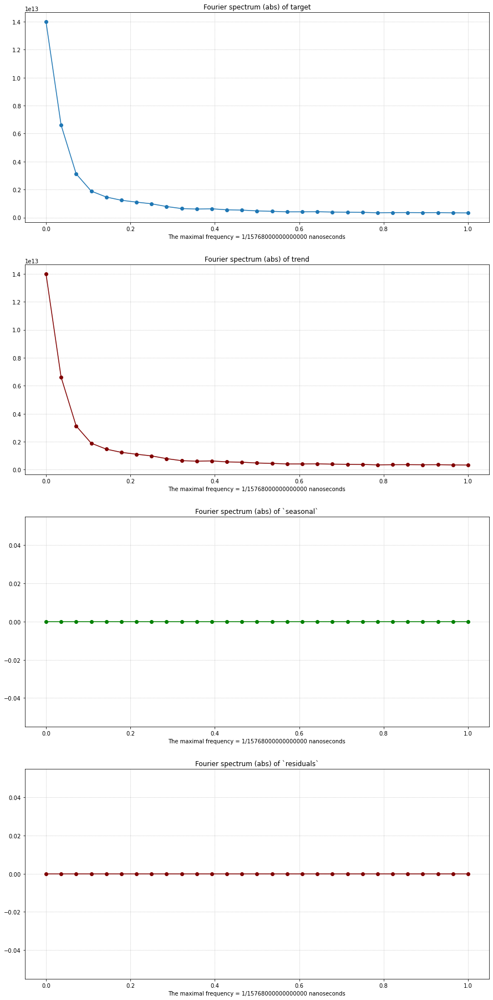

In [29]:
res = get_fourier(global_economy, 
                  decomposition.trend, 
                  decomposition.seasonal, 
                  decomposition.resid, 
                  global_economy.index, 
                  visualize=True)

In [30]:
for k in range(len(res)):
    print(f"Maximal freq =1/{max(res[k][0])}", 
         f"= 1/{int(max(res[k][0]))/ ((10**9) *60*60*24 )} days")

Maximal freq =1/15768000000000000 nanoseconds = 1/182.5 days
Maximal freq =1/15768000000000000 nanoseconds = 1/182.5 days
Maximal freq =1/15768000000000000 nanoseconds = 1/182.5 days
Maximal freq =1/15768000000000000 nanoseconds = 1/182.5 days


In [31]:
len(global_economy), global_economy.index

(58,
 DatetimeIndex(['1960-12-31', '1961-12-31', '1962-12-31', '1963-12-31',
                '1964-12-31', '1965-12-31', '1966-12-31', '1967-12-31',
                '1968-12-31', '1969-12-31', '1970-12-31', '1971-12-31',
                '1972-12-31', '1973-12-31', '1974-12-31', '1975-12-31',
                '1976-12-31', '1977-12-31', '1978-12-31', '1979-12-31',
                '1980-12-31', '1981-12-31', '1982-12-31', '1983-12-31',
                '1984-12-31', '1985-12-31', '1986-12-31', '1987-12-31',
                '1988-12-31', '1989-12-31', '1990-12-31', '1991-12-31',
                '1992-12-31', '1993-12-31', '1994-12-31', '1995-12-31',
                '1996-12-31', '1997-12-31', '1998-12-31', '1999-12-31',
                '2000-12-31', '2001-12-31', '2002-12-31', '2003-12-31',
                '2004-12-31', '2005-12-31', '2006-12-31', '2007-12-31',
                '2008-12-31', '2009-12-31', '2010-12-31', '2011-12-31',
                '2012-12-31', '2013-12-31', '2014-12-31', '

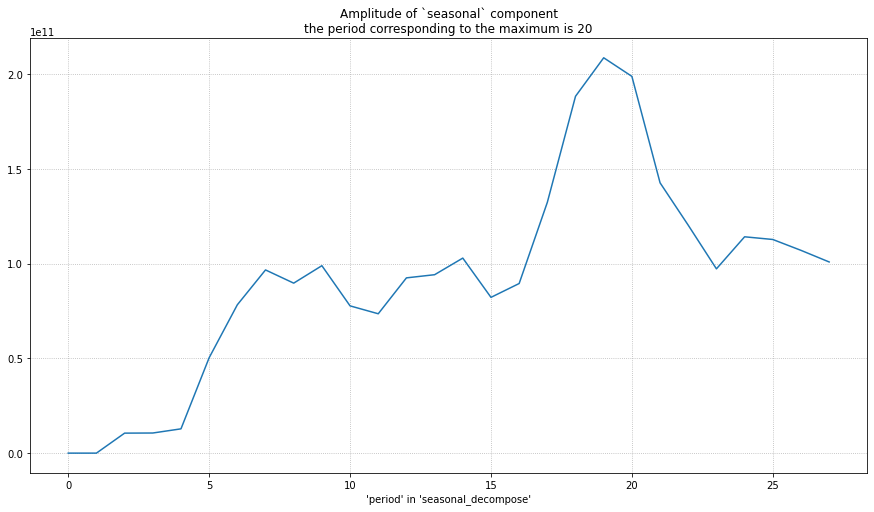

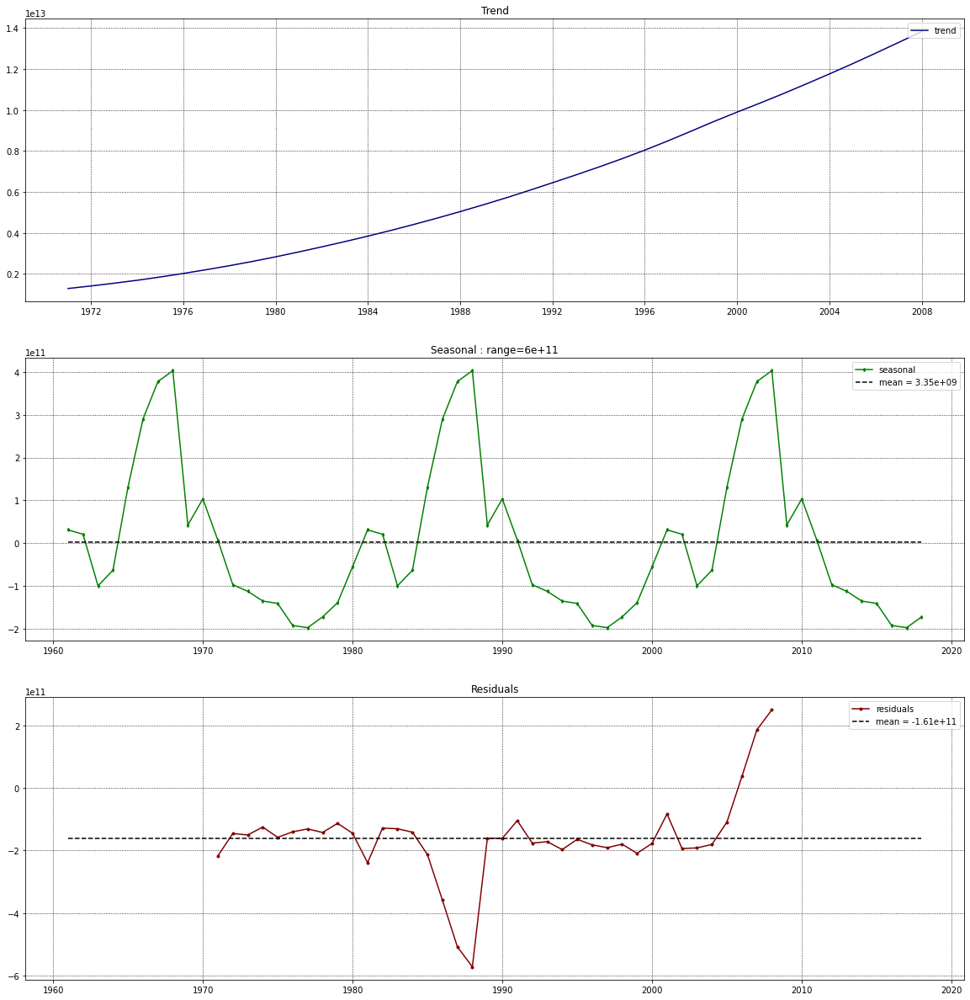

In [32]:
model = 'additive'

seasonal_maxs = []
for k in range(1, int(len(global_economy)/2)):
    decomposition = seasonal_decompose(global_economy, period=k, model=model)
    res = get_fourier(global_economy, 
                      decomposition.trend, 
                      decomposition.seasonal, 
                      decomposition.resid, 
                      global_economy.index, 
                      visualize=False)
    seasonal_maxs.append(max(res[2][1]))
    
seasonal_maxs = np.array(seasonal_maxs)
k_max = seasonal_maxs.argmax() + 1



plt.subplots(1, 1, figsize=(15, 8))
plt.plot(seasonal_maxs)
plt.xlabel(f"'period' in 'seasonal_decompose'")
plt.grid(linestyle=":")
plt_title = "Amplitude of `seasonal` component\n"
plt_title += f"the period corresponding to the maximum is {k_max}"
plt.title(plt_title)
plt.show()



decomposition = seasonal_decompose(global_economy, period=k_max, model=model)
plot_decomposition(decomposition)

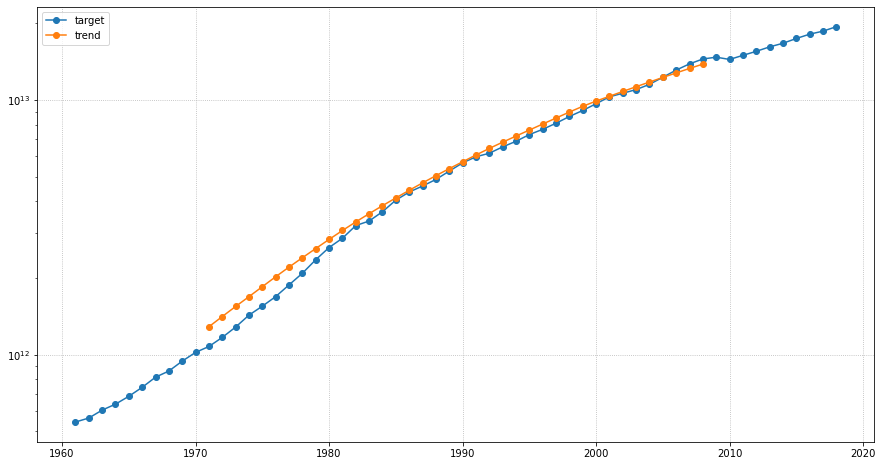

In [33]:

plt.subplots(1, 1, figsize=(15, 8))
plt.semilogy(global_economy, '-o', label="target")
plt.semilogy(decomposition.trend, '-o', label="trend")
plt.grid(linestyle=":")
plt.legend()
plt.show()

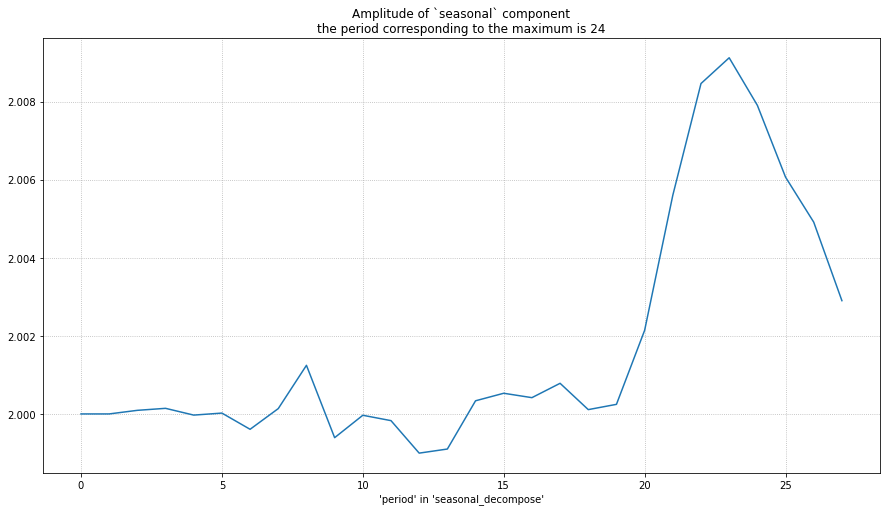

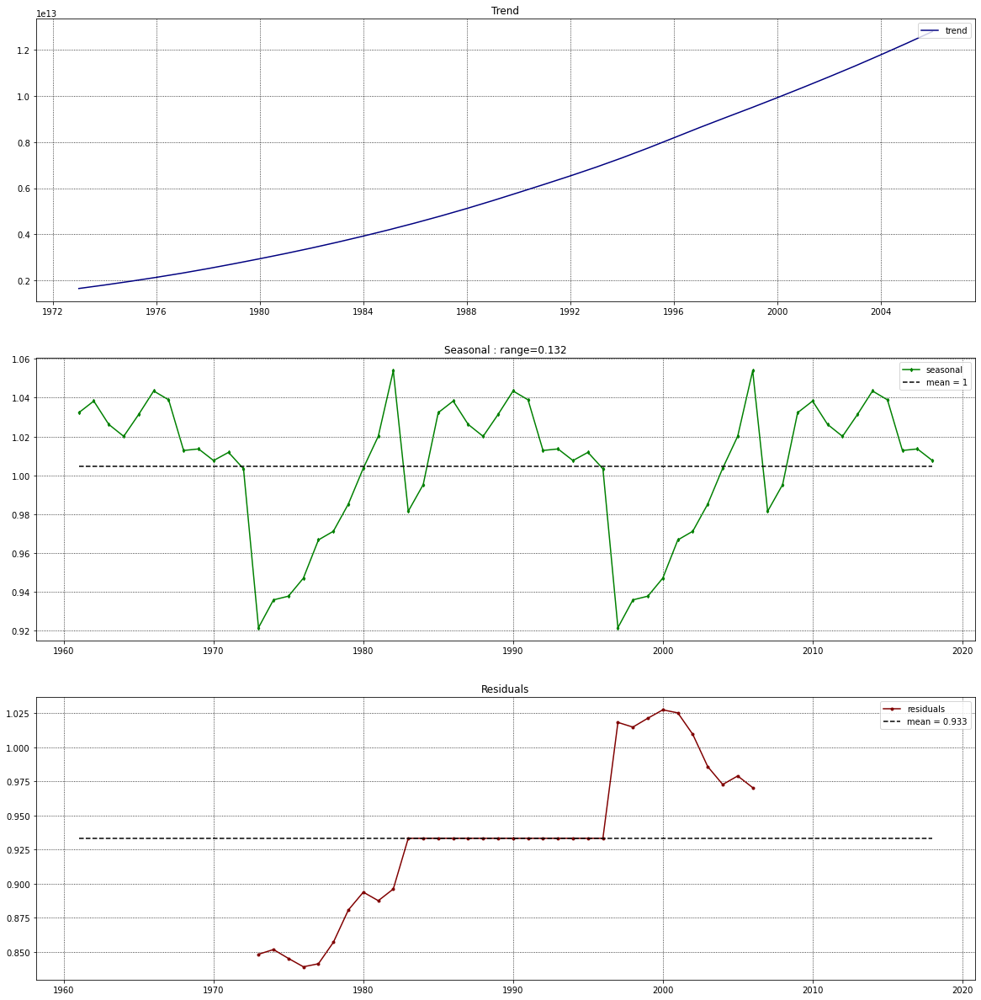

In [35]:
model = 'multiplicative'

seasonal_maxs = []
for k in range(1, int(len(global_economy)/2)):
    decomposition = seasonal_decompose(global_economy, period=k, model=model)
    res = get_fourier(global_economy, 
                      decomposition.trend, 
                      decomposition.seasonal, 
                      decomposition.resid, 
                      global_economy.index, 
                      visualize=False)
    seasonal_maxs.append(max(res[2][1]))
    
seasonal_maxs = np.array(seasonal_maxs)
k_max = seasonal_maxs.argmax() + 1



plt.subplots(1, 1, figsize=(15, 8))
plt.plot(seasonal_maxs)
plt.xlabel(f"'period' in 'seasonal_decompose'")
plt.grid(linestyle=":")
plt_title = "Amplitude of `seasonal` component\n"
plt_title += f"the period corresponding to the maximum is {k_max}"
plt.title(plt_title)
plt.show()



decomposition = seasonal_decompose(global_economy, period=k_max, model=model)
plot_decomposition(decomposition)

### <<< Fourier analysis END

In [36]:
global_economy_diff = np.log(global_economy).diff().dropna()

<div style="background-color: rgb(175, 219, 245);">
<span style="color:blue">

**NOTE:** 

I believe `np.log10` will be better

</span>
</div>

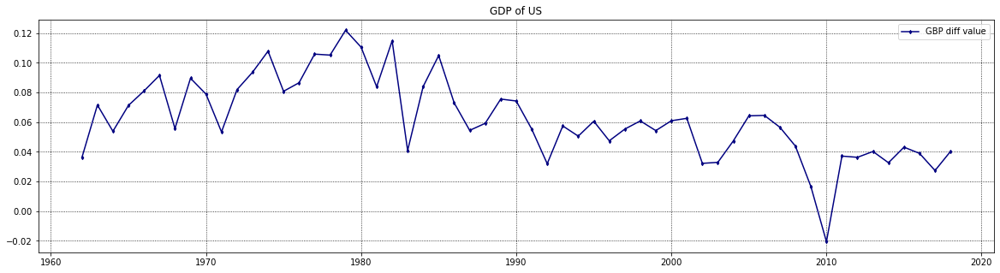

In [37]:
plot_series(global_economy_diff, legend='GBP diff value', title='GDP of US')

In [38]:
get_stationary(global_economy_diff)

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -3.3991401413199203
p-value: 0.010988219079345728
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.4193002444401179
p-value = 0.06883610153443195
The process is stationary by KPSS.



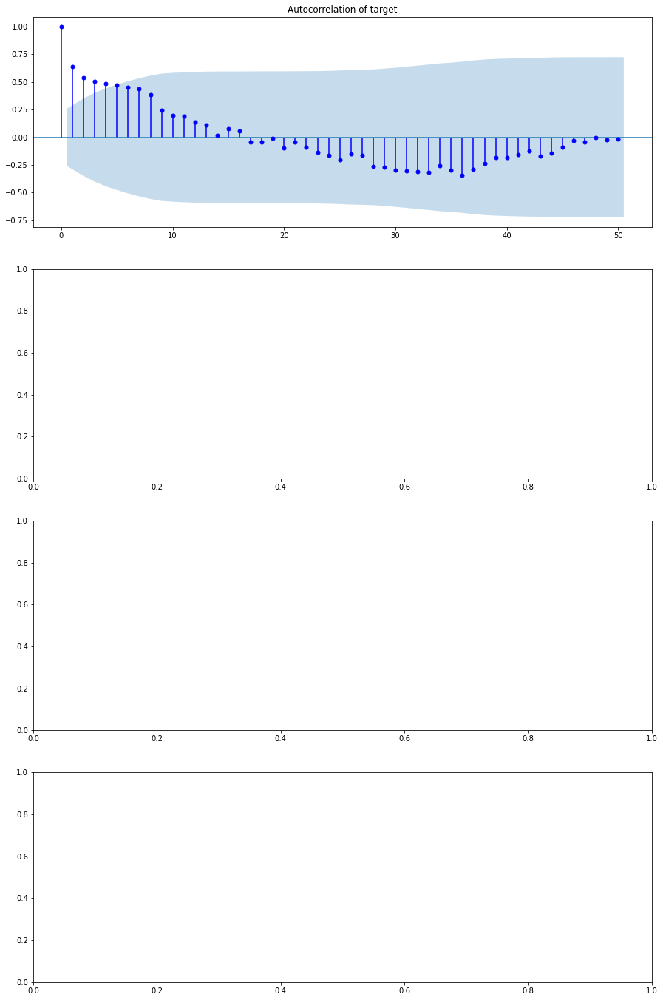

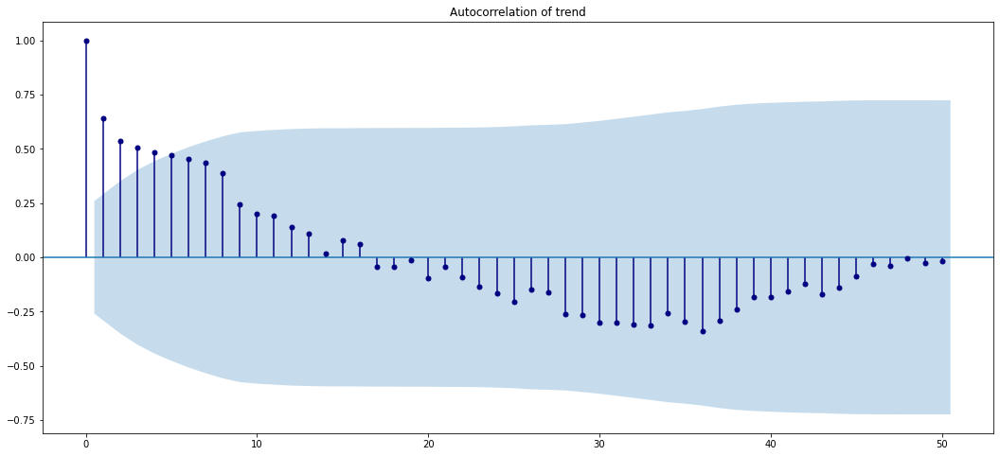

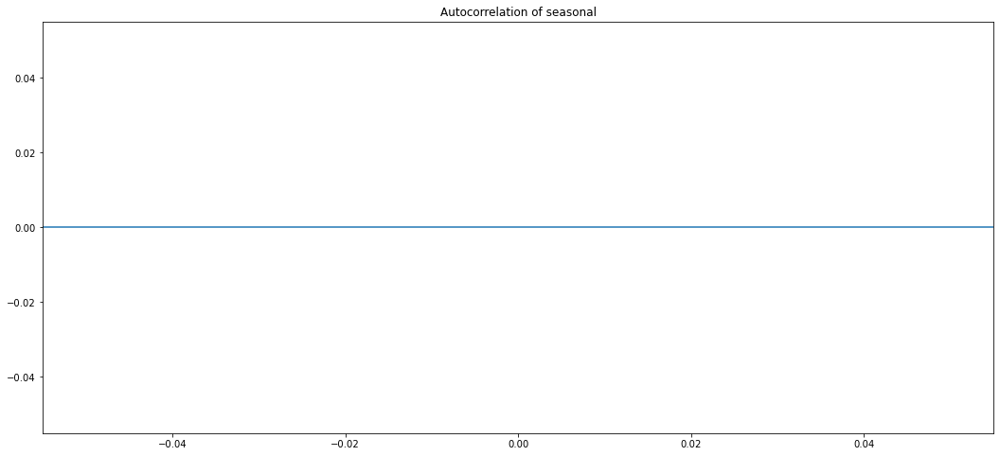

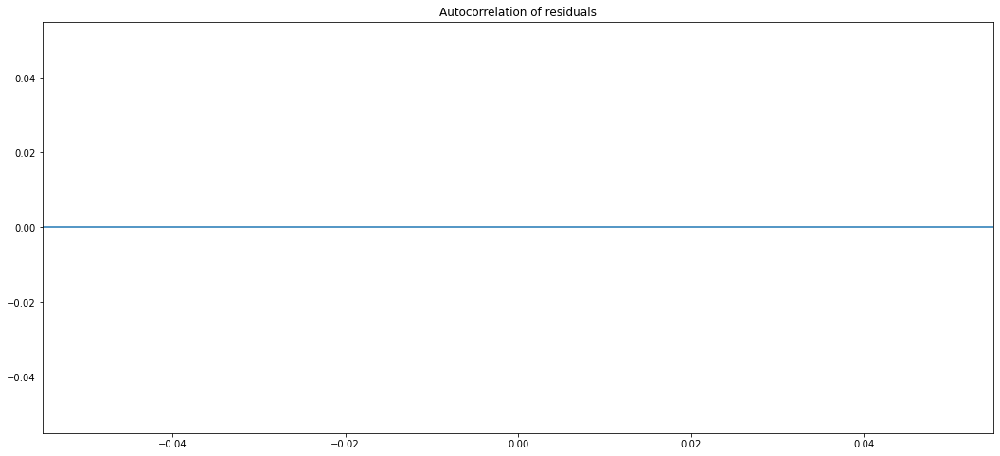

In [39]:
decomposition = seasonal_decompose(global_economy_diff)

plot_ACF(global_economy_diff, decomposition)

Singular matrix
Singular matrix


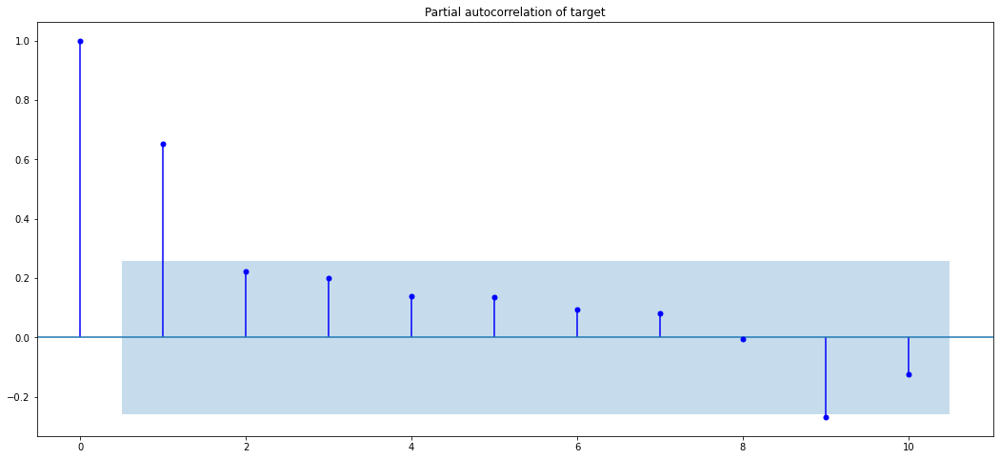

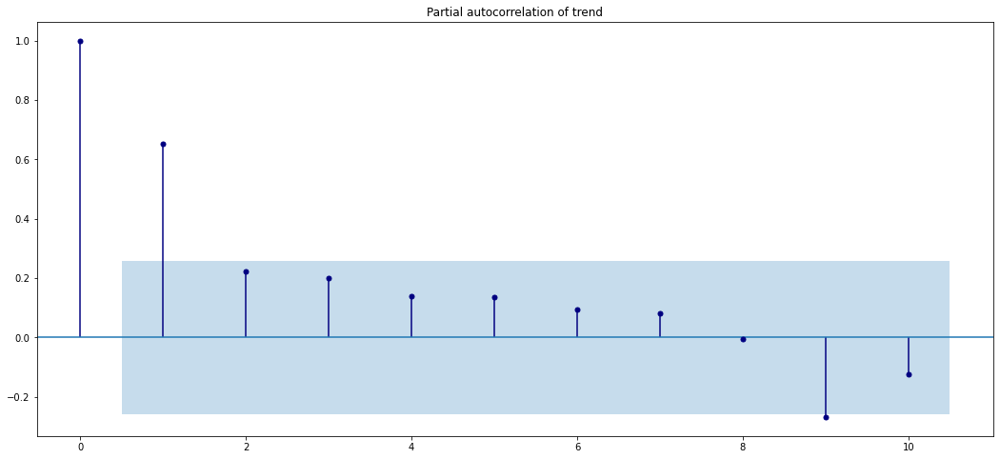

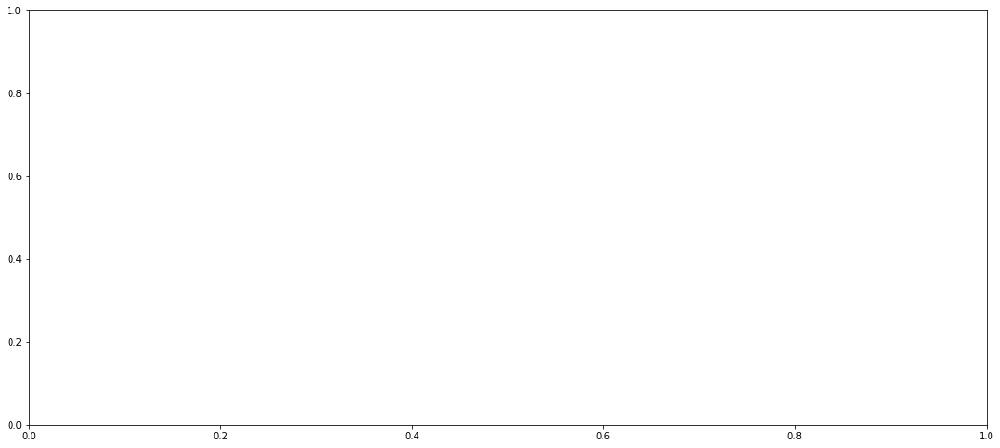

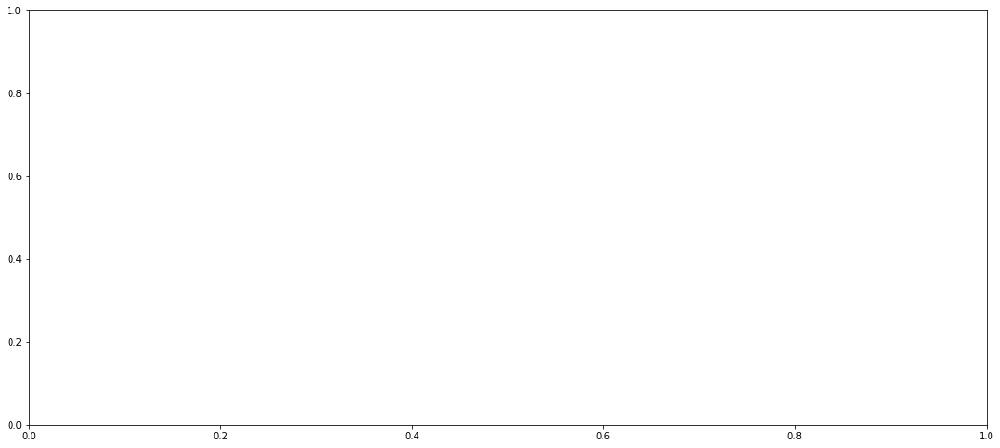

In [40]:
plot_PACF(global_economy_diff, decomposition, lags=10)

Если бы мы обучали ариму, я бы взял:
1. q = 4 (на основе ACF, последний значимый несезонный лаг) 
2. p = 1 (PACF)

у нас вообще нет сезонности, период = 1

## Slaughter of Victorian “Bulls, bullocks and steers” in aus_livestock.


In [41]:
aus_livestock = load_data('aus_livestock')

In [42]:
aus_livestock[aus_livestock['Animal'] == 'Bulls, bullocks and steers']

aus_livestock_observed = aus_livestock[(aus_livestock['Animal'] == 'Bulls, bullocks and steers') & (aus_livestock.State == 'Victoria')]

_index = pd.date_range('1976-07-01', '2019-01-01', freq ='M')
aus_livestock_observed.index = _index
aus_livestock_observed = aus_livestock_observed['Count']
aus_livestock_observed.head(10)

1976-07-31    109200.0
1976-08-31     94700.0
1976-09-30     95500.0
1976-10-31     94800.0
1976-11-30     94100.0
1976-12-31     98300.0
1977-01-31     93500.0
1977-02-28    102000.0
1977-03-31    102600.0
1977-04-30     91500.0
Freq: M, Name: Count, dtype: float64

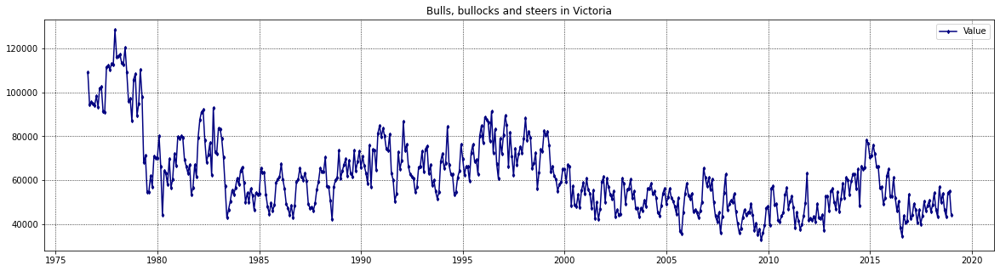

In [43]:
plot_series(aus_livestock_observed, legend='Value', title='Bulls, bullocks and steers in Victoria')

Сразу можно наблюдать периодичность в год (значит есть сезонная помпонента), также видны резкие снижения (1980), а также циклические компоненты(2015, 2007, 1992) 

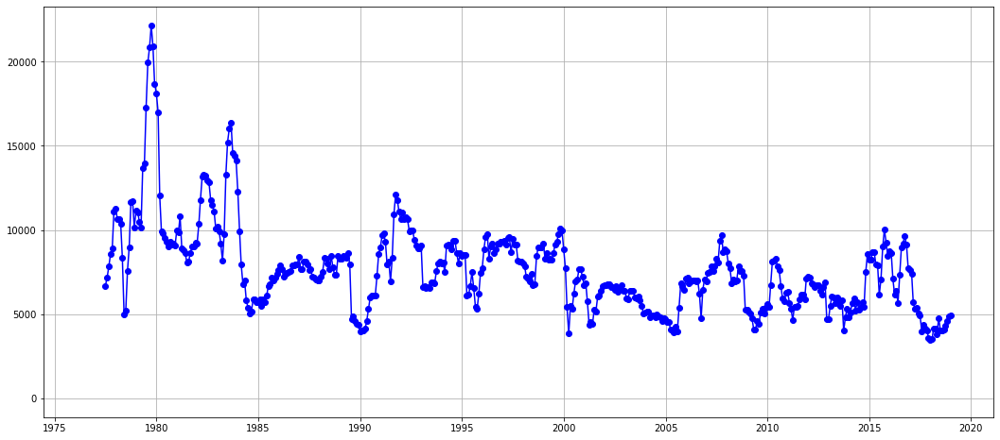

In [44]:
plt.plot(aus_livestock_observed.rolling(12).std(), '-ob')
plt.plot(aus_livestock_observed.index[0], 0)
plt.grid()

In [45]:
decomposition = seasonal_decompose(aus_livestock_observed, period=12)

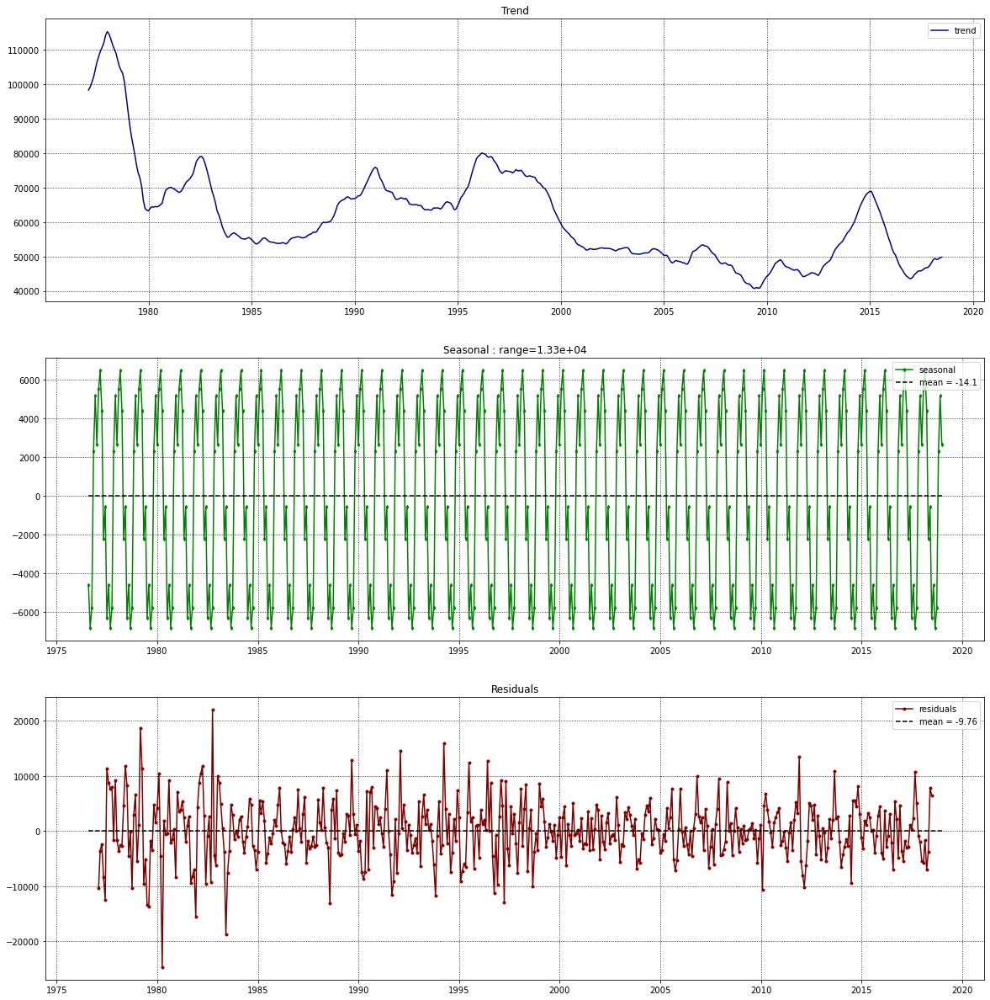

In [46]:
plot_decomposition(decomposition)

В тренде можно заметить недольшие бугорки (возможно в ряду осталась компонента сезонности, нужно посмореть на acf и pacf), спады и падения, иногда меняет направление роста вверх, но потом все равно падает. Рассмотрим остатки повнимательнее, также можно заметить, что вначале у остатков дисперсия больше. Думаю это из-за того, что ряд начинал стремительно падать с 1975 по 1980

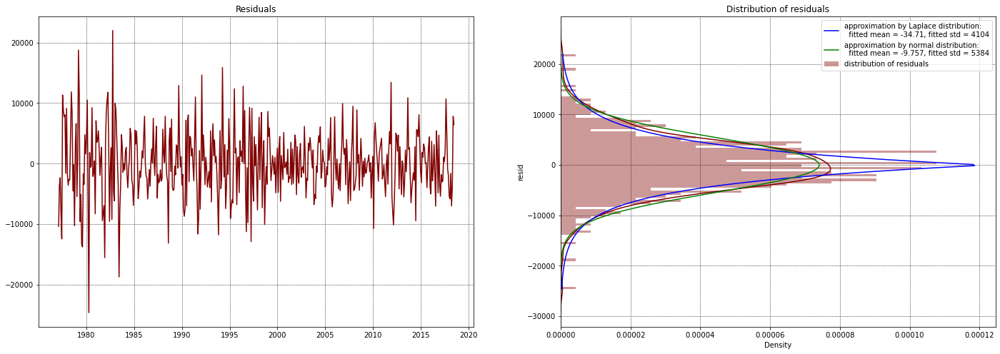

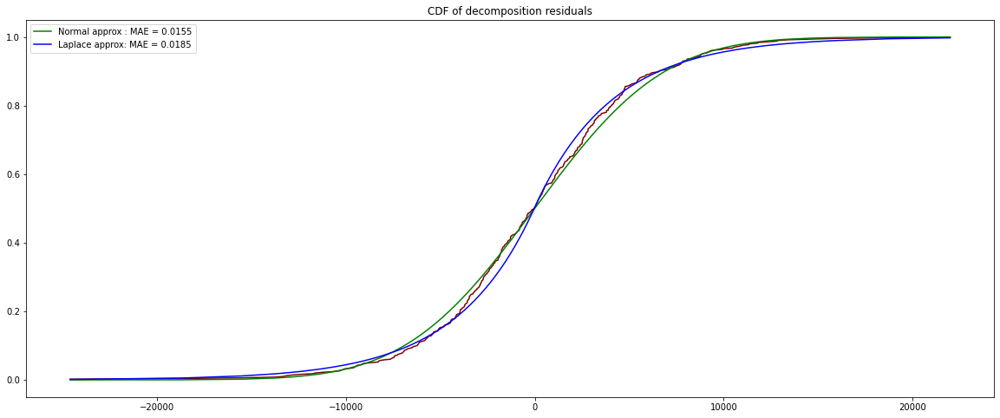

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -8.685139266676908
p-value: 4.1830765898877944e-14
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.01817194058844469
p-value = 0.1
The process is stationary by KPSS.



In [47]:
resid_analytics(decomposition.resid.dropna())

Видно, что ряд стациоранный, критерии это подтвердили. Остатки больше всего похожи на белый шум (=нормальное распределение), значит лучше всего будет в качетсве минимизируещего функционала взять сумму квадрата ошибок 

<div style="background-color: rgb(255, 255, 224);">
<span style="color: rgb(186, 22, 12)">

**ALERT:** 

Белый шум и нормальное распределение - совершенно разные понятия.

</span>
</div>

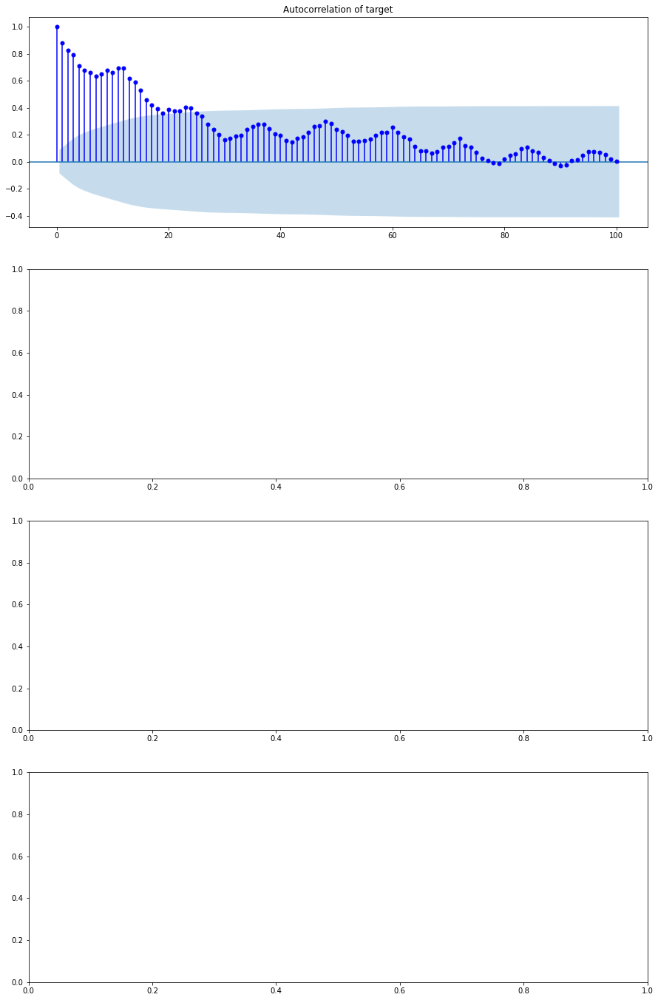

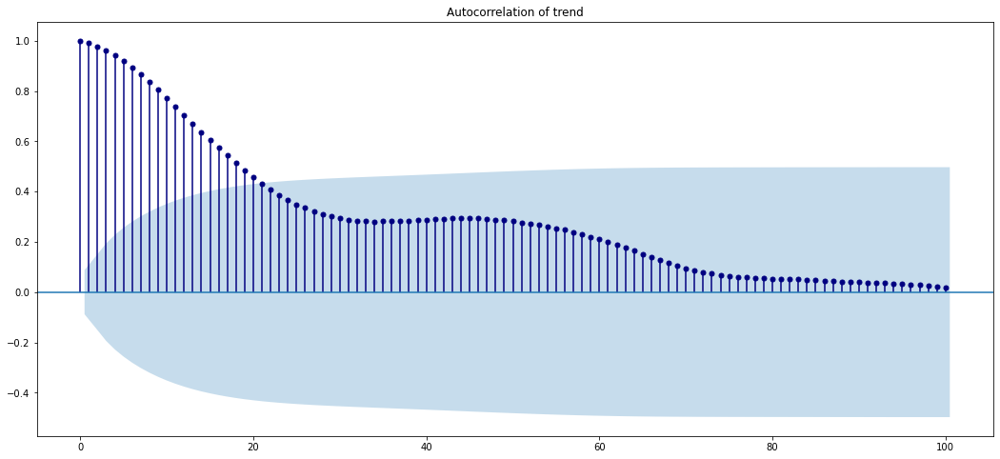

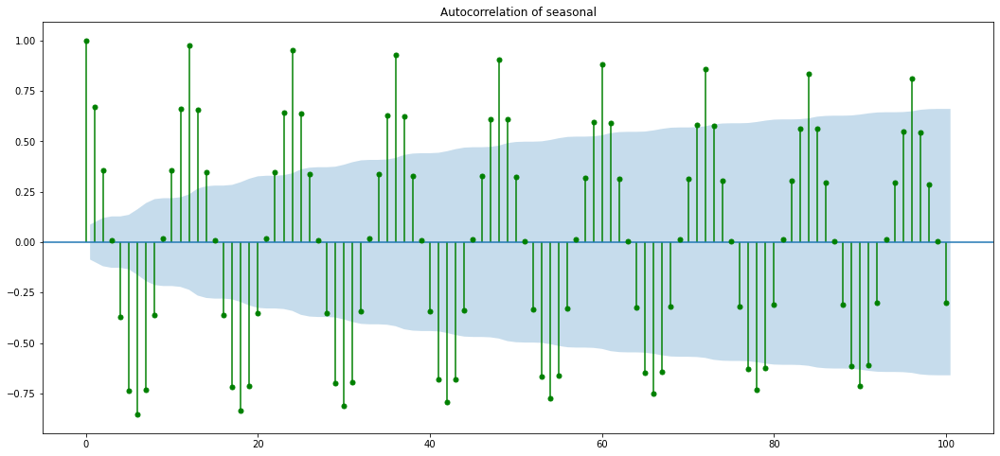

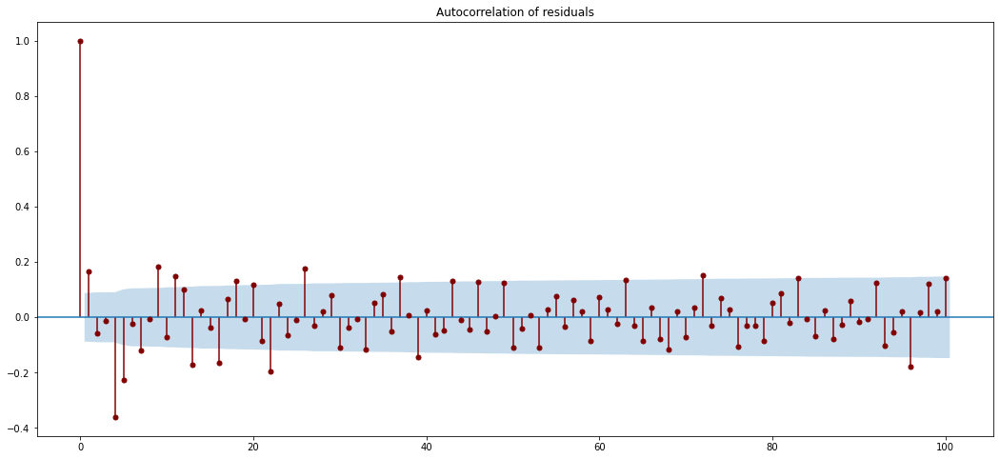

In [48]:
plot_ACF(aus_livestock_observed, decomposition, lags=100)

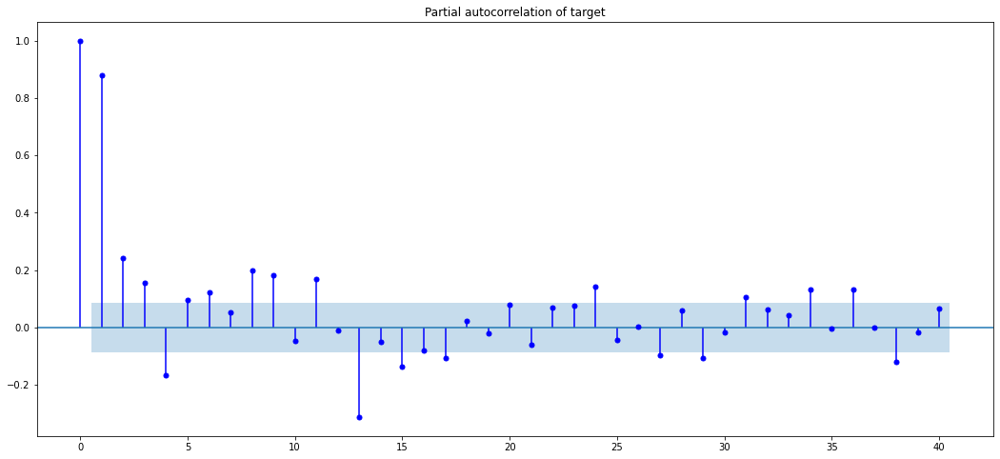

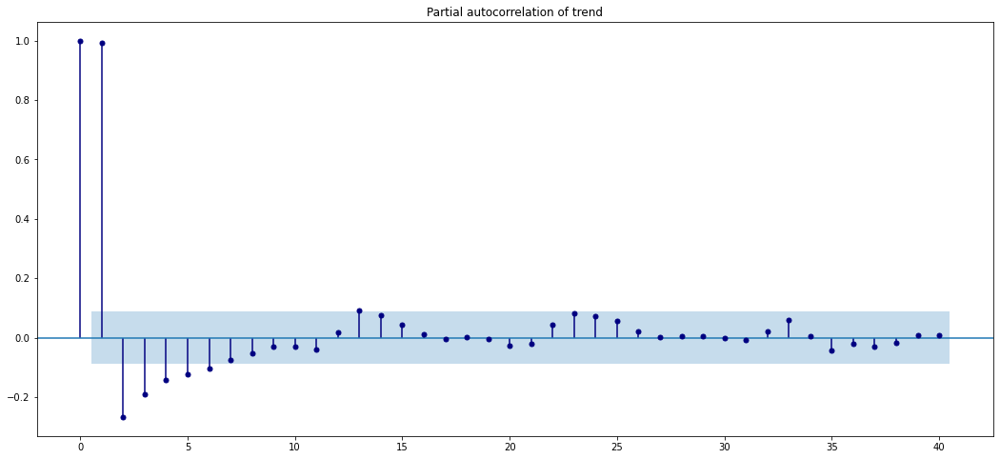

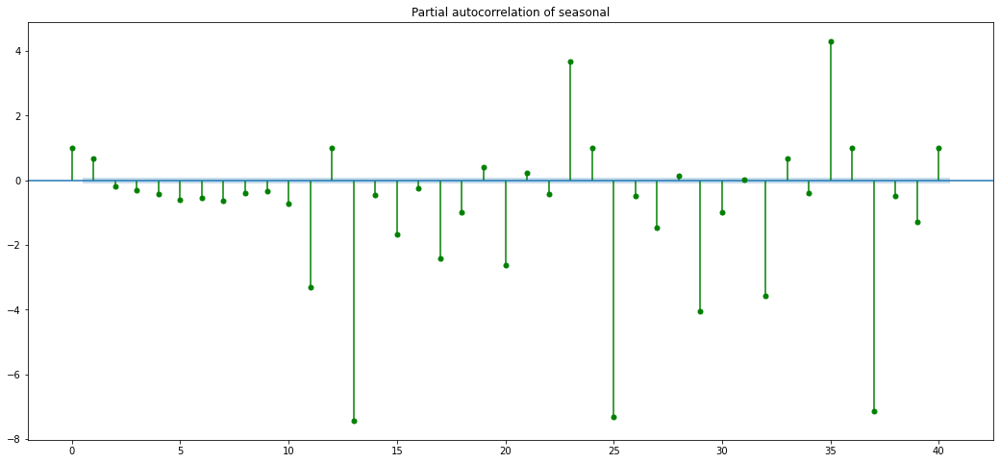

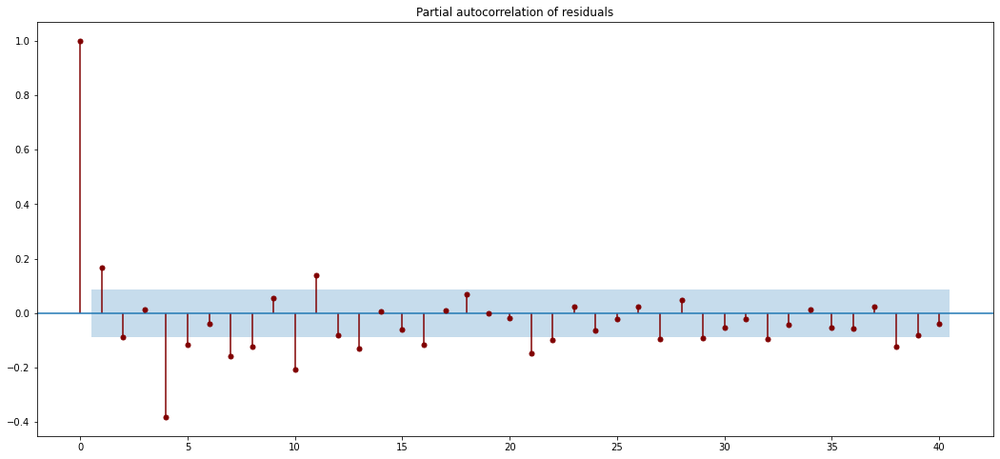

In [49]:
plot_PACF(aus_livestock_observed, decomposition, lags=40)

очень странно виглядит pacf для сезонности, особенно если посмотреть на 45 лаг. Лаги по бокам от сеазональных лагов выглядят намного больше, почему?  

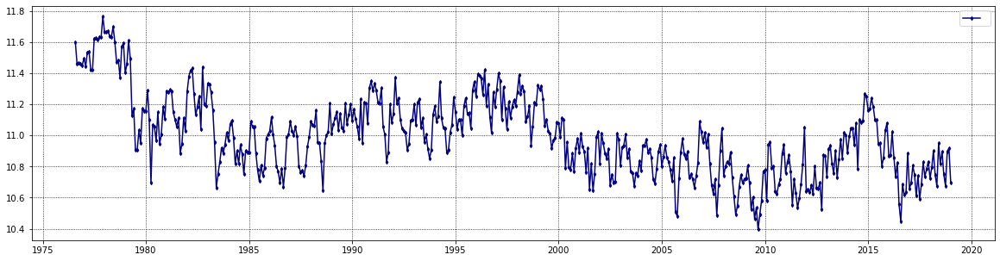

In [50]:
plot_series(np.log(aus_livestock_observed))

In [51]:
aus_livestock_observed_diff = np.log(aus_livestock_observed).diff().dropna()

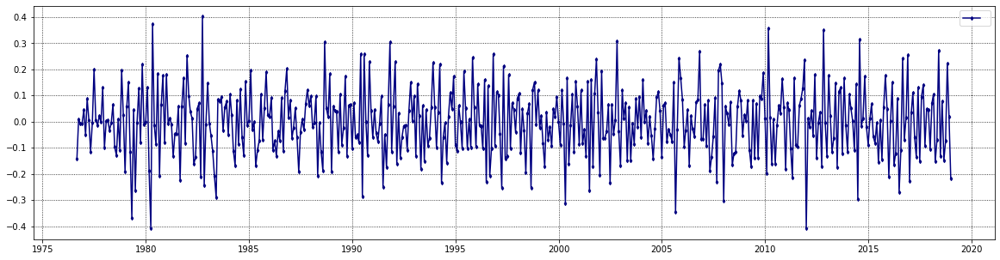

In [52]:
plot_series(aus_livestock_observed_diff)

In [53]:
get_stationary(aus_livestock_observed_diff)

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -6.235327582618569
p-value: 4.841306544357929e-08
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.04872212232536967
p-value = 0.1
The process is stationary by KPSS.



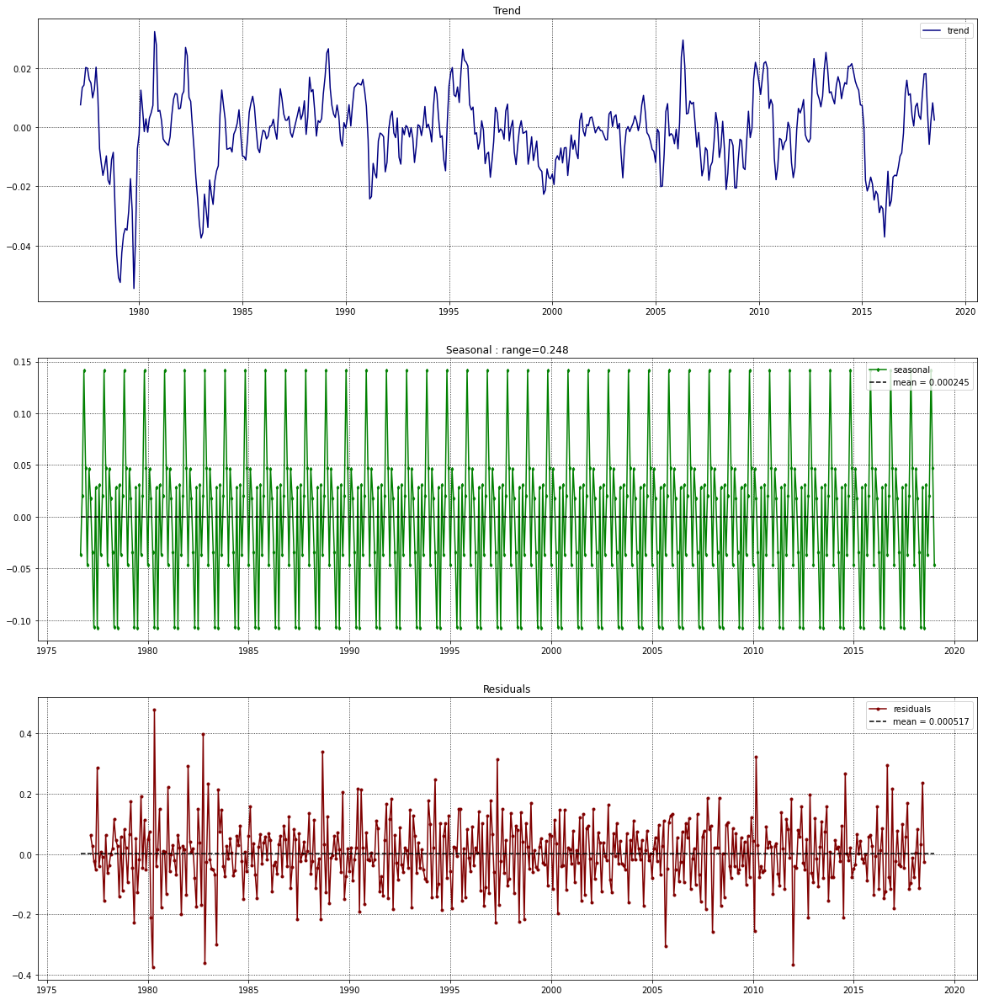

In [54]:
decomposition = seasonal_decompose(aus_livestock_observed_diff)
plot_decomposition(decomposition)

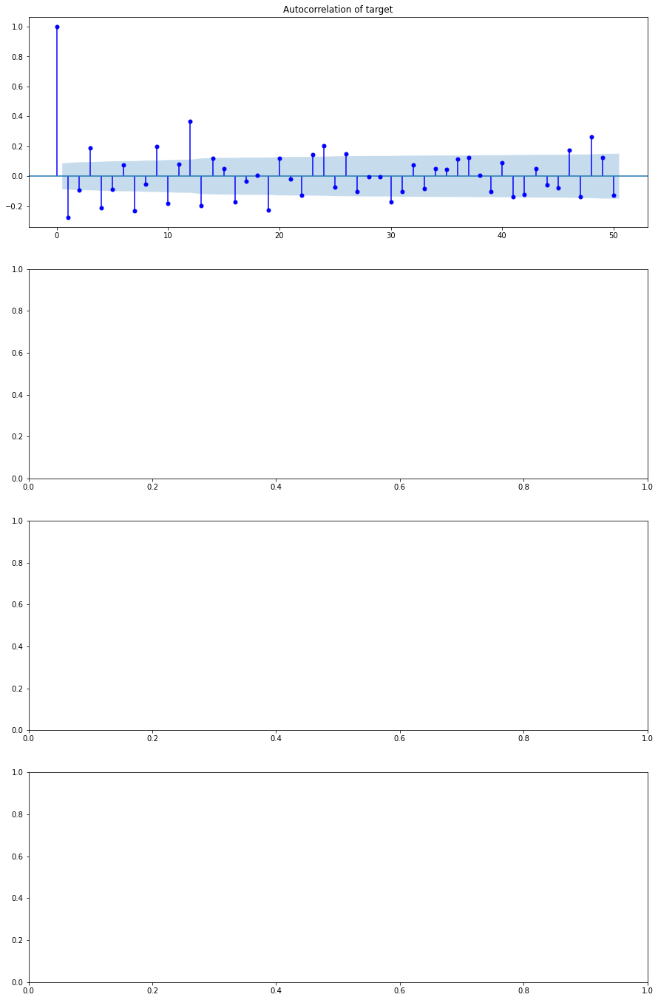

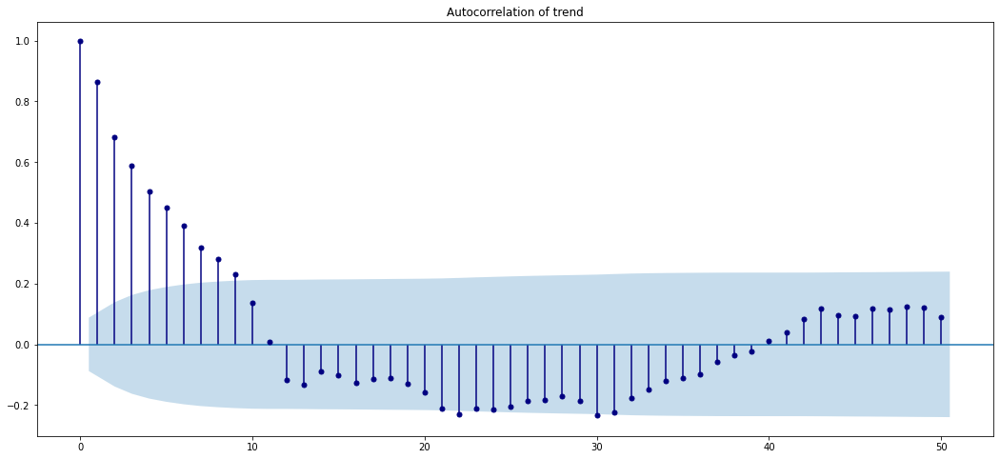

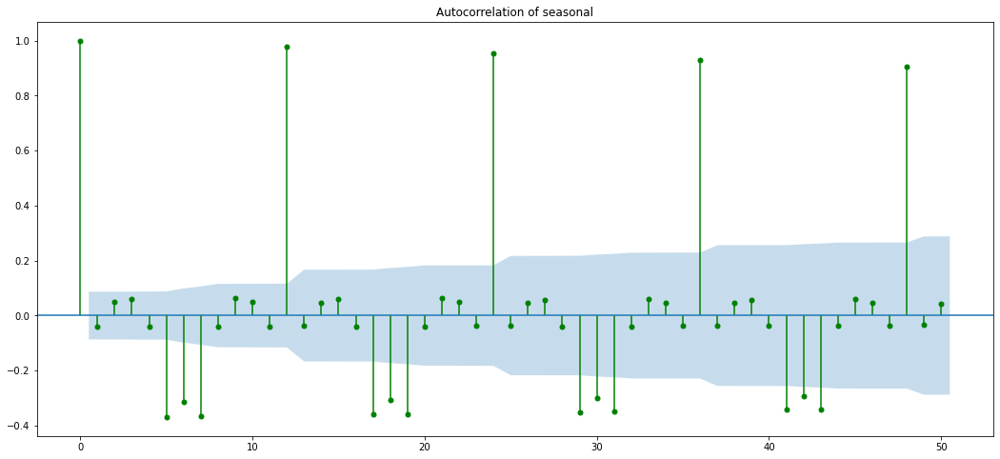

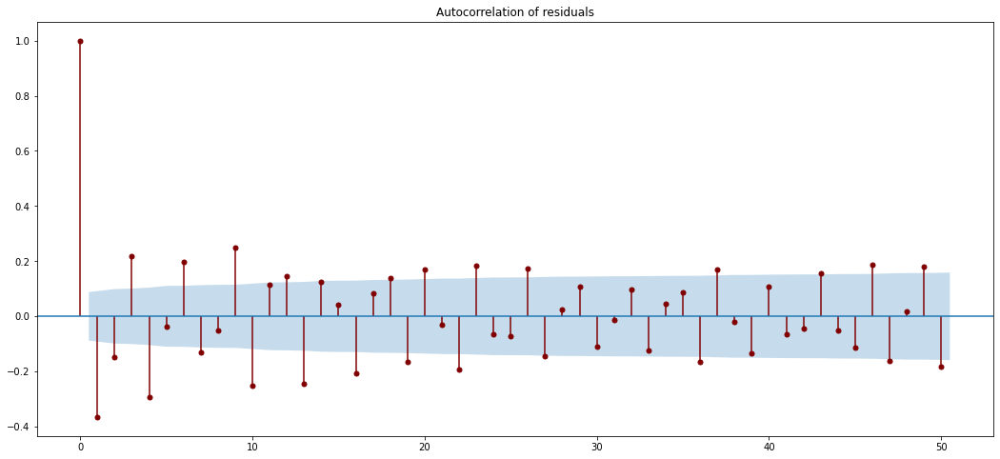

In [55]:
plot_ACF(aus_livestock_observed_diff, decomposition)

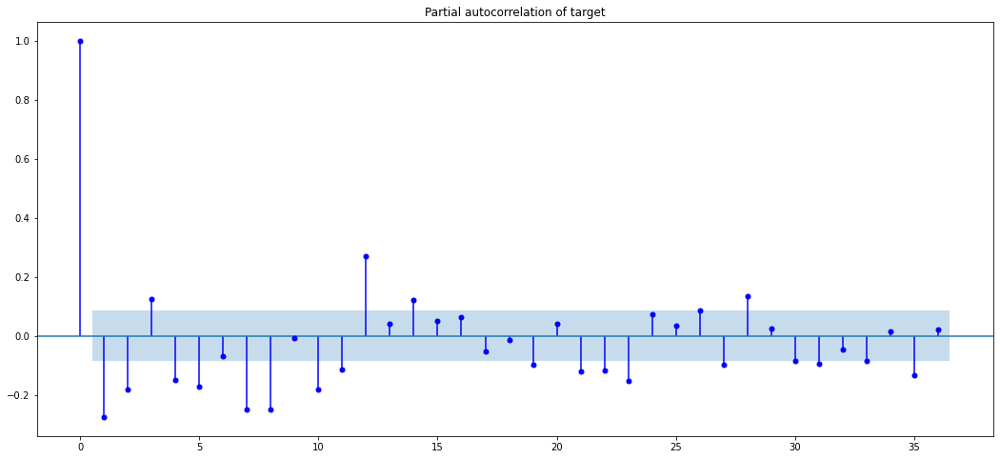

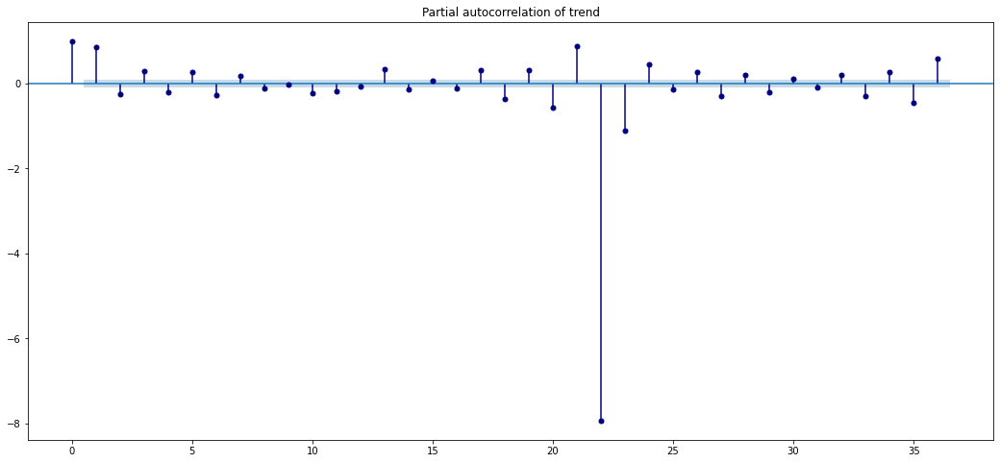

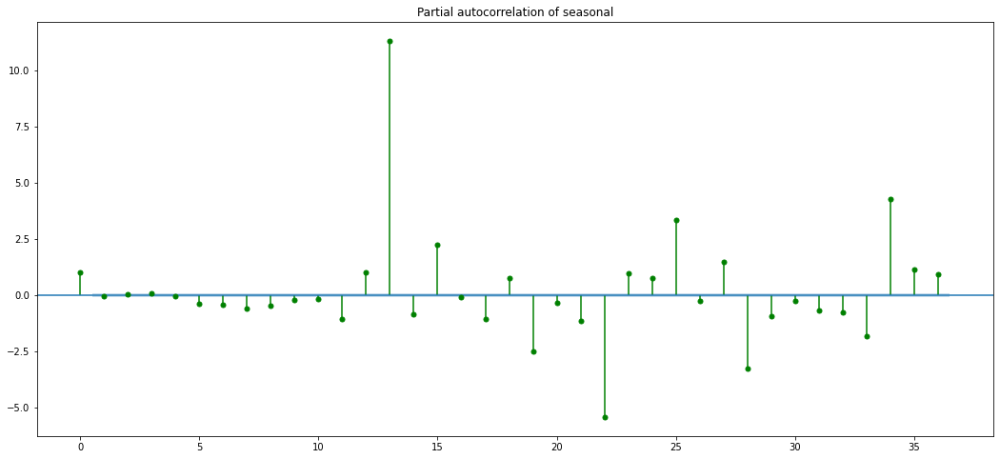

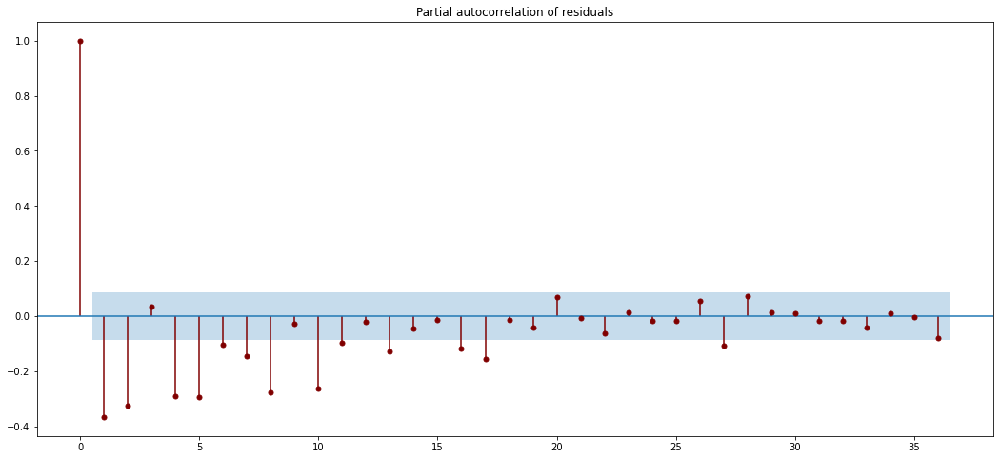

In [56]:
plot_PACF(aus_livestock_observed_diff, decomposition)

Если не иследовать ряд дальше, то для модели арима можно было бы взять параметры
* p = 10
* P = 12
* q = 11
* Q = 24
* d = 1
* D = 0

Еще очень не нравятся остатки в acf, потому что в них осталась структура, а также слишнов большие значение pacf для тренда и сеазовальной компонент.
Нужно попробовать достать из ряда недостающую компоненту.

<div style="background-color: rgb(144, 238, 144);">
<span style="color: rgb(0, 128, 0);">

**THUMP UP:** 

Верно. ACF сезонной компоненты показывает, что есть ещё периоды в 5 - 6 месяцев.
    
</span>
</div>

## Victorian Electricity Demand from vic_elec.

In [57]:
vic_elec = load_data('vic_elec')

In [58]:
vic_elec = load_data('vic_elec')

_index = pd.date_range('2011-12-31 13:00:00', '2014-12-31 12:30:00', freq ='30min')

vic_elec.index = _index
vic_elec = vic_elec['Demand']
vic_elec.head(10)

2011-12-31 13:00:00    4382.825174
2011-12-31 13:30:00    4263.365526
2011-12-31 14:00:00    4048.966046
2011-12-31 14:30:00    3877.563330
2011-12-31 15:00:00    4036.229746
2011-12-31 15:30:00    3865.597244
2011-12-31 16:00:00    3694.097664
2011-12-31 16:30:00    3561.623686
2011-12-31 17:00:00    3433.035352
2011-12-31 17:30:00    3359.468000
Freq: 30T, Name: Demand, dtype: float64

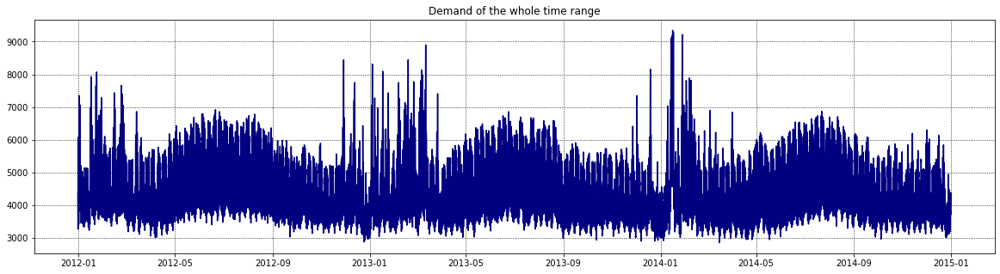

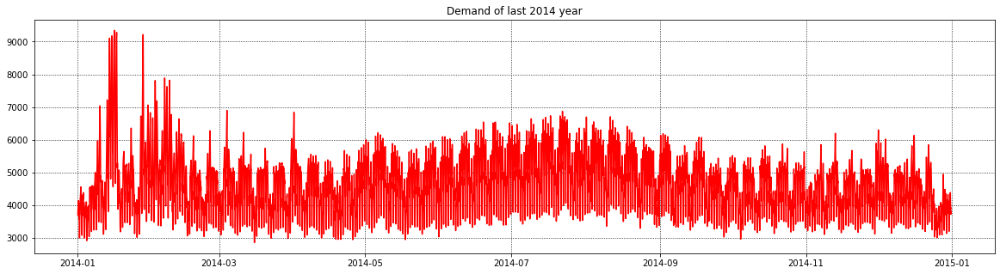

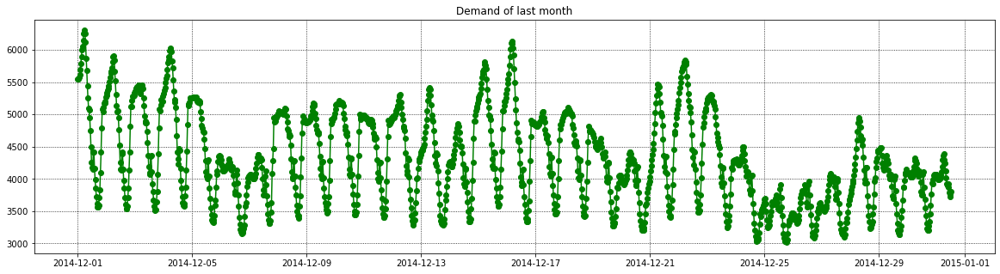

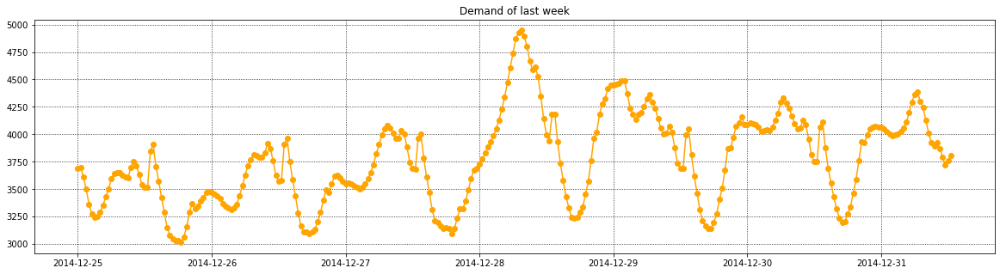

In [59]:
plt.figure(figsize=(20, 5))
plt.plot(vic_elec, color='navy')
plt.title('Demand of the whole time range')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(vic_elec.loc['2014-01-01':'2015-01-01'], color='red')
plt.title('Demand of last 2014 year')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(vic_elec.loc['2014-12-01':'2015-01-01'], '-o', color='green')
plt.title('Demand of last month')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5));
plt.plot(vic_elec.loc['2014-12-25':'2015-01-01'], '-o', color='orange')
plt.title('Demand of last week')
plt.grid(linestyle=':', color='k')
plt.show()

видна цикличность, тренд с начала до середины года имеет растущий тренд, затем плавно убывающий. 

<div style="background-color: rgb(250, 230, 250);">
<span style="color: rgb(204, 51, 204)">

**DISCUSS:** 
    
Чем это не сезонность с периодом год?

</span>
</div>

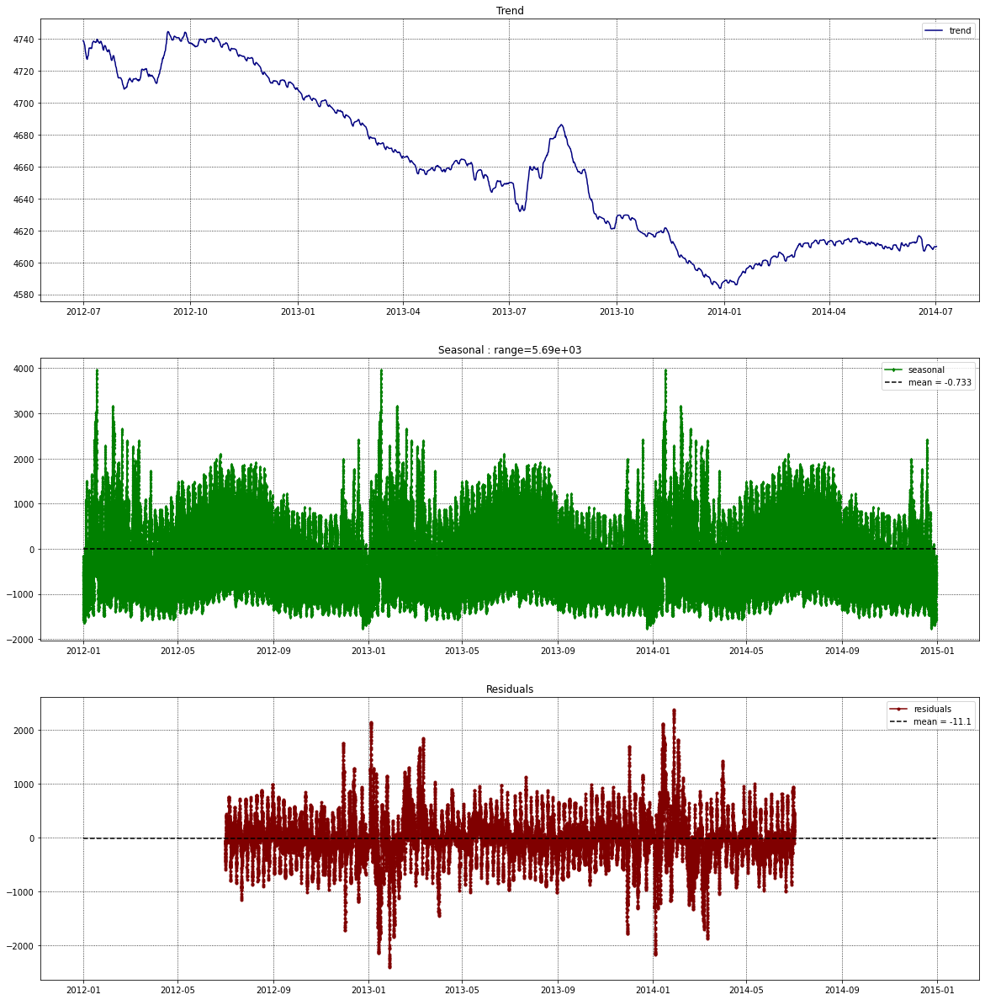

In [60]:
decomposition = seasonal_decompose(vic_elec, period=48*365)
plot_decomposition(decomposition)

Из ряда мы достали дневную компоненту, но в нем еще осталась недельная компонента

<div style="background-color: rgb(175, 219, 245);">
<span style="color:blue">

**NOTE:** 

и годичная...

</span>
</div>

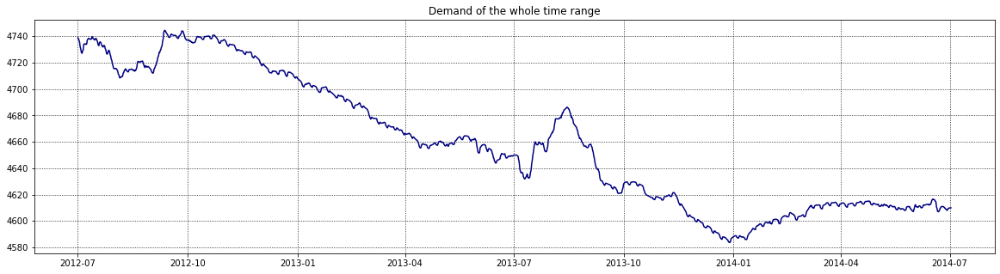

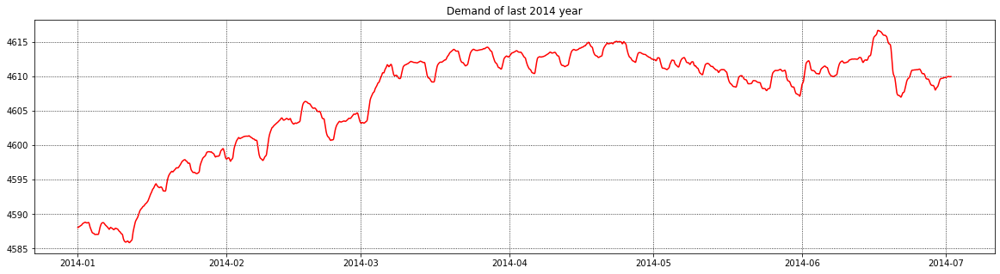

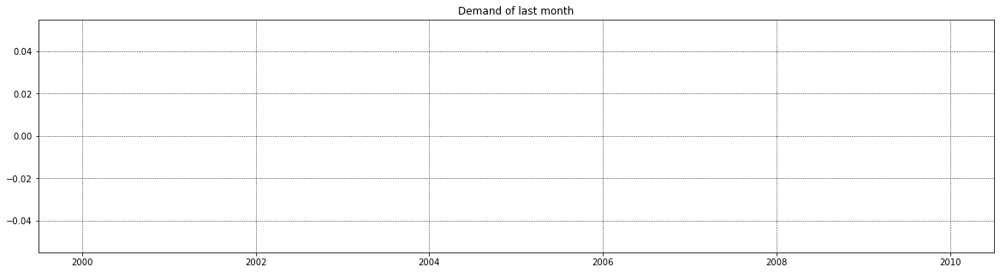

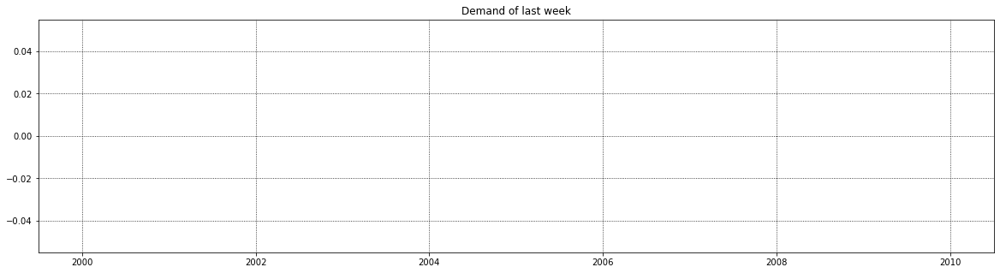

In [61]:
plt.figure(figsize=(20, 5))
plt.plot(decomposition.trend.dropna(), color='navy')
plt.title('Demand of the whole time range')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(decomposition.trend.dropna().loc['2014-01-01':'2015-01-01'], color='red')
plt.title('Demand of last 2014 year')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(decomposition.trend.dropna().loc['2014-12-01':'2015-01-01'], '-o', color='green')
plt.title('Demand of last month')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5));
plt.plot(decomposition.trend.dropna().loc['2014-12-25':'2015-01-01'], '-o', color='orange')
plt.title('Demand of last week')
plt.grid(linestyle=':', color='k')
plt.show()

In [121]:
decomposition = seasonal_decompose(decomposition.trend.dropna(), period=48*7)
plot_decomposition(decomposition)

ValueError: x must have 2 complete cycles requires 672 observations. x only has 214 observation(s)

In [ ]:
decomposition = seasonal_decompose(decomposition.trend.dropna(), period=48*365)
plot_decomposition(decomposition)

In [ ]:
# decomposition = seasonal_decompose(vic_elec, period=24*2*7*24*2)
# plot_decomposition(decomposition)

In [122]:
resid_analytics(decomposition.resid.dropna()

SyntaxError: unexpected EOF while parsing (Temp/ipykernel_30352/3849434923.py, line 1)

Я бы назвал ошибки стационарными несмотря на то, что кпсс провалился (вроде он чуствителен к выбросам). Еще видно, что остатки фитятся под распределение Лапласа.

Аномалии, которые мы наблюдаем в начале каждого года, могут вовсе не ясляться выбрасами, так как существует закономерность в том, что деманд в начале года растет. (нужно провести еще иследования, чтобы убедиться, что это не выбросы. Например посмтореть на месту holiday)




ValueError: could not broadcast input array from shape (214,) into shape (16129,)

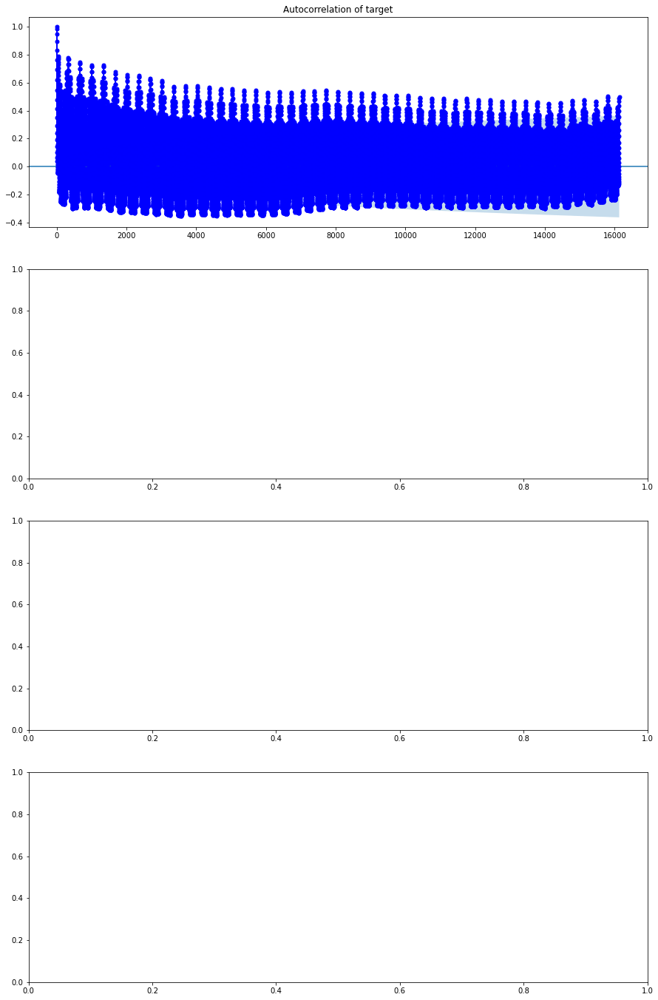

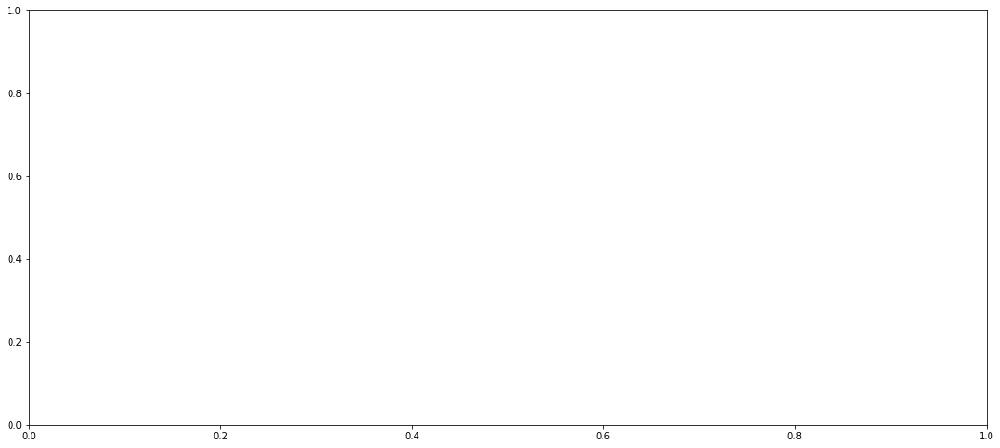

In [123]:
plot_ACF(vic_elec, decomposition, lags=16128)

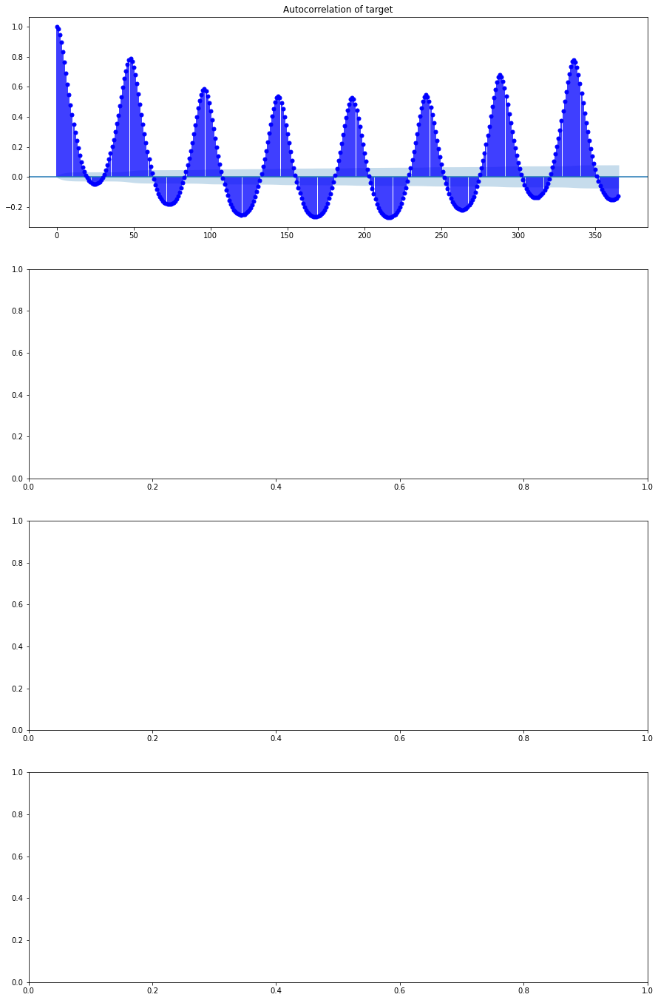

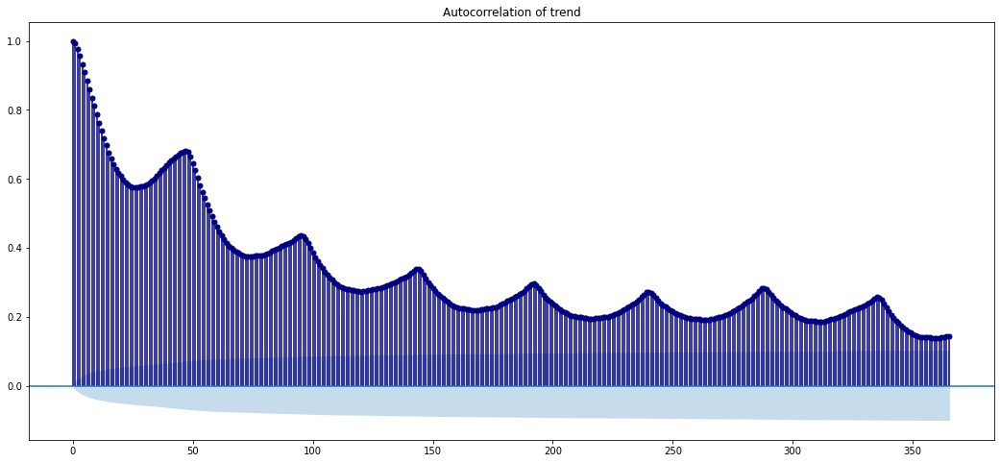

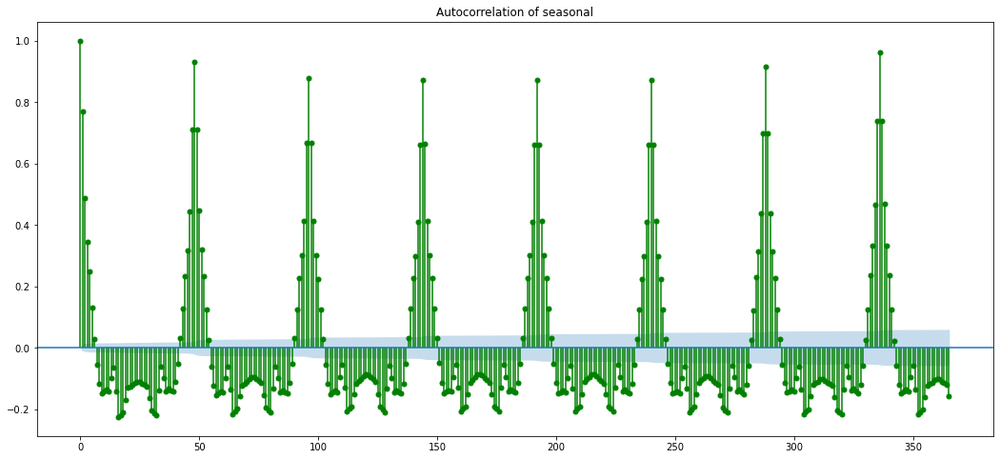

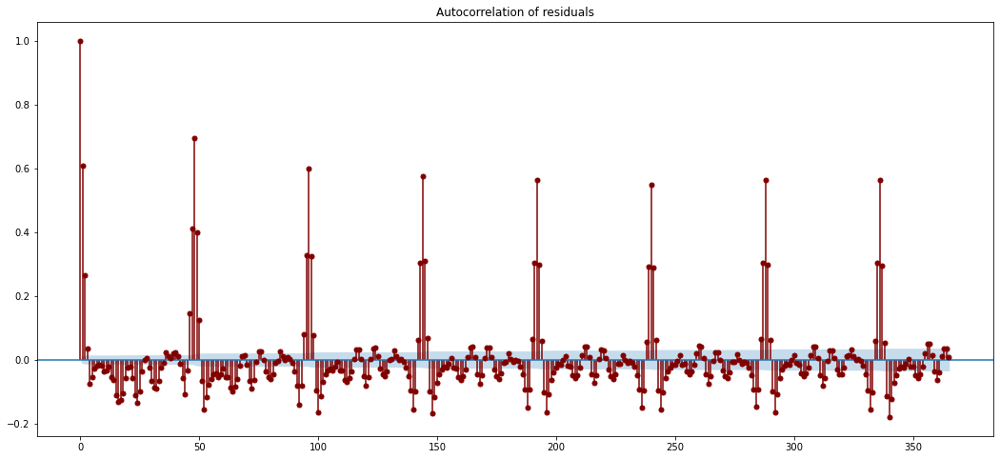

In [130]:
plot_ACF(vic_elec, decomposition, lags=365)

Мне очень нравится acf для тредна и для сезонности. Тренд явно убывающий, а вот автокорреляция сезонной компоненты не постоянно затухает. Бывает так, что сходящийся тренд сменяется на рост acf. (вывод?)

В остатках точно осталась структура. Ее было бы хорошо остать фурье разложением.


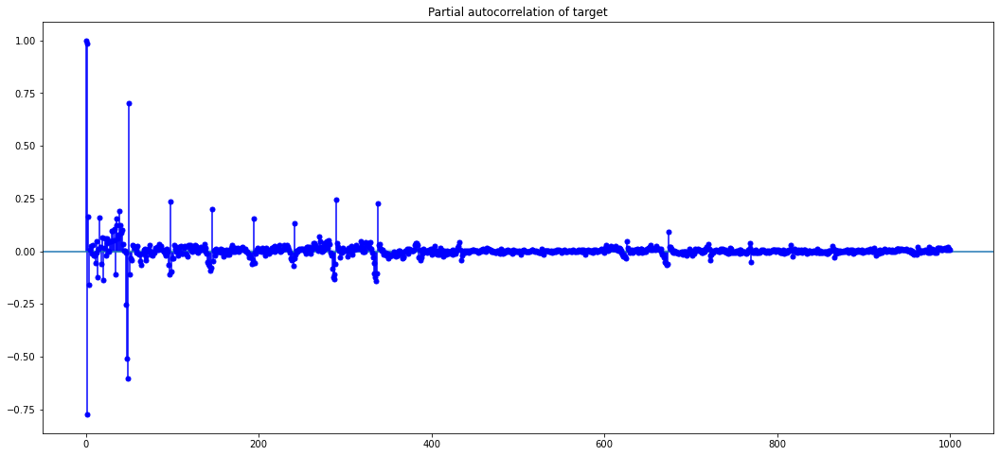

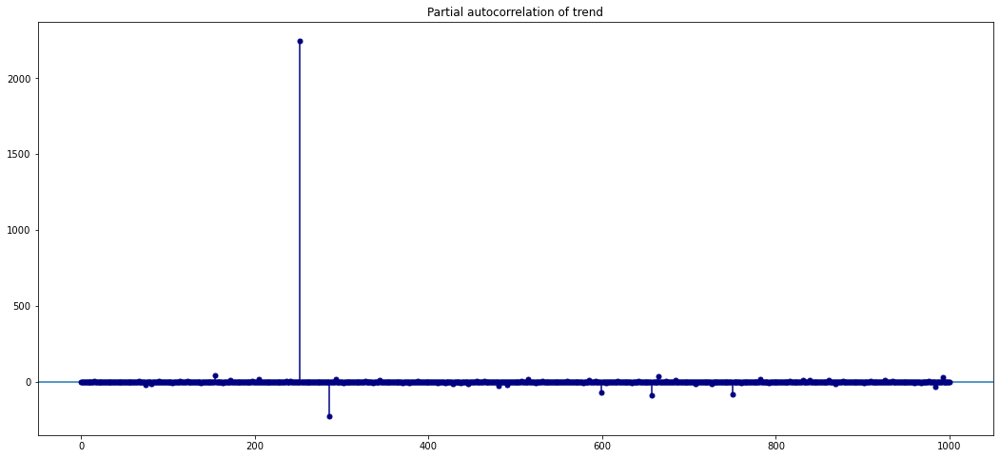

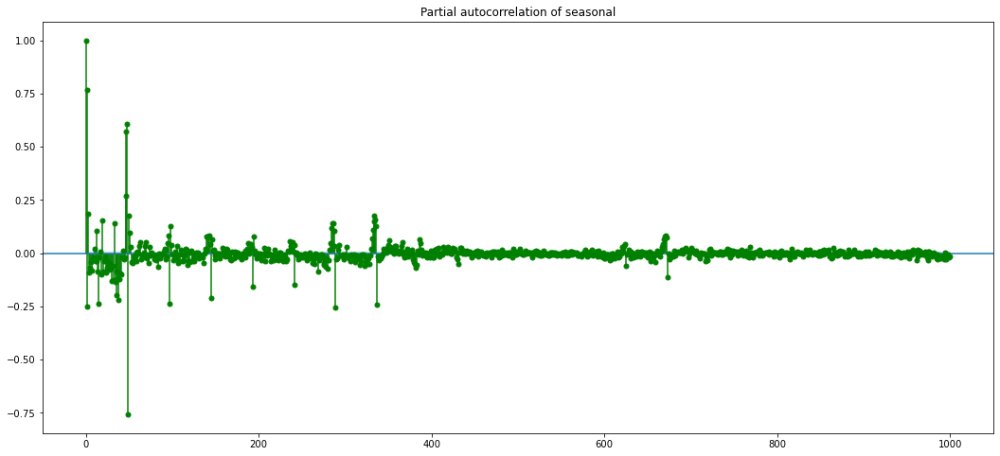

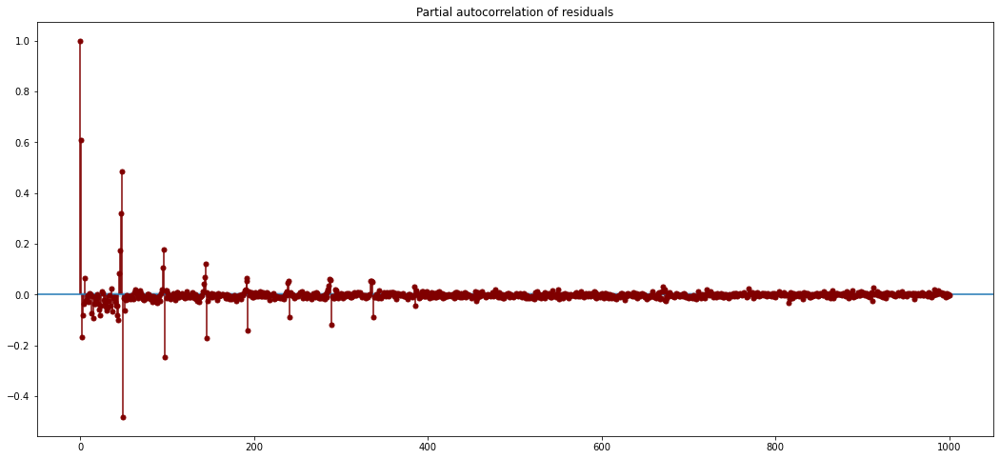

In [131]:
plot_PACF(vic_elec, decomposition, lags=1000)

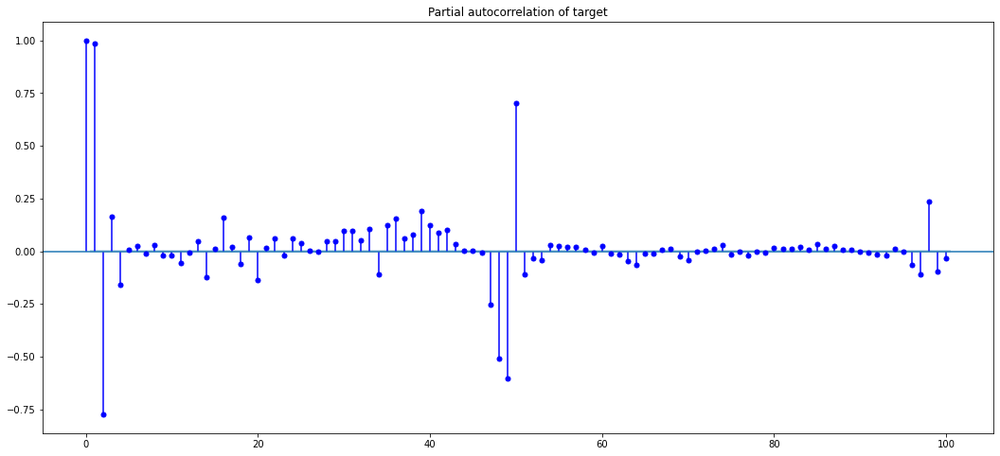

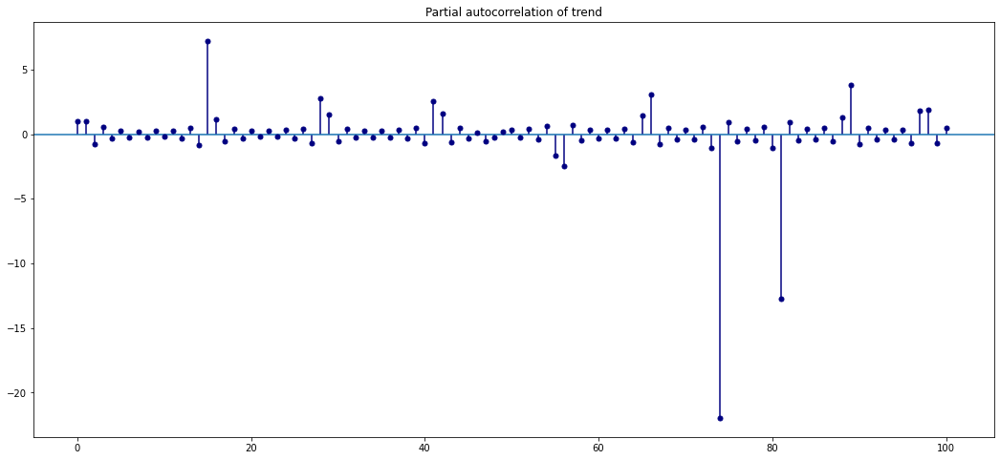

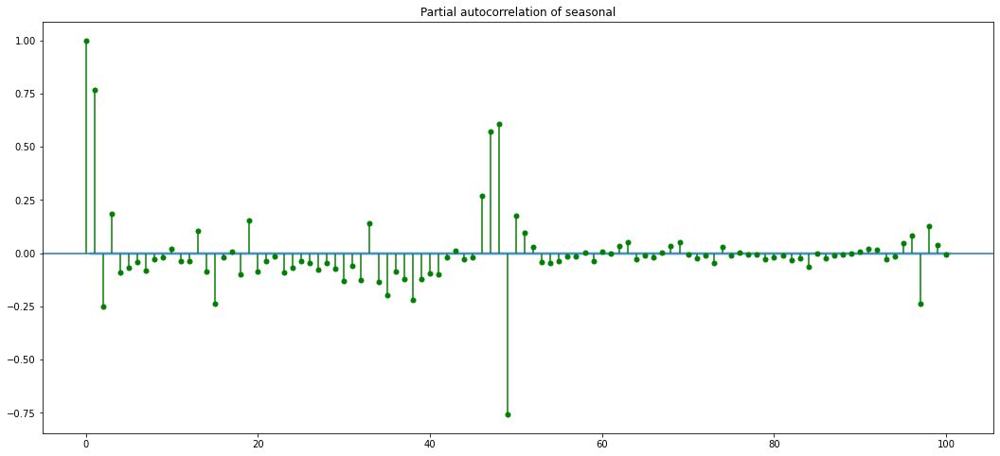

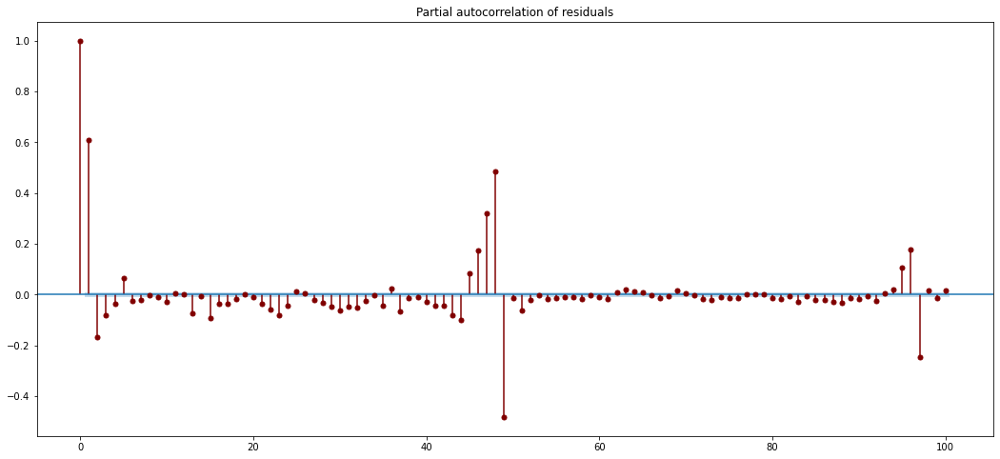

In [132]:
plot_PACF(vic_elec, decomposition, lags=100)

In [133]:
vic_elec_diff = np.log(vic_elec).diff().dropna()

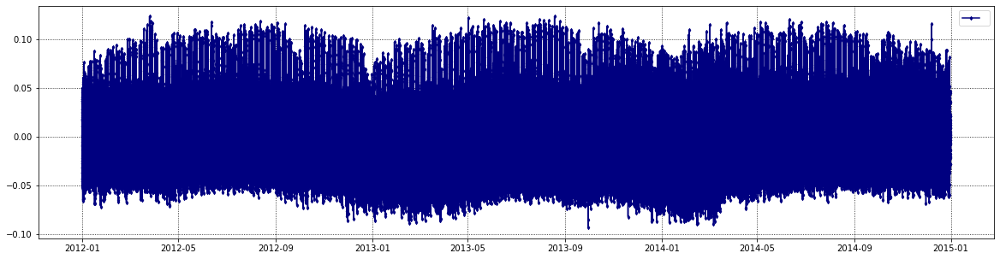

In [134]:
plot_series(vic_elec_diff)

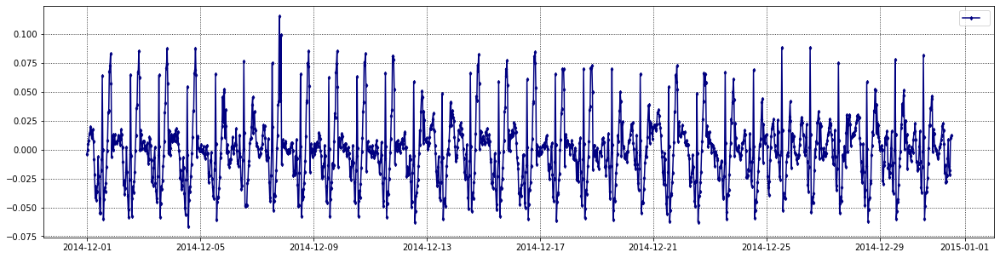

In [135]:
plot_series(vic_elec_diff.loc['2014-12-01':])

In [136]:
get_stationary(vic_elec_diff)

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -32.507976354933696
p-value: 0.0
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.00091823289975961
p-value = 0.1
The process is stationary by KPSS.



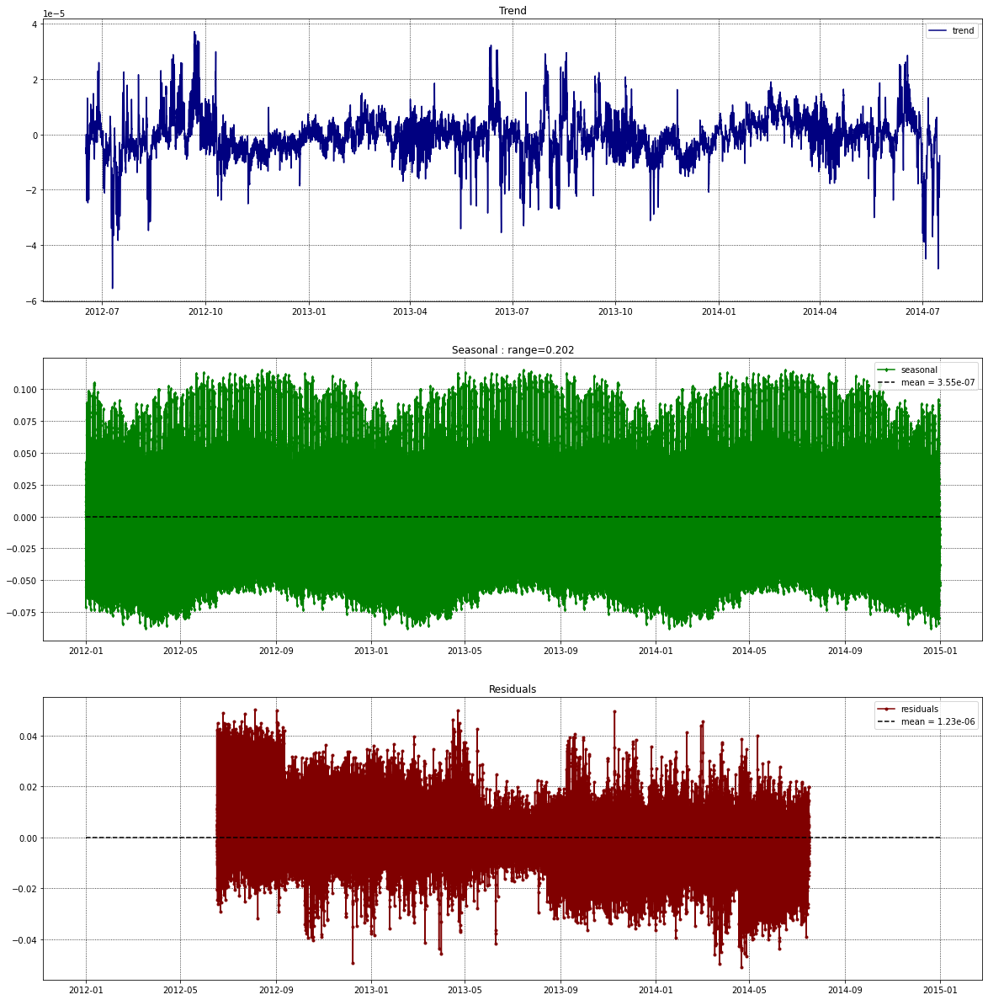

In [137]:
decomposition = seasonal_decompose(vic_elec_diff, period=24*2*7*24*2)
plot_decomposition(decomposition)

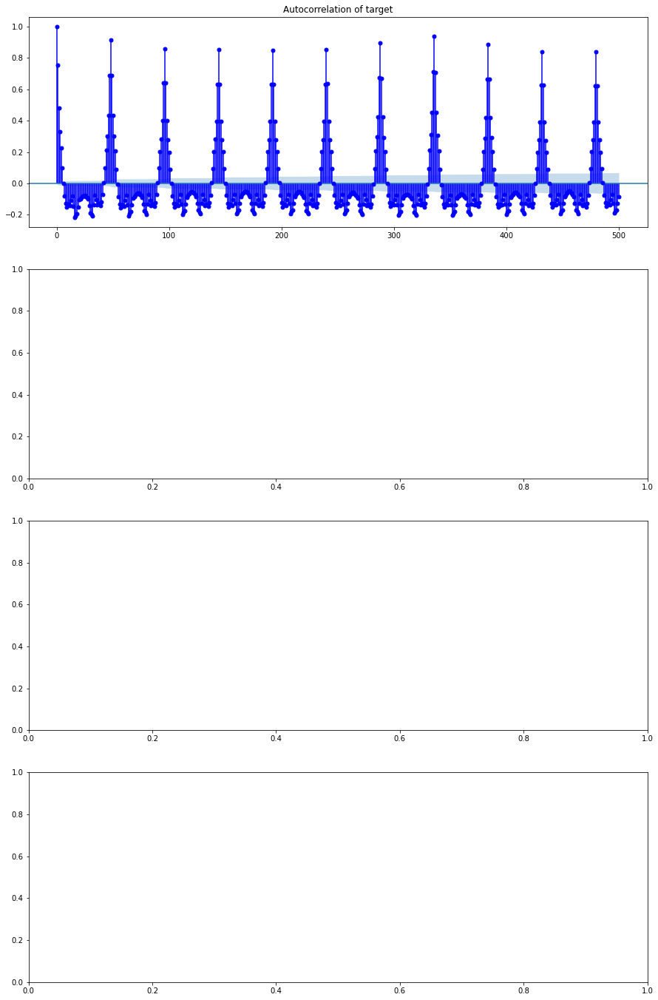

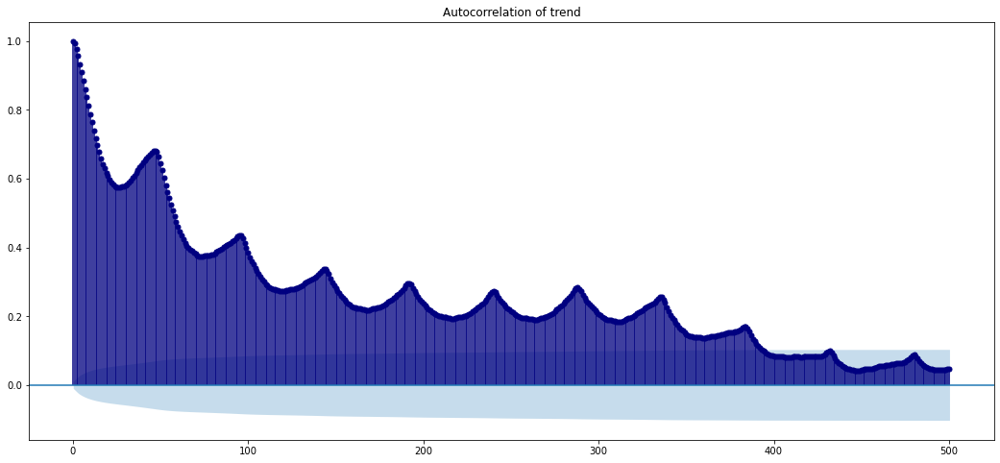

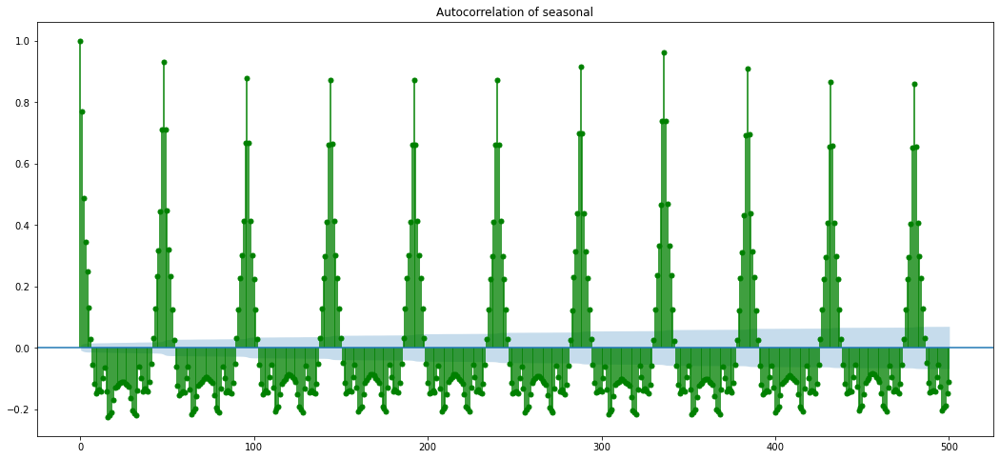

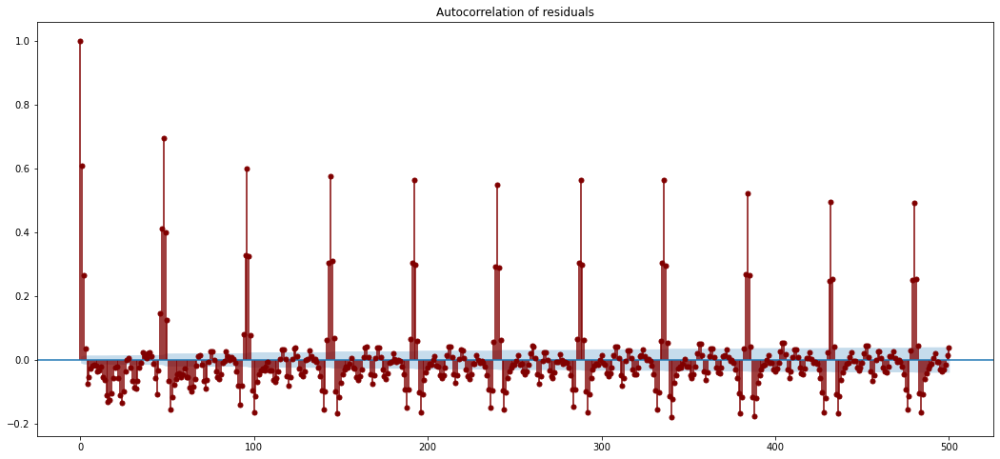

In [138]:
plot_ACF(vic_elec_diff, decomposition, lags=500)

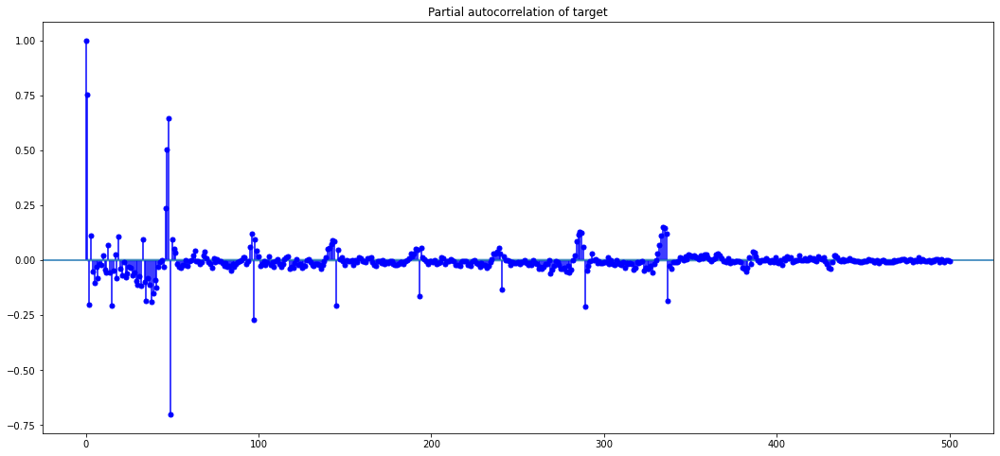

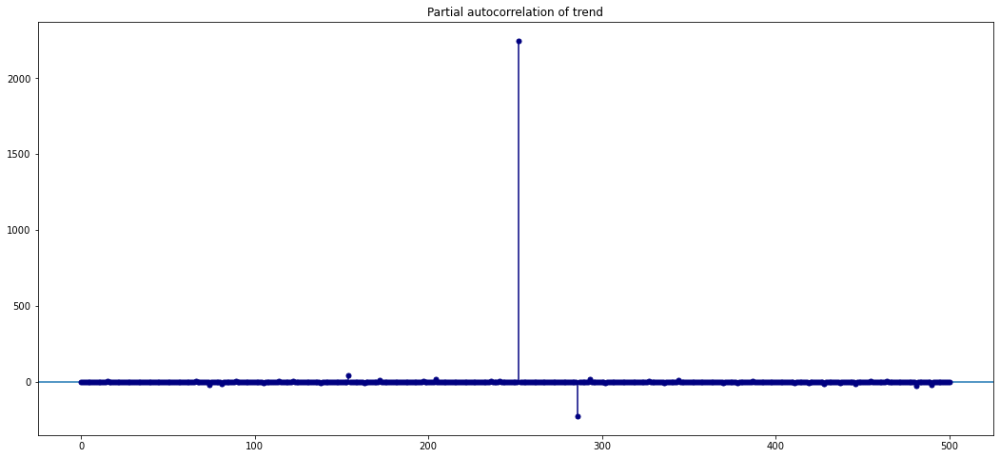

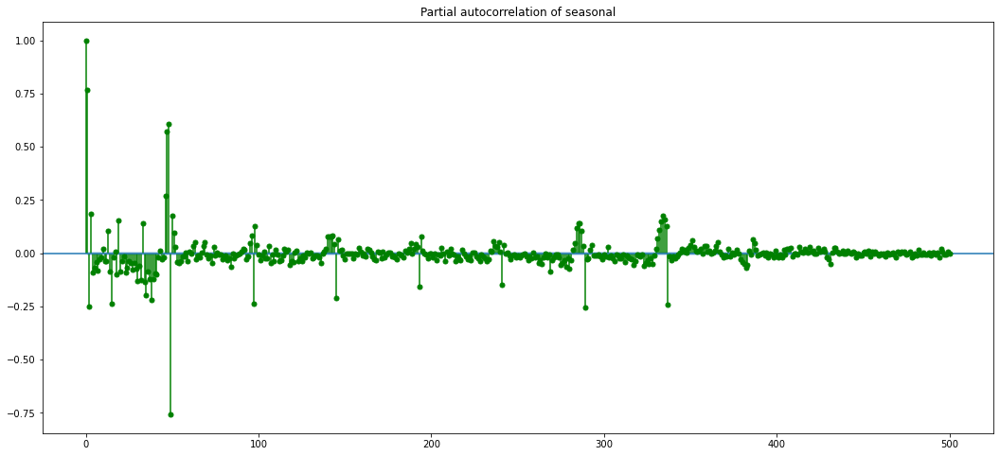

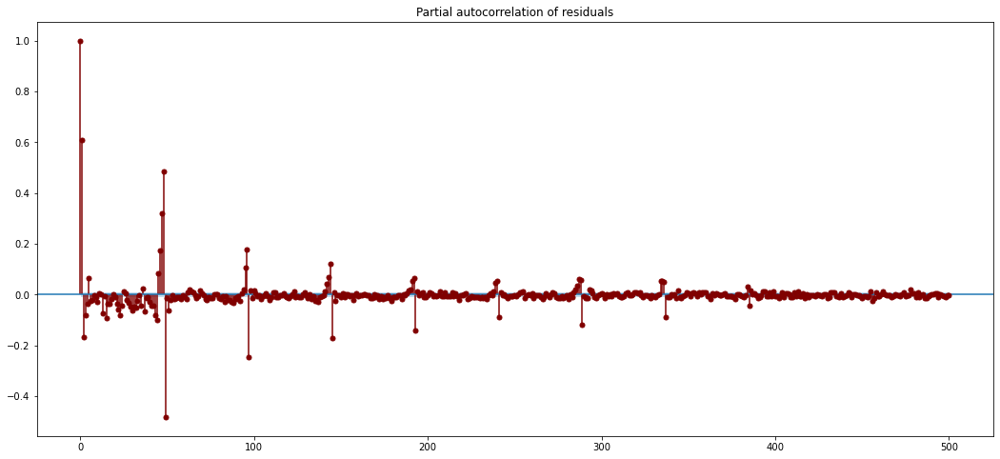

In [139]:
plot_PACF(vic_elec_diff, decomposition, lags=500)

Сделать выводы, какие выводы можно сделать из аcf и pacf для diff ряда

# Task 3
Why is a Box-Cox transformation unhelpful for the canadian_gas data?

In [74]:
canadian_gas = load_data('canadian_gas')

_index = pd.date_range('1960-01-01', '2005-03-01', freq ='M')
canadian_gas.index = _index

canadian_gas['boxcox'] = st.boxcox(canadian_gas['Volume'], lmbda=0.8)
canadian_gas['log'] = np.log(canadian_gas['Volume'])

canadian_gas.head(15)

,Month,Volume,boxcox,log
1960-01-31,1960 Jan,1.4306,0.414656,0.358094
1960-02-29,1960 Feb,1.3059,0.297526,0.266892
1960-03-31,1960 Mar,1.4022,0.388166,0.338042
1960-04-30,1960 Apr,1.1699,0.167193,0.156918
1960-05-31,1960 May,1.1161,0.114811,0.109840
1960-06-30,1960 Jun,1.0113,0.011287,0.011237
1960-07-31,1960 Jul,0.9660,-0.034117,-0.034591
1960-08-31,1960 Aug,0.9773,-0.022752,-0.022962
1960-09-30,1960 Sep,1.0311,0.031004,0.030626
1960-10-31,1960 Oct,1.2521,0.246309,0.224822


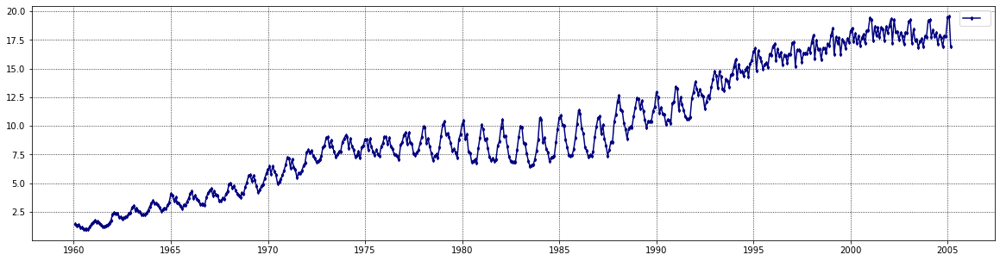

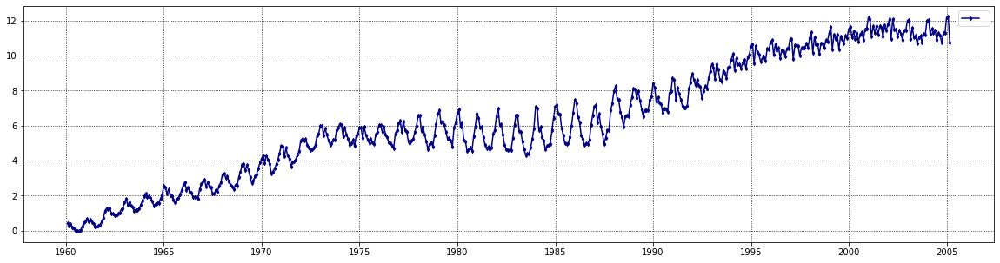

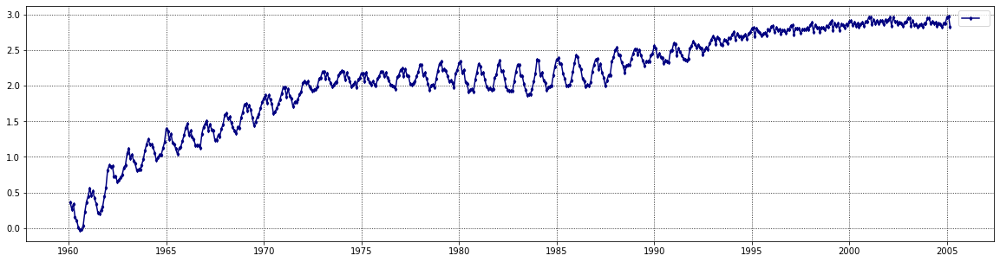

In [75]:
plot_series(canadian_gas['Volume'])
plot_series(canadian_gas['boxcox'])
plot_series(canadian_gas['log'])

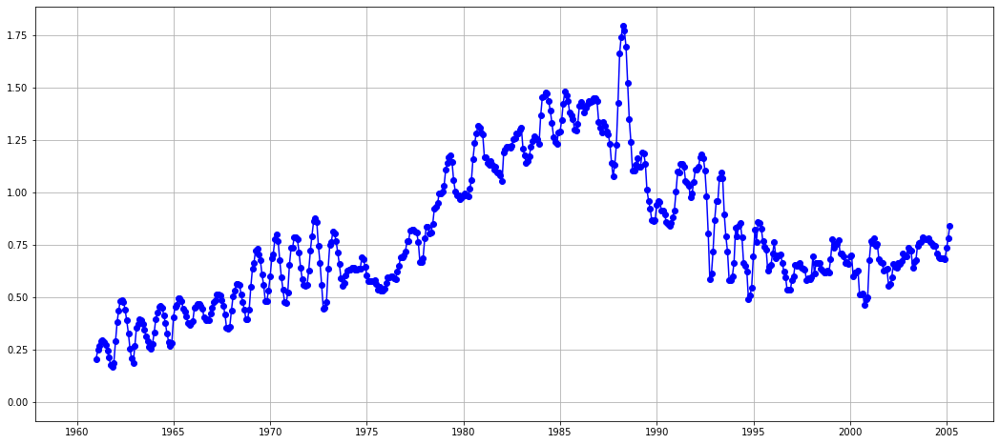

In [76]:
plt.plot(canadian_gas['Volume'].rolling(12).std(), '-ob')
plt.plot(canadian_gas.index[0], 0)
plt.grid()

In [77]:
canadian_gas

,Month,Volume,boxcox,log
1960-01-31,1960 Jan,1.4306,0.414656,0.358094
1960-02-29,1960 Feb,1.3059,0.297526,0.266892
1960-03-31,1960 Mar,1.4022,0.388166,0.338042
1960-04-30,1960 Apr,1.1699,0.167193,0.156918
1960-05-31,1960 May,1.1161,0.114811,0.109840
...,...,...,...,...
2004-10-31,2004 Oct,17.8268,11.274740,2.880703
2004-11-30,2004 Nov,17.8322,11.277775,2.881006
2004-12-31,2004 Dec,19.4526,12.180499,2.967981
2005-01-31,2005 Jan,19.5284,12.222350,2.971870


Как можно заметить, логарифмирование и преобрахование бокса кокса не сработало. Как видно в начале и в конце дисперсия сожается, а посерединке она растет. Думаю в этом и есть причина. 

Даже если мы возьмем логарифм, дисперсия стабилизируется в начала и в середине, но в конце она станет еще меньше прежней. 


# Task 5
For the following series, find an appropriate Box-Cox transformation in order to stabilise the variance. Tobacco from aus_production, Economy class passengers between Melbourne and Sydney from ansett, and Pedestrian counts at Southern Cross Station from pedestrian.

## Tobacco from aus_production

In [78]:
aus_production =  load_data('aus_production')
_index = pd.date_range('1956-01-01', '2010-07-01', freq ='Q')
aus_production.index = _index
aus_production = aus_production['Tobacco']

In [79]:
print(f'nans: {aus_production.isna().sum()}')
print(f'full: {aus_production.shape[0]}')

nans: 24
full: 218


In [80]:
aus_production[aus_production.isna() == True]

2004-09-30   NaN
2004-12-31   NaN
2005-03-31   NaN
2005-06-30   NaN
2005-09-30   NaN
2005-12-31   NaN
2006-03-31   NaN
2006-06-30   NaN
2006-09-30   NaN
2006-12-31   NaN
2007-03-31   NaN
2007-06-30   NaN
2007-09-30   NaN
2007-12-31   NaN
2008-03-31   NaN
2008-06-30   NaN
2008-09-30   NaN
2008-12-31   NaN
2009-03-31   NaN
2009-06-30   NaN
2009-09-30   NaN
2009-12-31   NaN
2010-03-31   NaN
2010-06-30   NaN
Freq: Q-DEC, Name: Tobacco, dtype: float64

In [81]:
aus_production = aus_production.dropna()

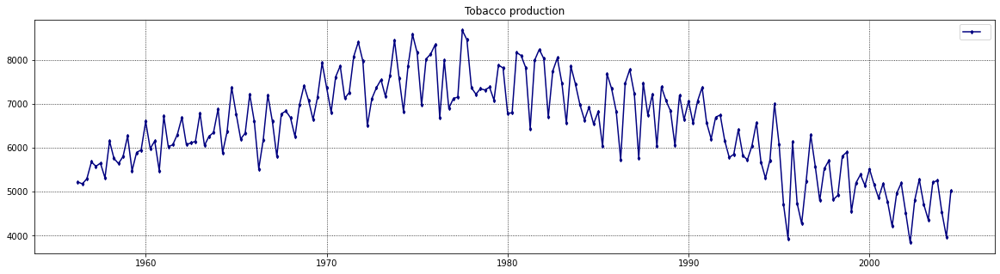

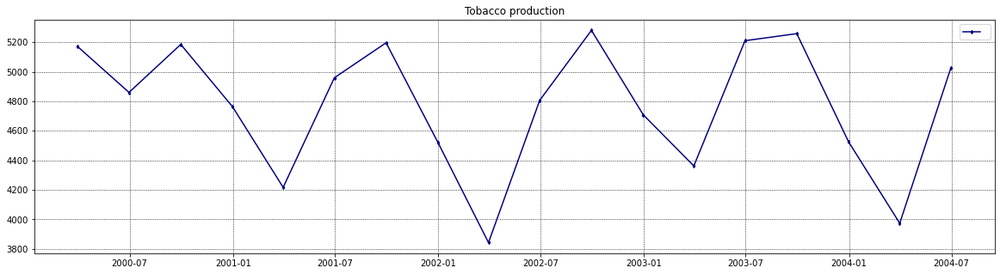

In [82]:
plot_series(aus_production, title='Tobacco production')
plot_series(aus_production.loc['2000-01-01':], title='Tobacco production')

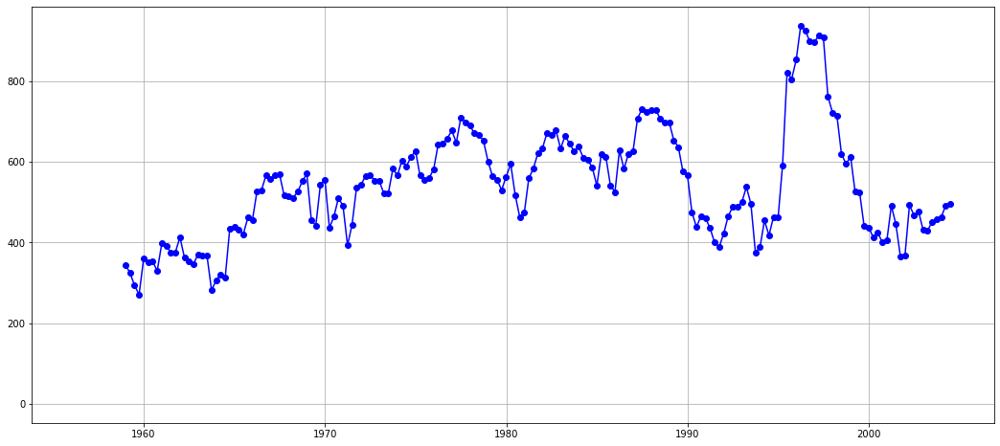

In [83]:
plt.plot(aus_production.rolling(12).std(), '-ob')
plt.plot(aus_production.index[0], 0)
plt.grid()

In [84]:
fitted_data, fitted_lambda = st.boxcox(aus_production)
print(f'fitted_lambda: {fitted_lambda}')
aus_production = pd.DataFrame(aus_production)
aus_production['boxcox'] = fitted_data

fitted_lambda: 1.4081156926256786


In [85]:
aus_production

,Tobacco,boxcox
1956-03-31,5225.0,122139.122238
1956-06-30,5178.0,120594.906765
1956-09-30,5297.0,124515.732921
1956-12-31,5681.0,137411.752847
1957-03-31,5577.0,133882.833816
...,...,...
2003-06-30,5210.0,121645.669016
2003-09-30,5258.0,123226.754198
2003-12-31,4526.0,99776.346063
2004-03-31,3974.0,83078.220204


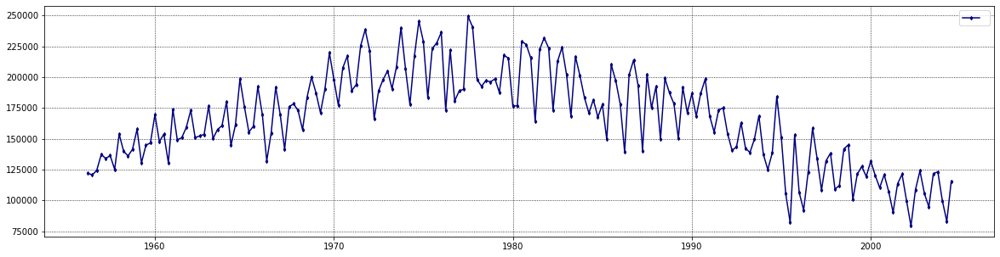

In [86]:
plot_series(aus_production['boxcox'])

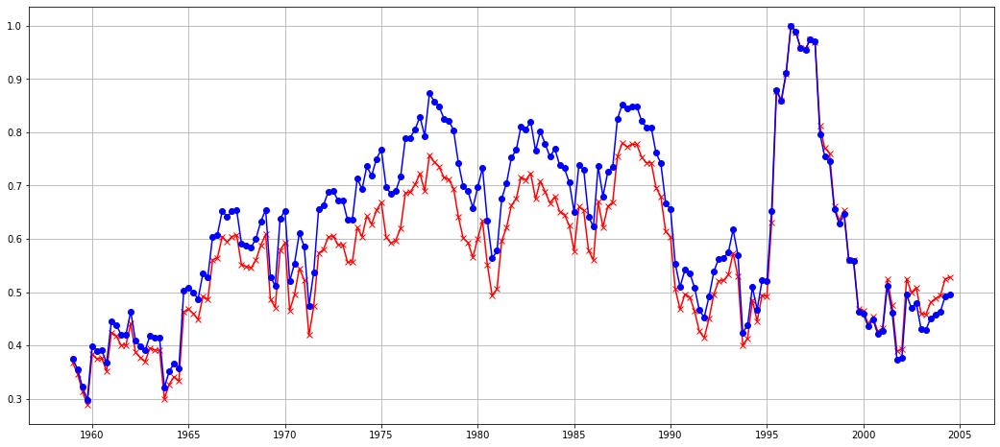

In [87]:
y0 = aus_production['Tobacco'].rolling(12).std()
y1 = aus_production['boxcox'].rolling(12).std()

plt.plot(y0/y0.max(), '-xr')
plt.plot(y1/y1.max(), '-ob')
# plt.plot(0, 0)
plt.grid()

# Task 6

In [88]:
!pip install pandas_ta

In [89]:
import pandas_ta as ta

In [90]:
moving_averages_3_5 = ta.Strategy(
    name="SMA_3_5",
    ta=[
        {"kind": "sma", "length": 3},
        {"kind": "sma", "length": 5},
    ]
)

moving_averages_7 = ta.Strategy(
    name="SMA_7",
    ta=[
        {"kind": "sma", "length": 7},
    ]
)

In [91]:
aus_production = pd.DataFrame(aus_production)

In [92]:
aus_production['SMA_7'] = aus_production['Tobacco'].rolling(window=7).mean()

In [93]:
aus_production['SMA_3'] = aus_production['Tobacco'].rolling(window=3).mean()
aus_production['SMA_3_5'] = aus_production['SMA_3'].rolling(window=5).mean()

In [94]:
aus_production = aus_production.dropna()

In [95]:
px.line(aus_production)

Как видно, графики sma_7 и sma_3_5 почти одинаковые. Разнина заключается в том, что для sma_7 у нас для значения возьмутся с коэф 1/7=0.1428, а для sma_3_5 у нас будут такие: 0.067, 0.133, 0.200, 0.200, 0.200, 0.133, and 0.067.

Зачем делать и так и так: потому что ряд может быть четный и нечетный, то есть чтобы ряд был симметричным 

# Task7 
Consider the last five years of the Gas data from aus_production.

In [96]:
aus_production = load_data('aus_production')

_index = pd.date_range('1956-01-01', '2010-07-01', freq ='Q')
aus_production.index = _index
aus_production = aus_production['Gas']
aus_production.head(10)

1956-03-31    5
1956-06-30    6
1956-09-30    7
1956-12-31    6
1957-03-31    5
1957-06-30    7
1957-09-30    7
1957-12-31    6
1958-03-31    5
1958-06-30    7
Freq: Q-DEC, Name: Gas, dtype: int64

## Plot the time series. Can you identify seasonal fluctuations and/or a trend-cycle?

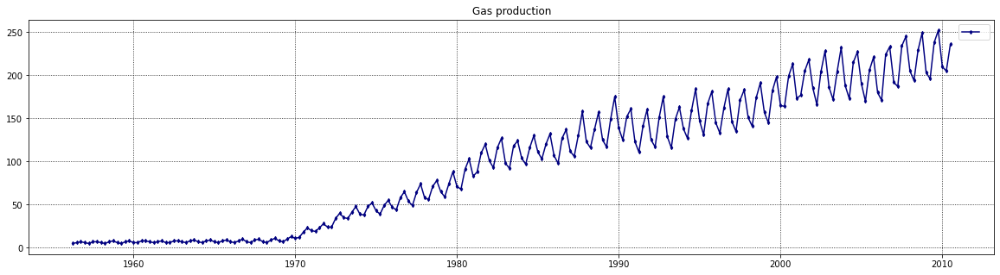

In [97]:
plot_series(aus_production, title='Gas production')

Легко заметить тренд и сезонность

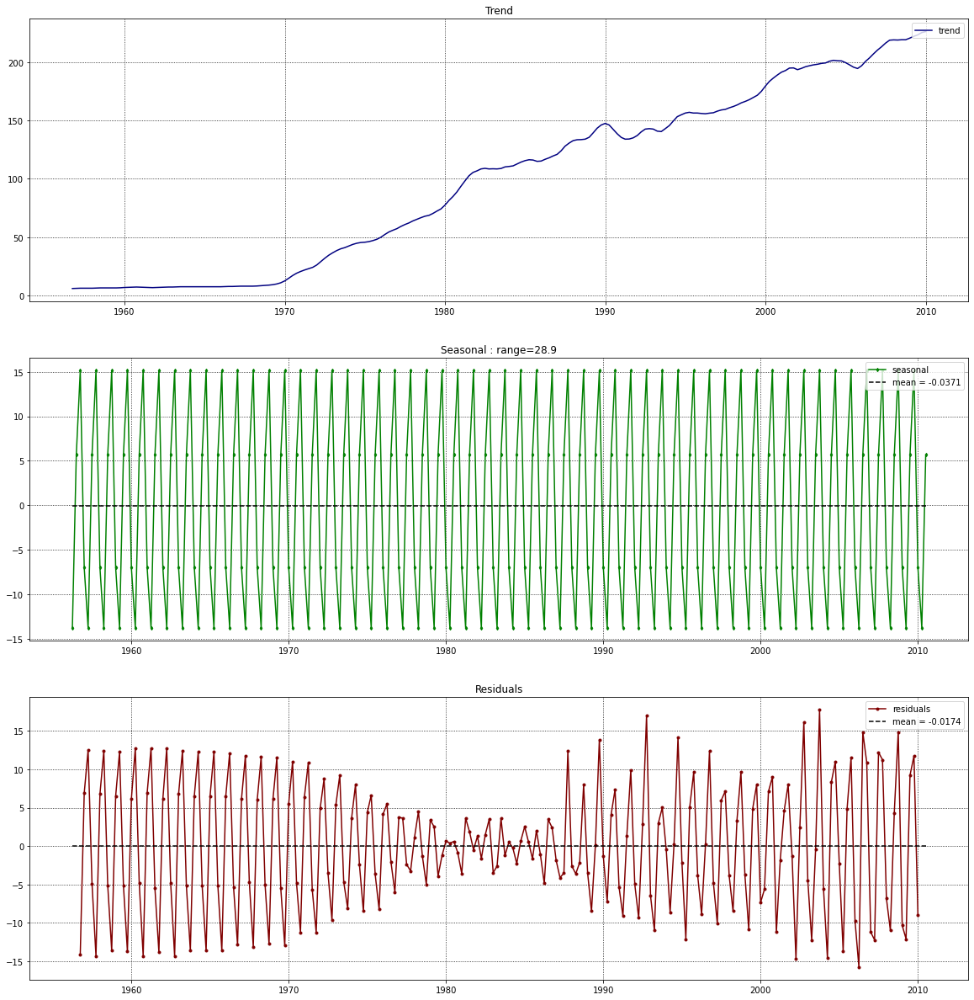

In [98]:
decomposition = seasonal_decompose(aus_production)
plot_decomposition(decomposition)

Интересно посмотреть на остатки, потому что к центру дисперсия уменьшается, как будто она не постоянная, значит они не стационарные, но это нужно проверить.

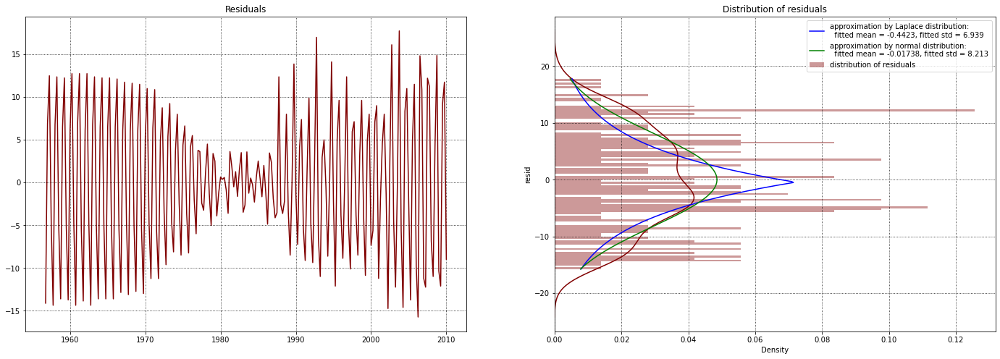

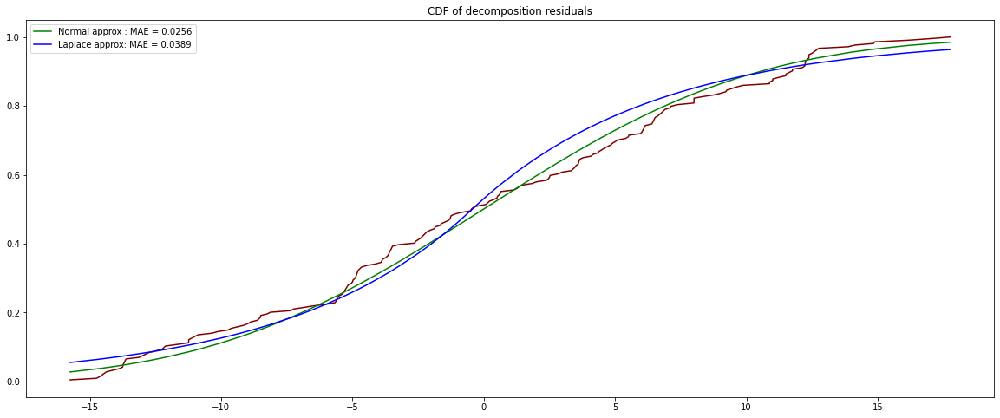

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -8.214024315260215
p-value: 6.699065061808378e-13
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.16370054183683208
p-value = 0.1
The process is stationary by KPSS.



In [99]:
resid_analytics(decomposition.resid.dropna())

Ага, я ошибся, она все таки стационарные :) 

Давайте ка проверем acf и pacf для стац и не стац ряда 

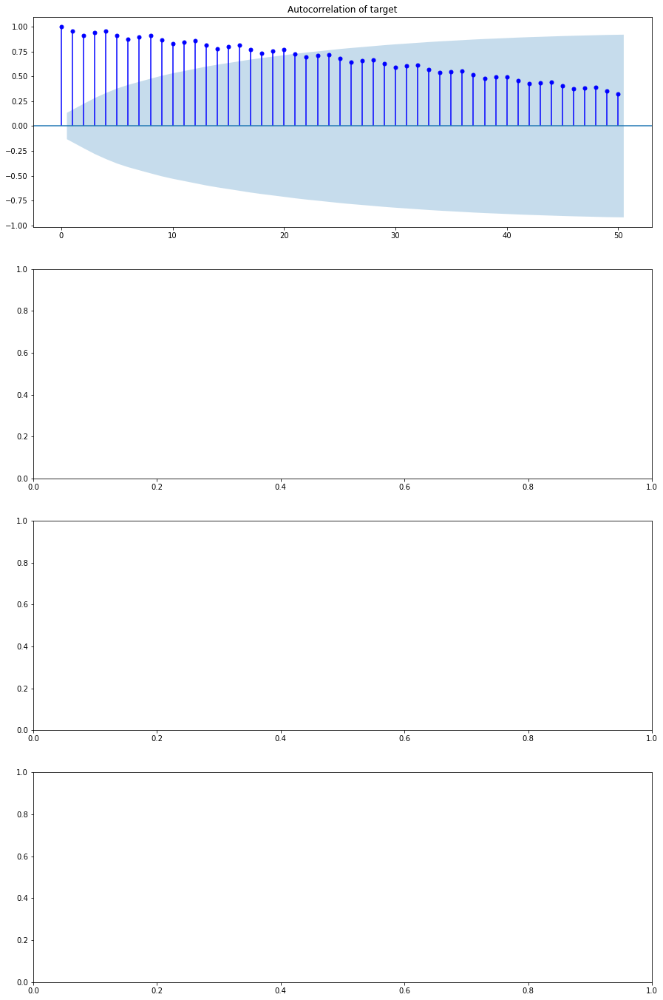

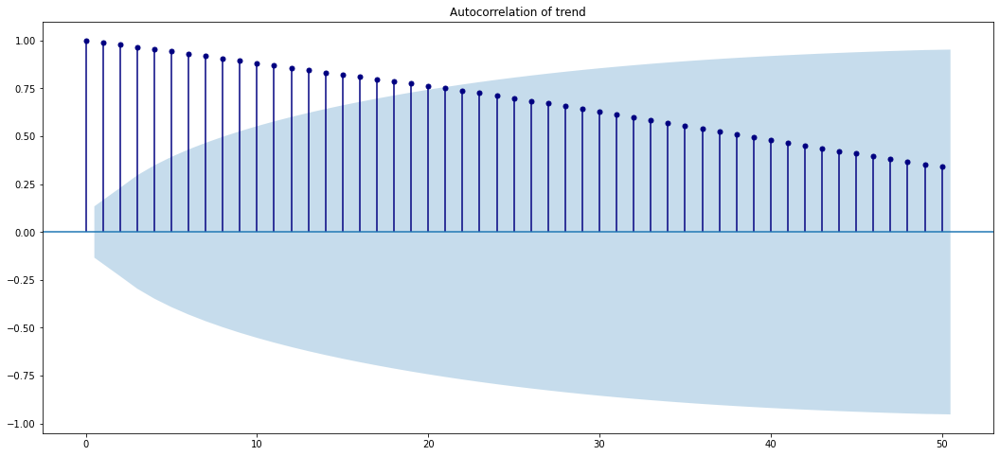

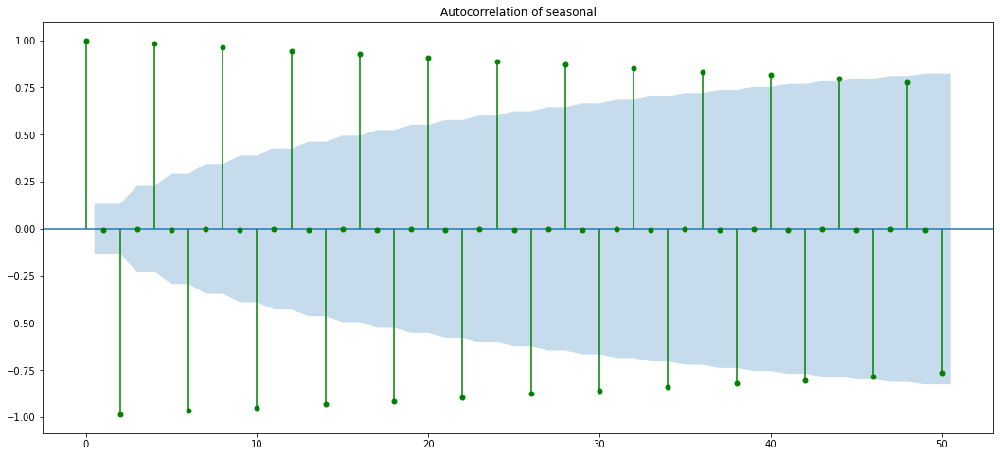

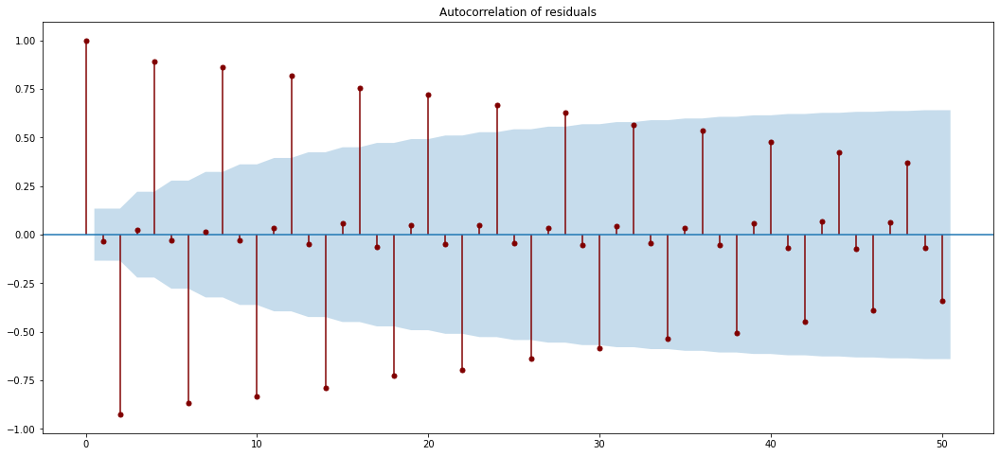

In [100]:
plot_ACF(aus_production, decomposition)

все выглядит отлично, кроме остатков

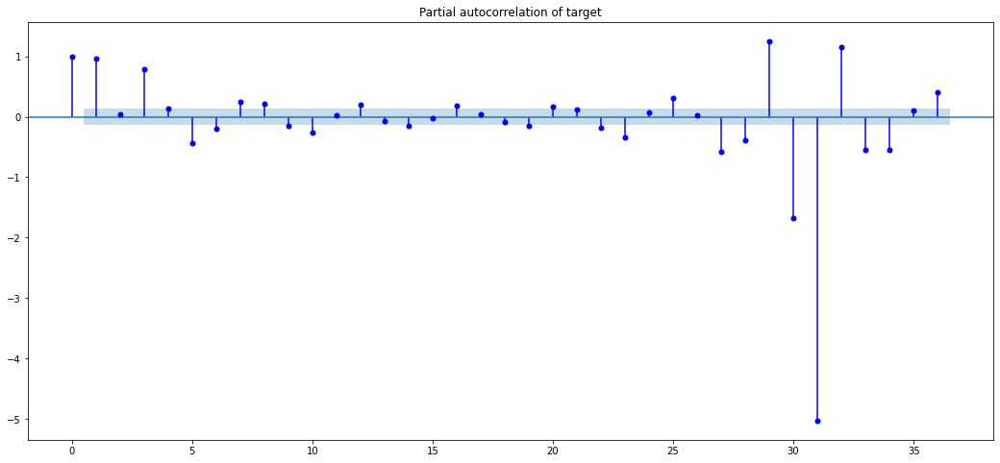

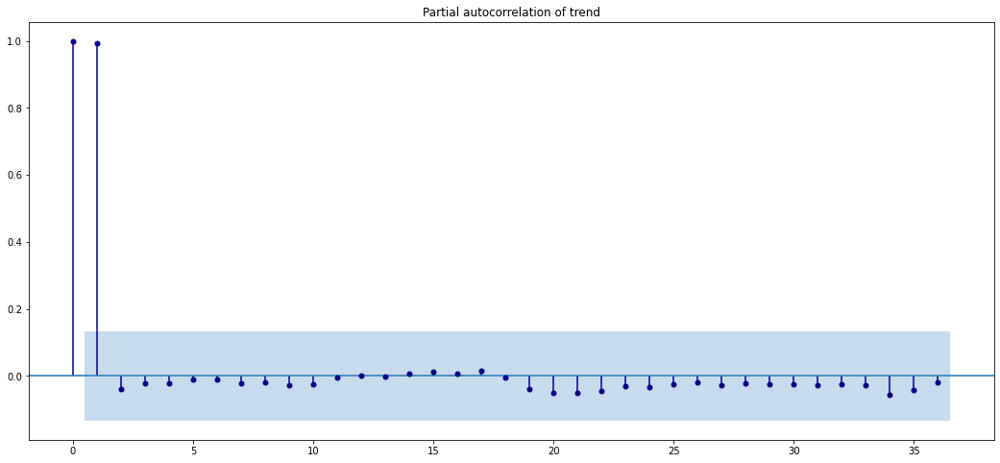

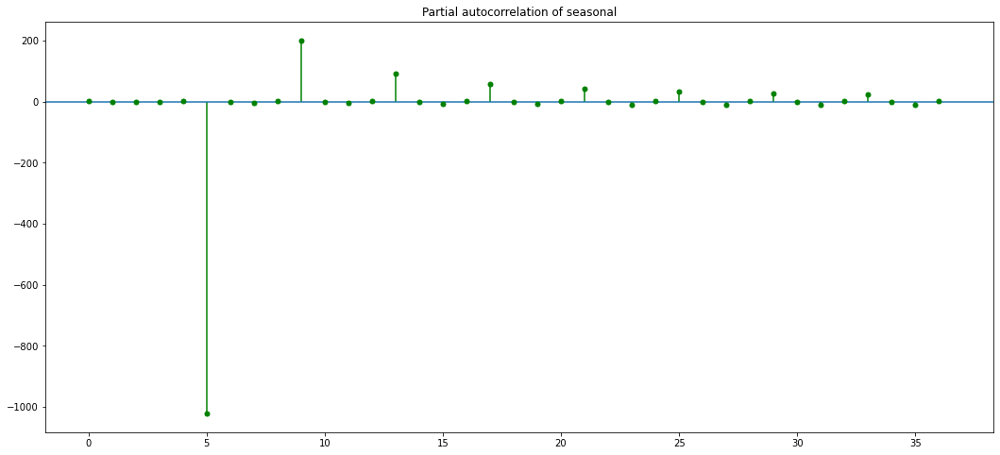

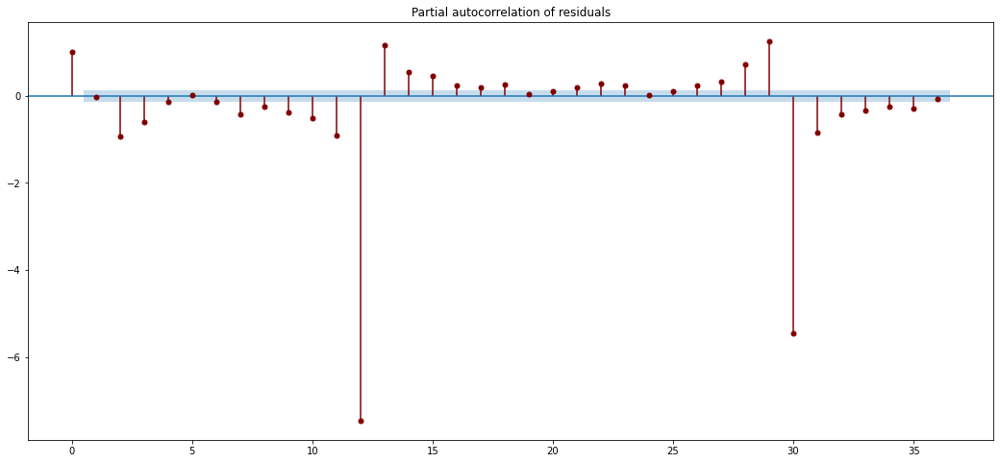

In [101]:
plot_PACF(aus_production, decomposition)

тут мало что понятно, почему-то есть большие пинги, не могу их объяснить

## Use classical_decomposition with type=multiplicative to calculate the trend-cycle and seasonal indices.


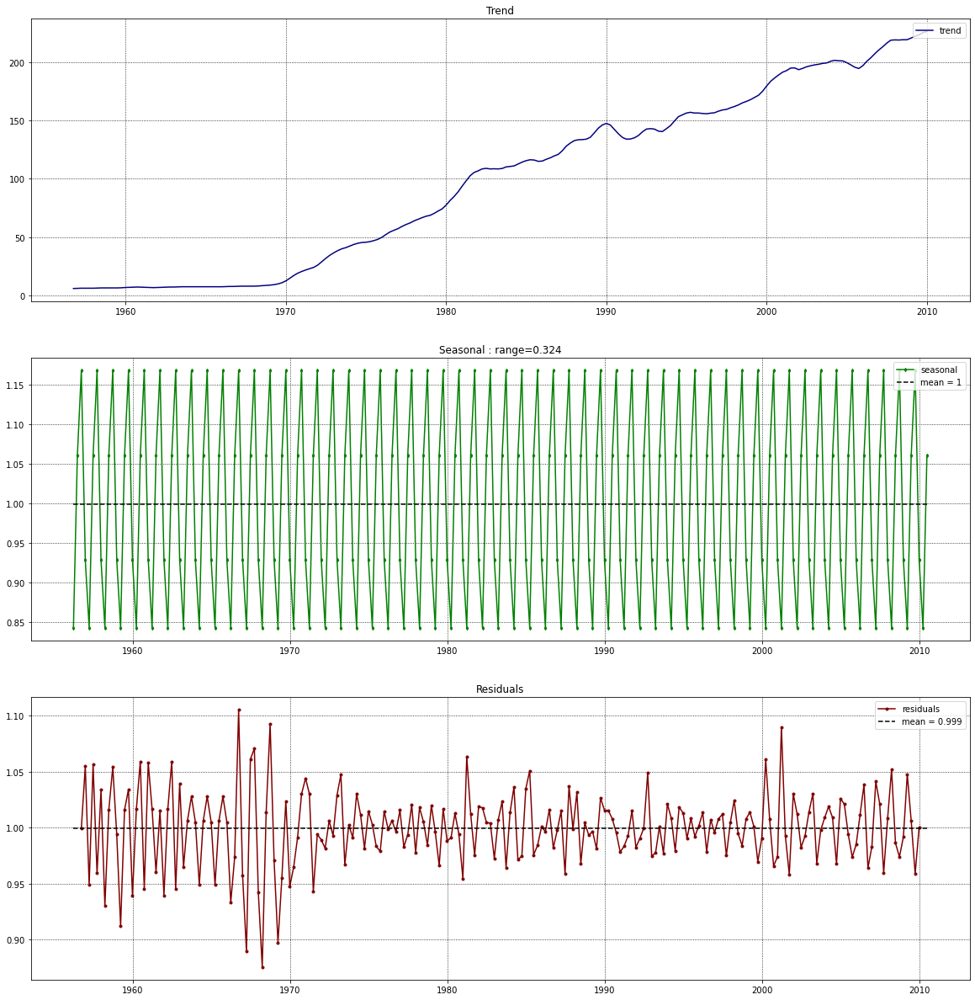

In [102]:
decomposition = seasonal_decompose(aus_production, model='multiplicative')
plot_decomposition(decomposition)

Вооо, так намнооого лучше. Действительно, при постоянном увеличении дисперсии лучше исплользовать multiplicative модель.

И остатки приятнее выглядят

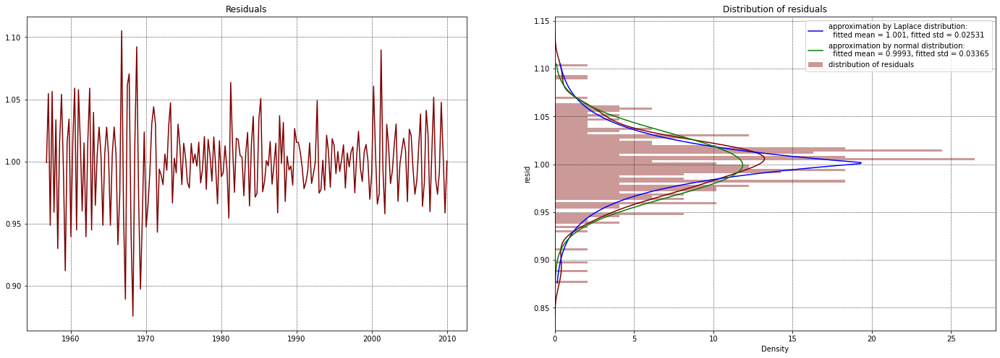

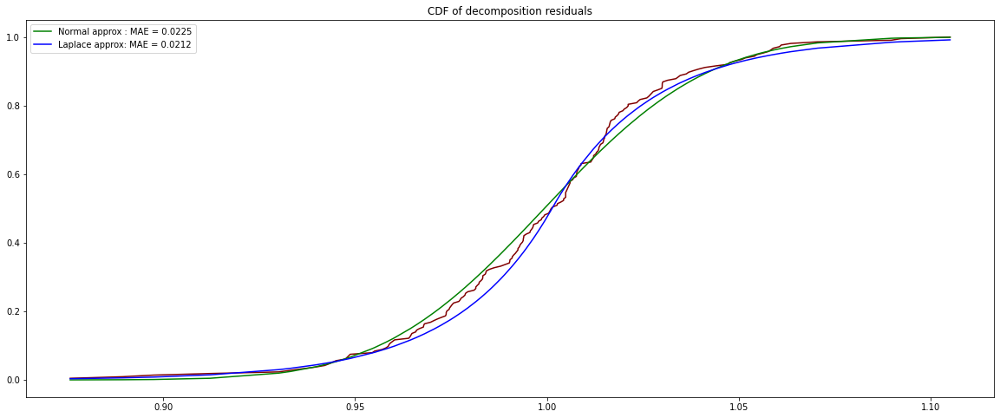

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -3.2559097573420313
p-value: 0.016968078708492818
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.288716803148142
p-value = 0.1
The process is stationary by KPSS.



In [103]:
resid_analytics(decomposition.resid.dropna())

### Do the results support the graphical interpretation from part a?


yes.

## Compute and plot the seasonally adjusted data.


In [104]:
aus_production = pd.DataFrame(aus_production)

In [105]:
aus_production['diff'] = aus_production.diff(1)

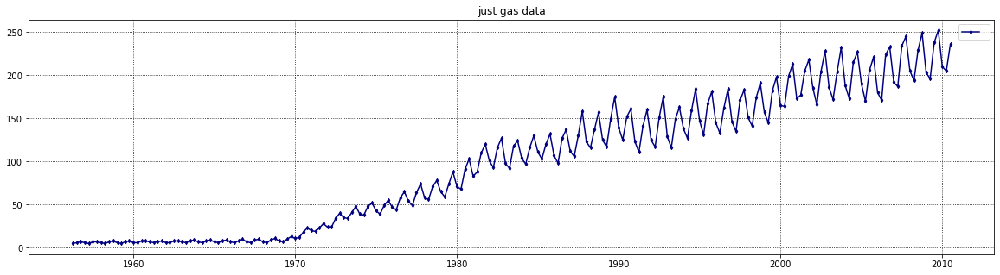

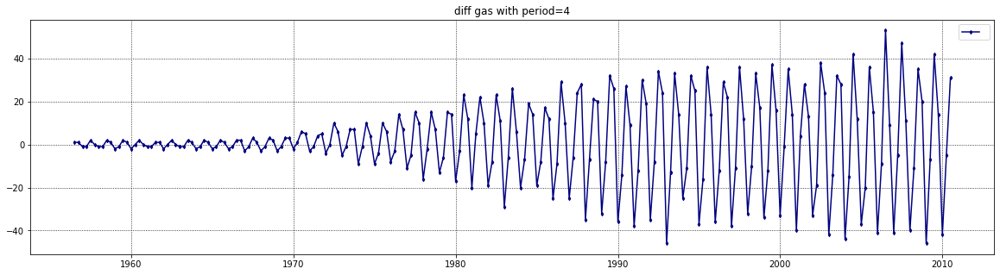

In [106]:
plot_series(aus_production['Gas'].dropna(), title='just gas data')
plot_series(aus_production['diff'].dropna(), title='diff gas with period=4')

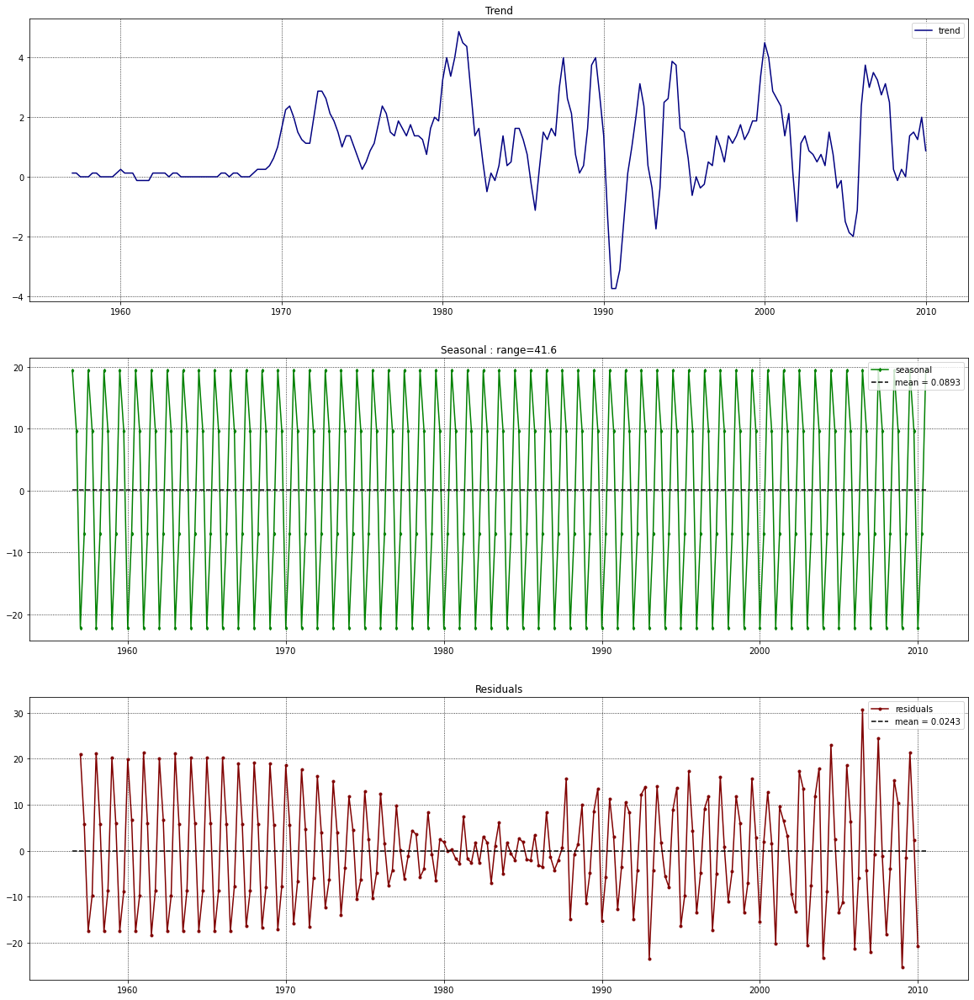

In [107]:
decomposition = seasonal_decompose(aus_production['diff'].dropna())
plot_decomposition(decomposition)

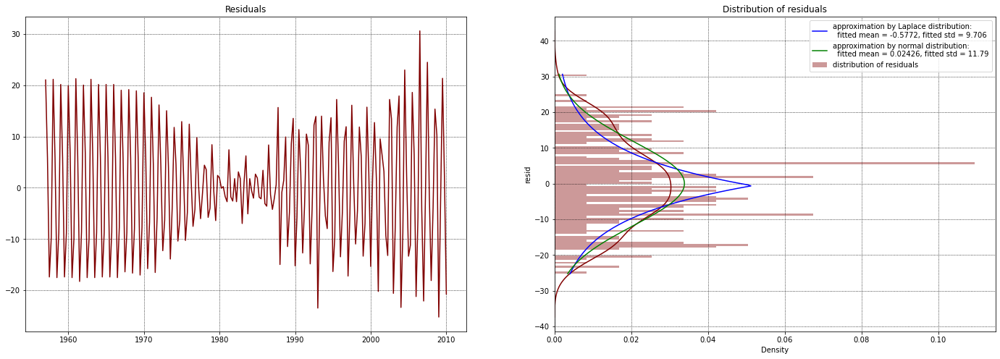

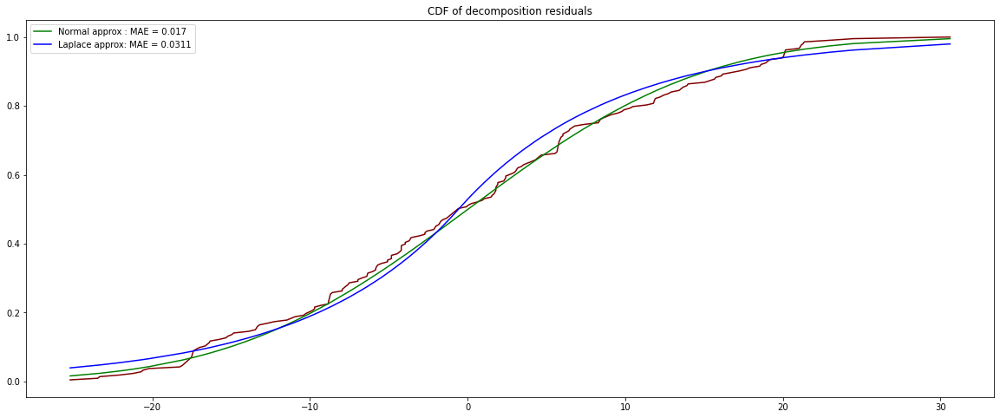

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -8.612942138537337
p-value: 6.402622591237292e-14
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.2824498418146744
p-value = 0.1
The process is stationary by KPSS.



In [108]:
resid_analytics(decomposition.resid.dropna())

Как-то непонялтно, почему остатки стациораный, а дисперсия непостоянна



In [109]:
get_stationary(aus_production['diff'].dropna())

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: -5.33603980580758
p-value: 4.608851632446718e-06
The process is stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 0.31052839452175984
p-value = 0.1
The process is stationary by KPSS.



Даже сам ряд стал стационарным

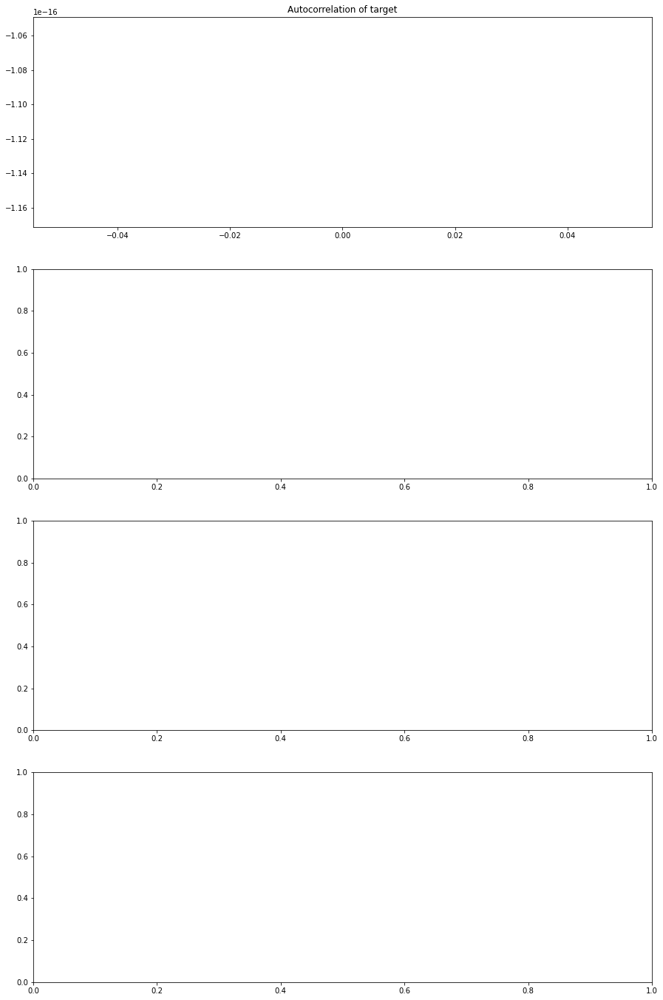

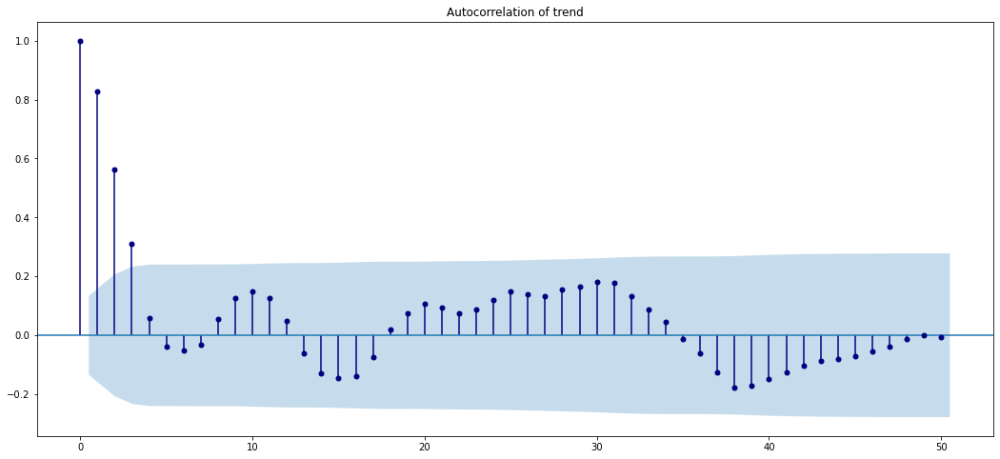

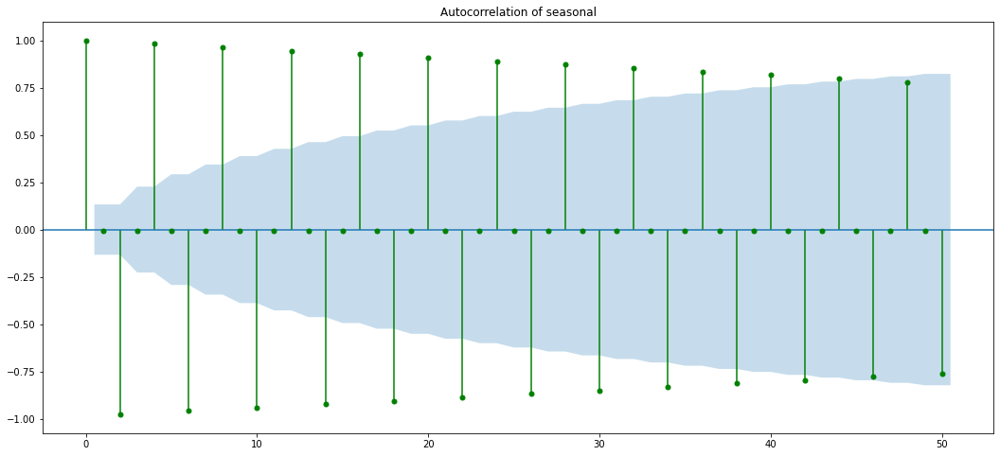

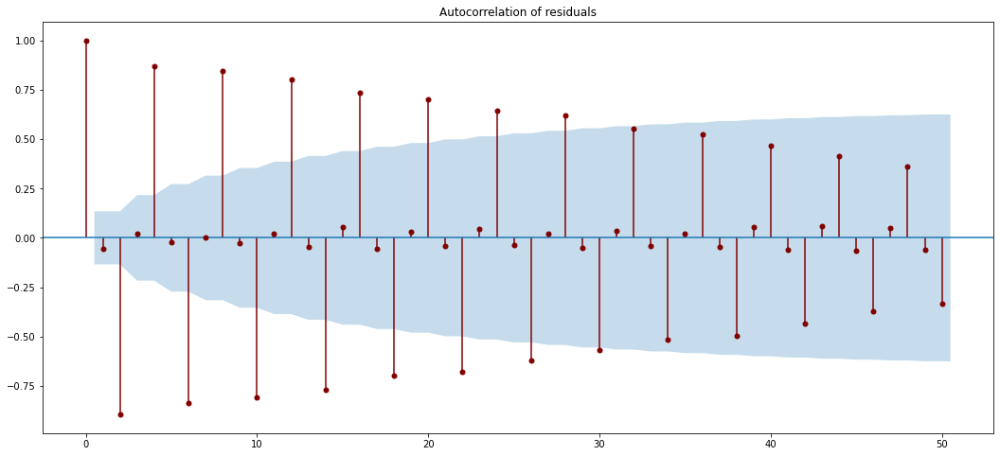

In [110]:
plot_ACF(aus_production['diff'], decomposition)

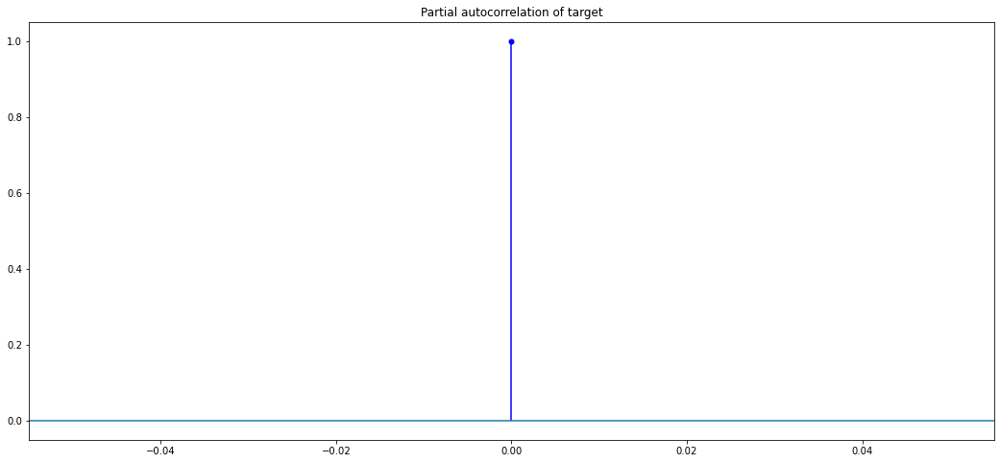

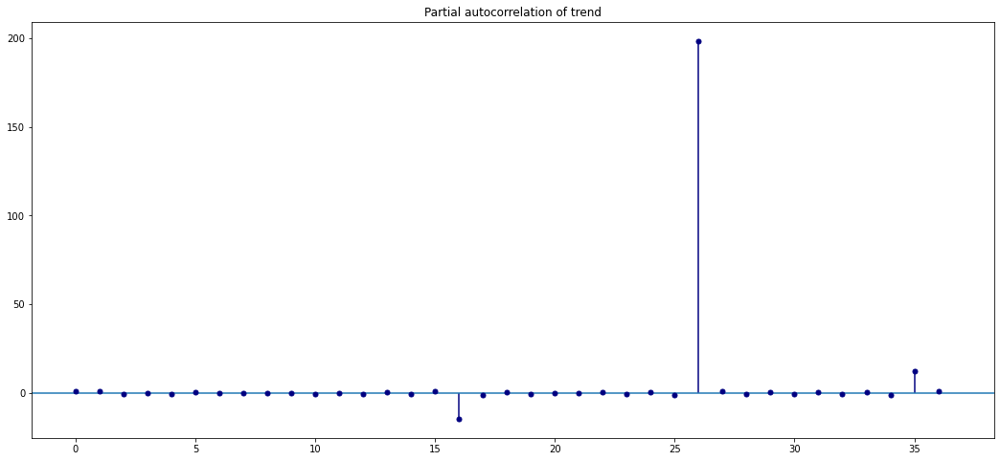

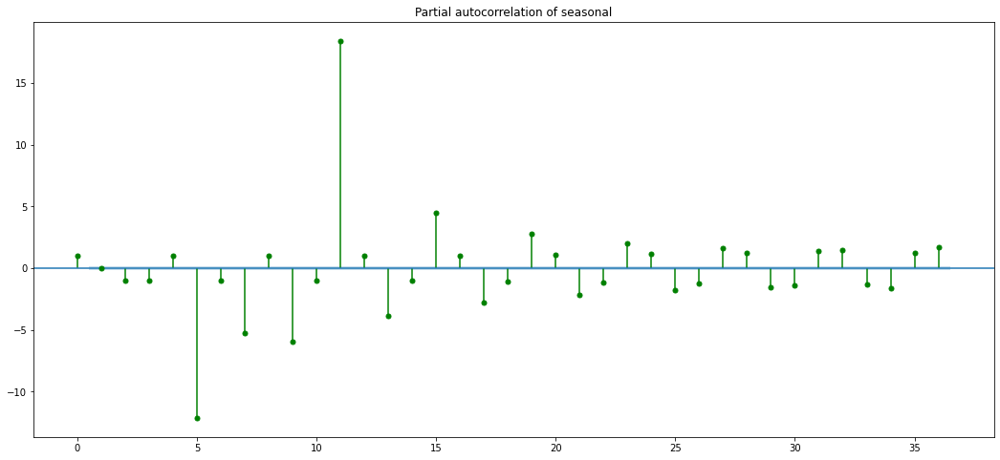

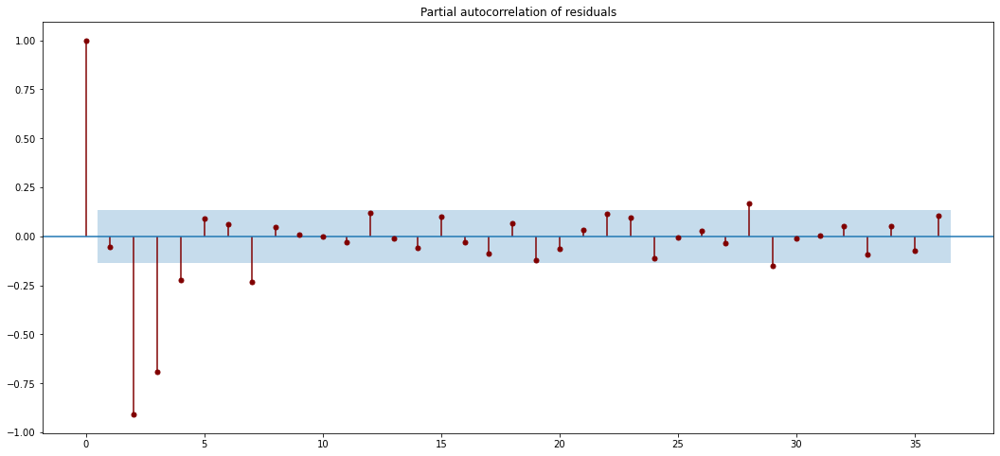

In [111]:
plot_PACF(aus_production['diff'], decomposition)

Непонятно, о чем говорят такие большие пинги...

## Change one observation to be an outlier (e.g., add 300 to one observation), and recompute the seasonally adjusted data. What is the effect of the outlier?


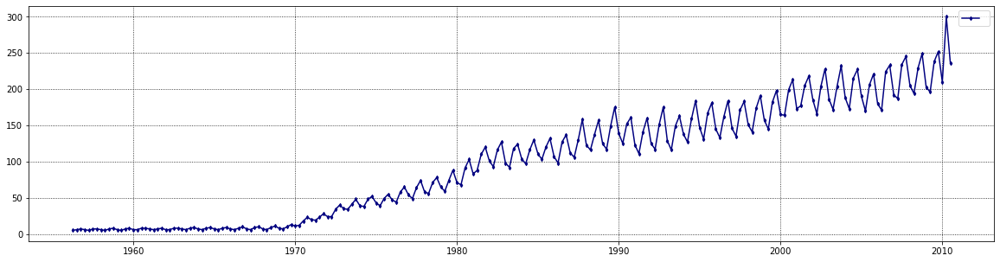

In [112]:
aus_production.iloc[-2, 0] = 300
aus_production['diff'] = aus_production['Gas']#.diff(1)

plot_series(aus_production['diff'])

In [113]:
get_stationary(aus_production['diff'].dropna())

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: 1.8794103617959603
p-value: 0.9984941642865512
The process is non-stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 1.4527098990560001
p-value = 0.01
The process is non-stationary by KPSS.



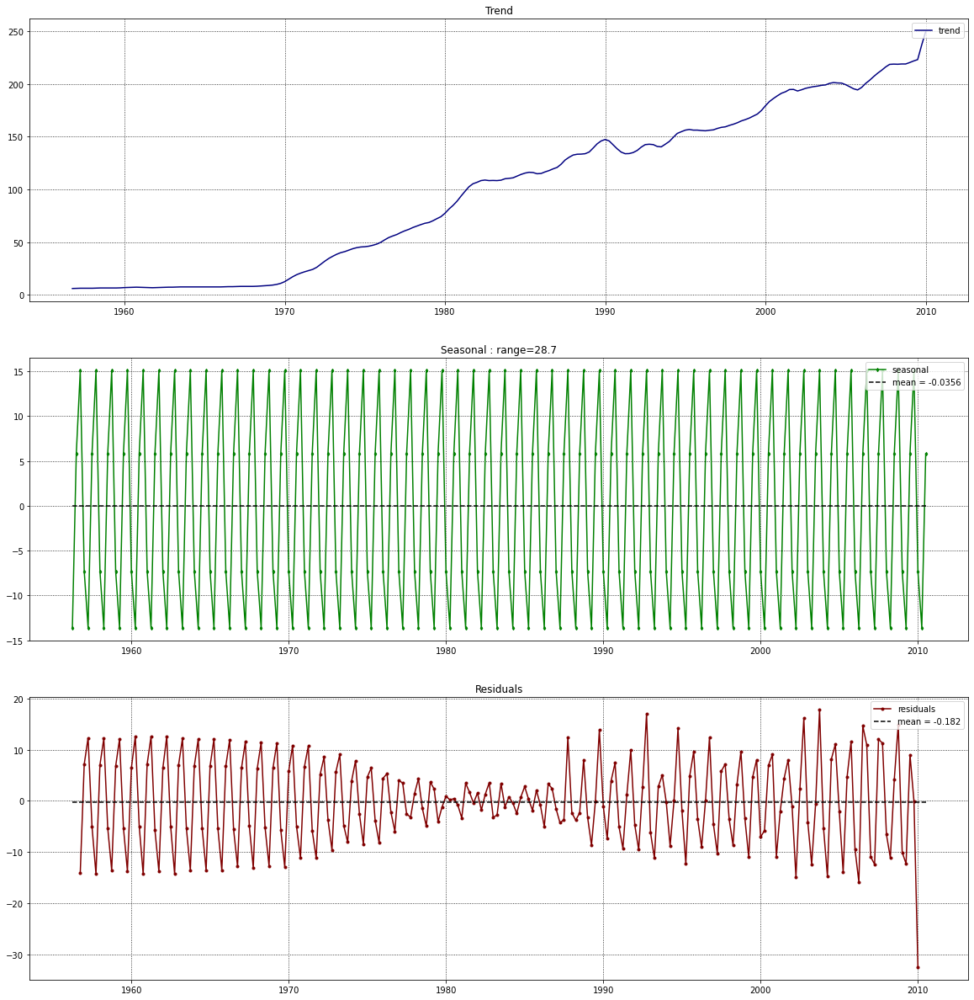

In [114]:
decomposition = seasonal_decompose(aus_production['diff'].dropna())
plot_decomposition(decomposition)

Это аутлаер повлиял только на остаток

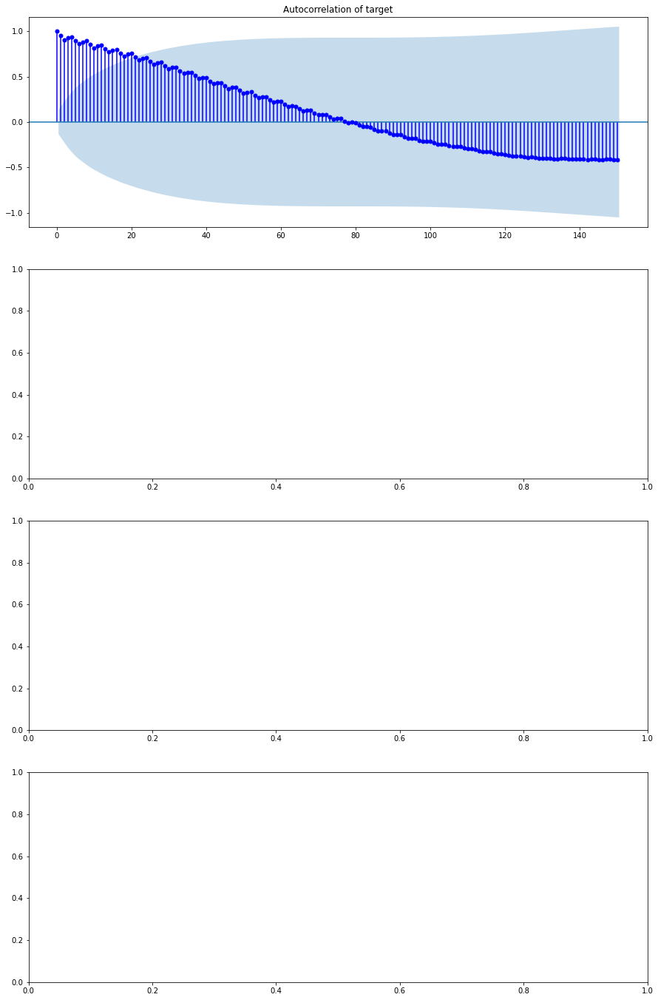

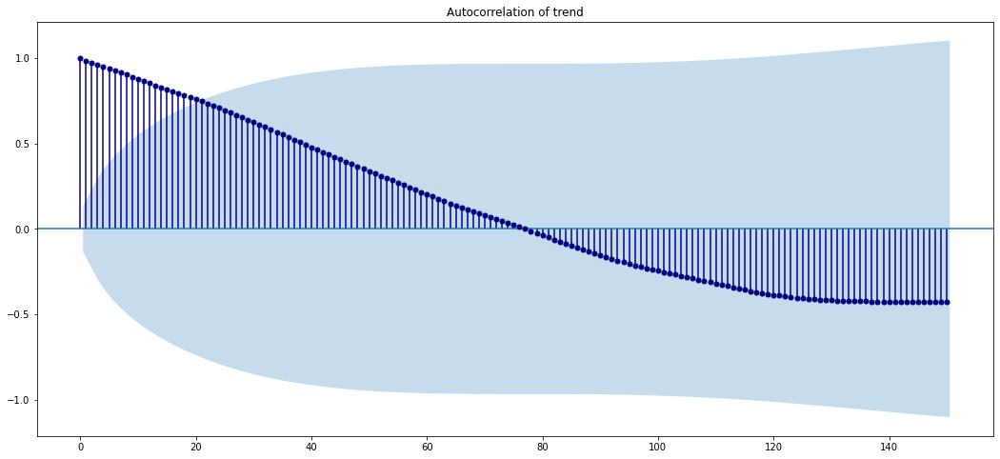

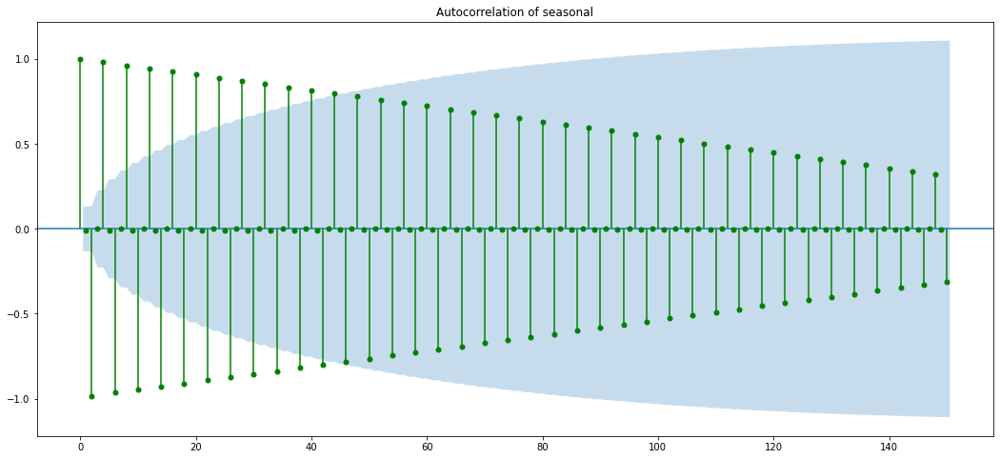

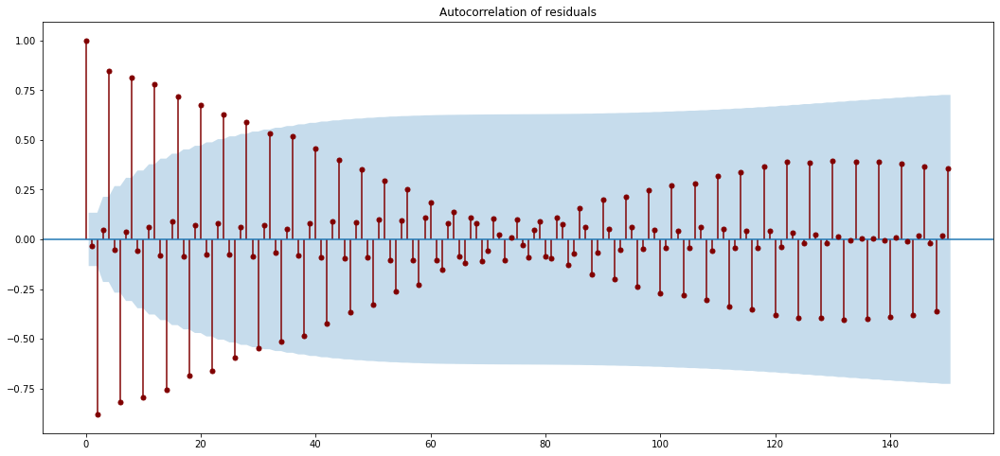

In [115]:
plot_ACF(aus_production['diff'], decomposition, lags=150)

## Does it make any difference if the outlier is near the end rather than in the middle of the time series?


In [116]:
aus_production.iloc[aus_production.shape[0] // 2, 0] = 300
aus_production['diff'] = aus_production['Gas']#.diff(1)

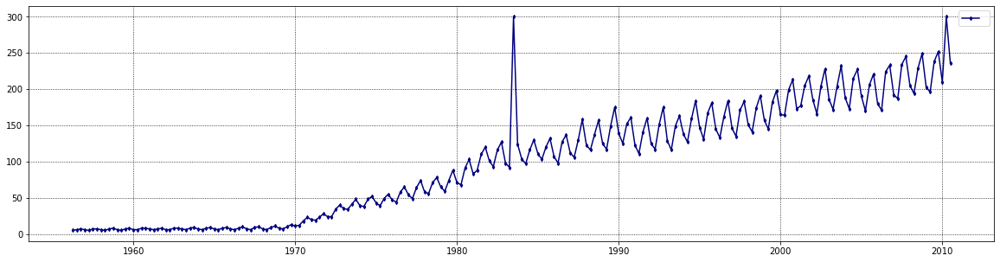

In [117]:
plot_series(aus_production['diff'])

In [118]:
get_stationary(aus_production['diff'].dropna())

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary) ====
ADF Statistic: 0.7977924232681234
p-value: 0.9916004499061872
The process is non-stationary by ADF.

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary) ====
KPSS Statistic = 1.4462821279783558
p-value = 0.01
The process is non-stationary by KPSS.



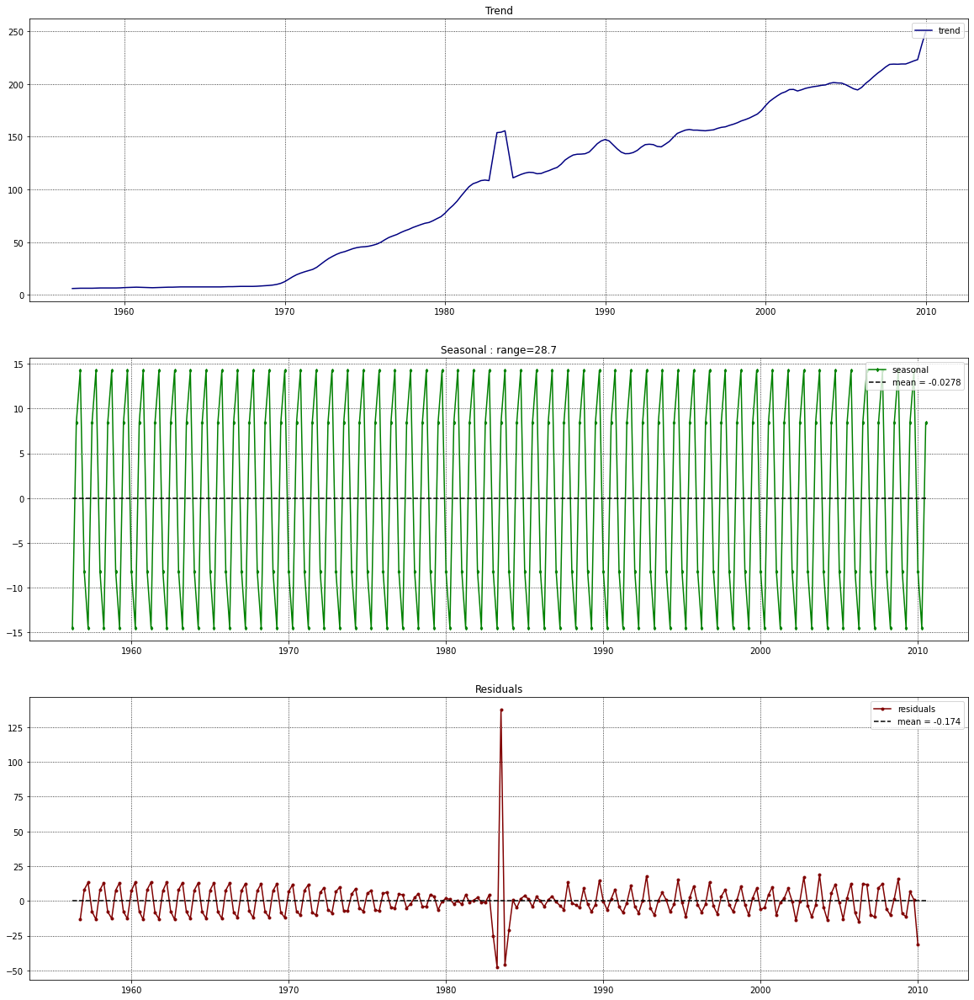

In [119]:
decomposition = seasonal_decompose(aus_production['diff'].dropna())
plot_decomposition(decomposition)

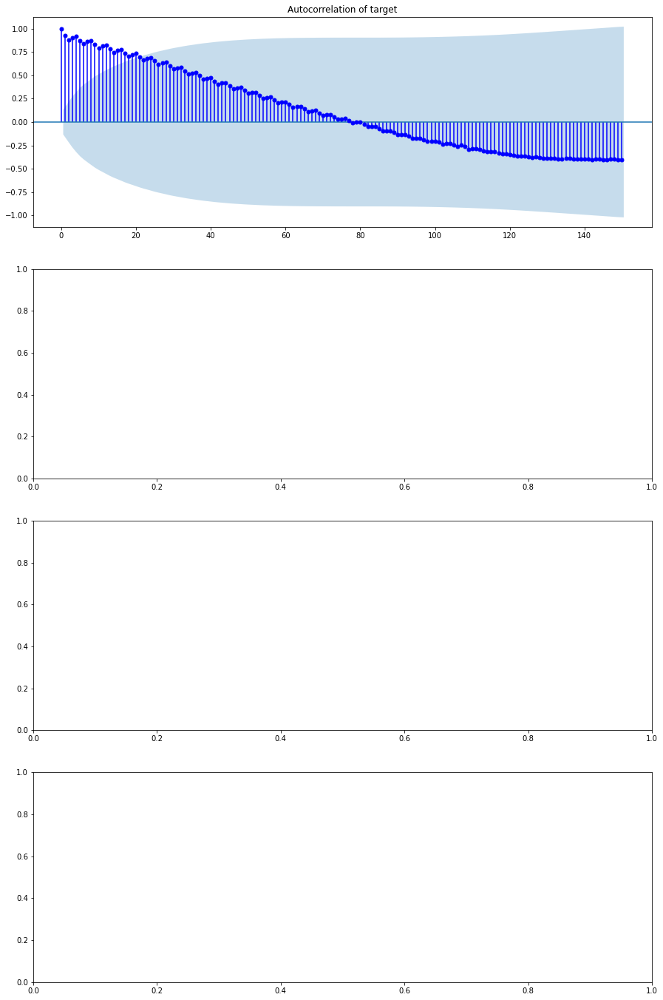

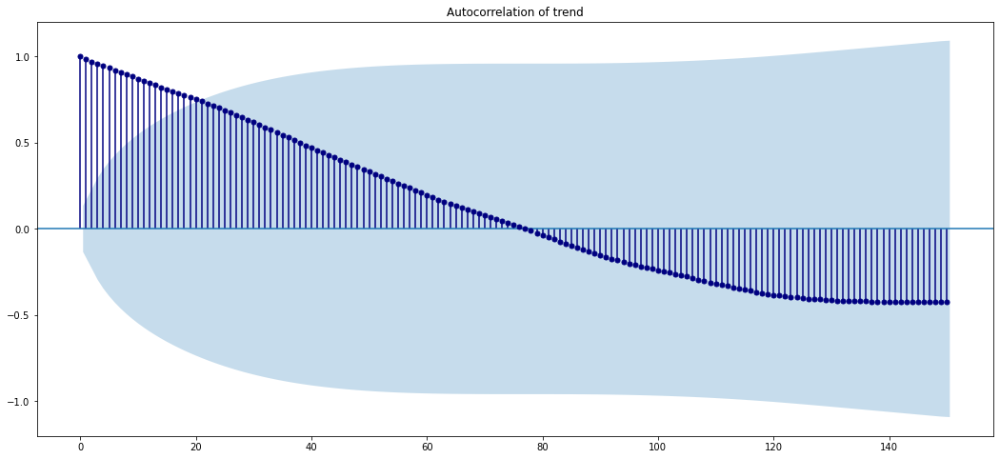

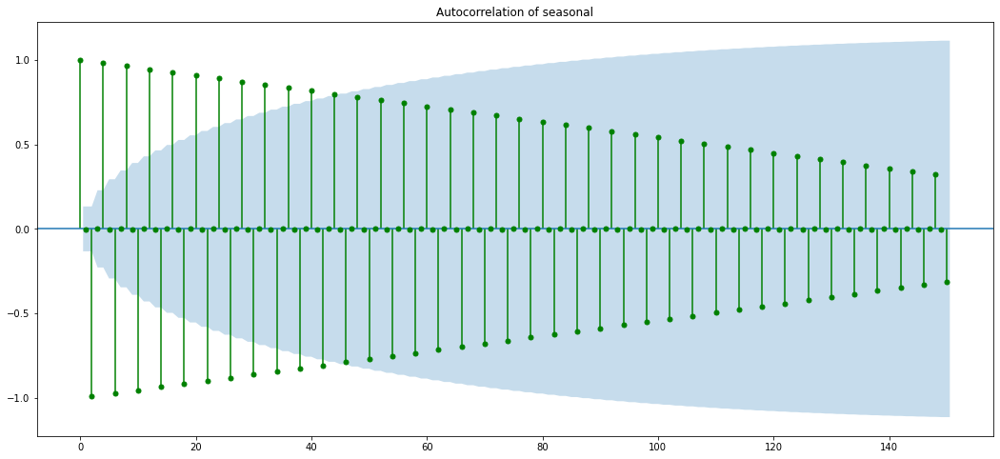

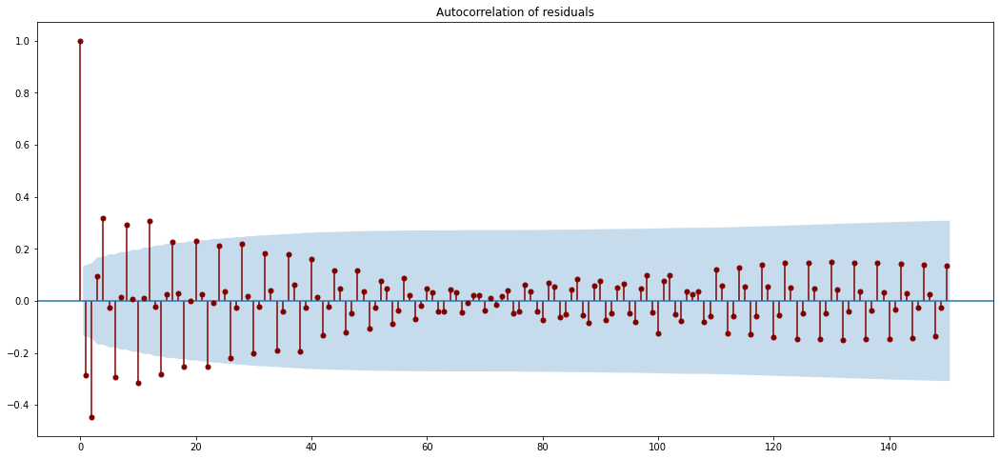

In [120]:
plot_ACF(aus_production['diff'], decomposition, lags=150)

В целом наличие аутлаеров в середине, в конце не влияет на Декомпозицию. Да, там выявляется сеазональность, а также растает ошибка в этих точках и тренд подскакивает. 

Наверно нам плохи аутлауры в конце ряда, когда мы хотим сделать predict.


Мне кажется, что я не прав, но выводы выше я сделал на основе декомпозиции и acf, pacf

Вопрос: если аутлаеры влияют на предикты, почему тогда на графиках acf pacf мы ничего не увидели

# Task 8

Recall your retail time series data (from Exercise 8 in Section 2.10). Decompose the series using X-11. Does it reveal any outliers, or unusual features that you had not noticed previously?



not now

# Task 9

Обсудим вместе :) 